# TODO

Data to store:

A. Timed trajectory in name of file along with the positions and data

B. Forces of each drone with timed trajectory in name of file

C. Betas of each dron with position and timed trajectory name of file 

D. Timed trajectory - under topic name "trajectory"

E. CHECK HOW TIME IS STORED AND SEND FROM DYNAMICAL MODEL BETTER

F. STAY IN POINT UNTIL REACH

Plots: 

A. Position leader in comparison to trajectory - DONE

B. Distances between quadcopters - collisions - DONE

C. Distances between quadcopters - connectivity - DONE

D. Forces and betas for all quadcopters

E. Position evolution of all quadcopters


# Prepare data - NOT NECESSARY WHEN TRAJECTORY STORAGE IS ADDED

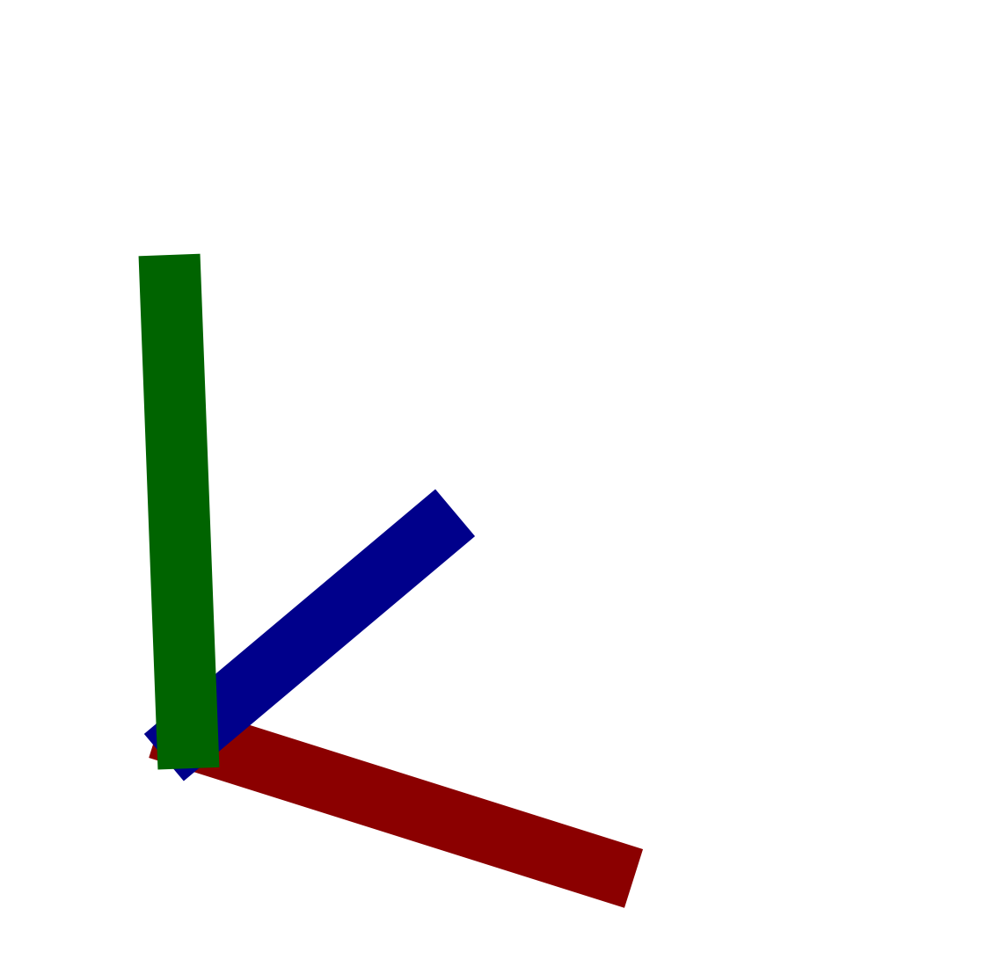

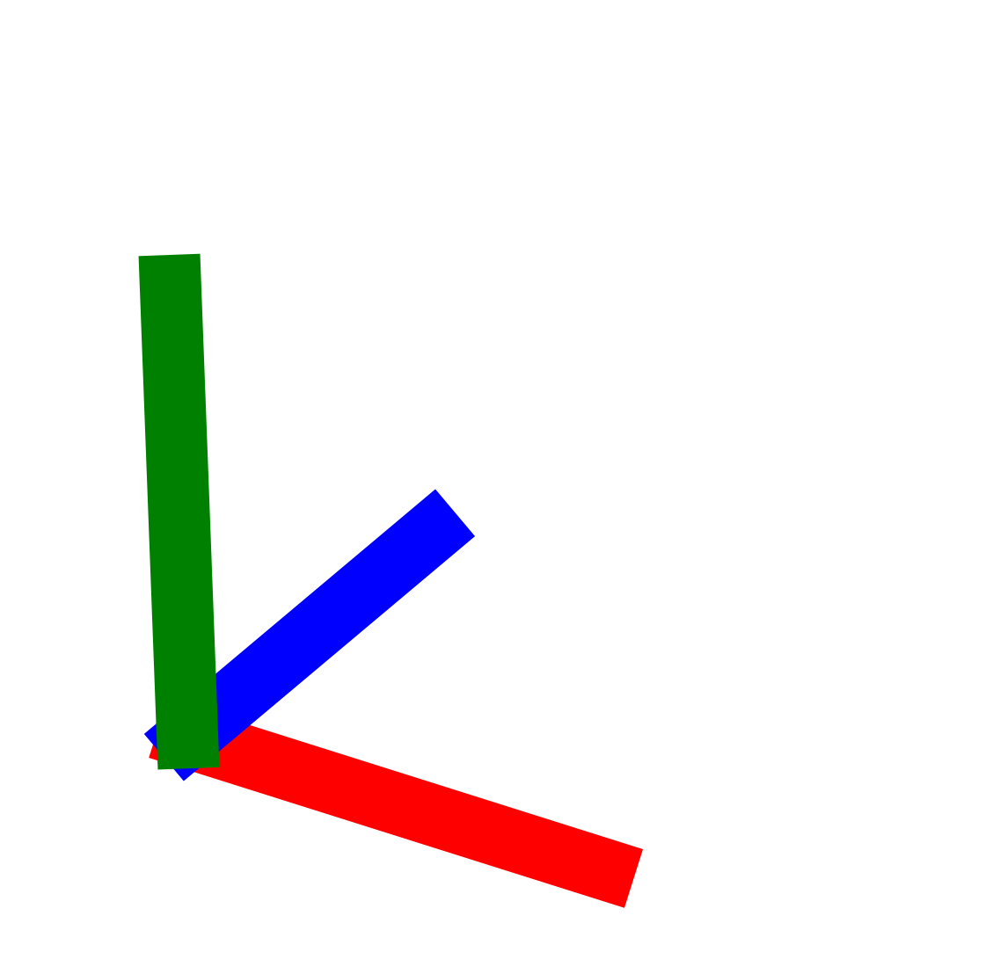

In [259]:
#for filename in glob.glob('*.npy'):
#    npyData = np.load(filename).item()
#    if not "trajectory" in npyData:
#        npyData["trajectory"] = {}
#        npyData["trajectory"]["pos"] = [[0, 0, 0.2],[0, 0, 2], [0, 0, 5], [4, 5, 3],[-2, 4, 2],[3, -2, 3],[1, -1, 2], [0, 0, 0]]
#        npyData["trajectory"]["time"] = [0.0, 15.0, 30.0, 45.0, 60.0, 75.0, 90.0, 105.0]
#    np.save("./modified_data", npyData)

from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize = (20,20))
ax = fig.add_subplot(111, projection='3d')

# Hide grid lines
ax.grid(False)

# Hide axes ticks
ax.set_xticks([])
ax.set_yticks([])
ax.set_zticks([])

ax.set_axis_off()
# make the panes transparent
ax.xaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax.yaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax.zaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
# make the grid lines transparent
ax.xaxis._axinfo["grid"]['color'] =  (1,1,1,0)
ax.yaxis._axinfo["grid"]['color'] =  (1,1,1,0)
ax.zaxis._axinfo["grid"]['color'] =  (1,1,1,0)
pos = np.array([0, 0, 0])
length = 1
linew = 70
plt.plot([pos[0], pos[0] + length], [pos[1], pos[1]], [pos[2], pos[2]], color = "darkred", linewidth = linew )
plt.plot([pos[0], pos[0]], [pos[1], pos[1] + length], [pos[2], pos[2]], color = "darkblue", linewidth = linew )
plt.plot([pos[0], pos[0]], [pos[1], pos[1]], [pos[2], pos[2] + length], color = "darkgreen" , linewidth = linew)
plt.savefig("./utils/axisDark.png", bbox_inches='tight')

fig = plt.figure(figsize = (20,20))
ax = fig.add_subplot(111, projection='3d')

# Hide grid lines
ax.grid(False)

# Hide axes ticks
ax.set_xticks([])
ax.set_yticks([])
ax.set_zticks([])

ax.set_axis_off()
# make the panes transparent
ax.xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax.yaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
ax.zaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
# make the grid lines transparent
ax.xaxis._axinfo["grid"]['color'] =  (1,1,1,0)
ax.yaxis._axinfo["grid"]['color'] =  (1,1,1,0)
ax.zaxis._axinfo["grid"]['color'] =  (1,1,1,0)
plt.plot([pos[0], pos[0] + length], [pos[1], pos[1]], [pos[2], pos[2]], color = "red" , linewidth = linew)
plt.plot([pos[0], pos[0]], [pos[1], pos[1] + length], [pos[2], pos[2]], color = "blue" , linewidth =linew)
plt.plot([pos[0], pos[0]], [pos[1], pos[1]], [pos[2], pos[2] + length], color = "green" , linewidth =linew)
plt.savefig("./utils/axisClear.png", bbox_inches='tight')

plt.show()



# Unpack data

In [181]:
import glob
import numpy as np
from pyquaternion import Quaternion

data = {}
for filename in glob.glob('*.npy'):
    data[filename.split(".")[0].split("_")[-2] + "_" + filename.split(".")[0].split("_")[-1]] = np.load(filename, encoding = "latin1").item()
    
length = 0.2



# Get position leader

In [182]:
position_leader = {}
trajectory_data = {}
for key in data.keys():
    position_leader[key] = {}
    position_leader[key]["pos"] = data[key]["crazyflie_0"]["pos"]
    position_leader[key]["time"] = sorted(data[key]["crazyflie_0"]["time"])
    trajectory_data[key] = {}
    trajectory_data[key]["pos"] = np.array(data[key]["trajectory"]["pos"])
    trajectory_data[key]["time"] = sorted(data[key]["trajectory"]["time"])

# Create subplots and individual plots

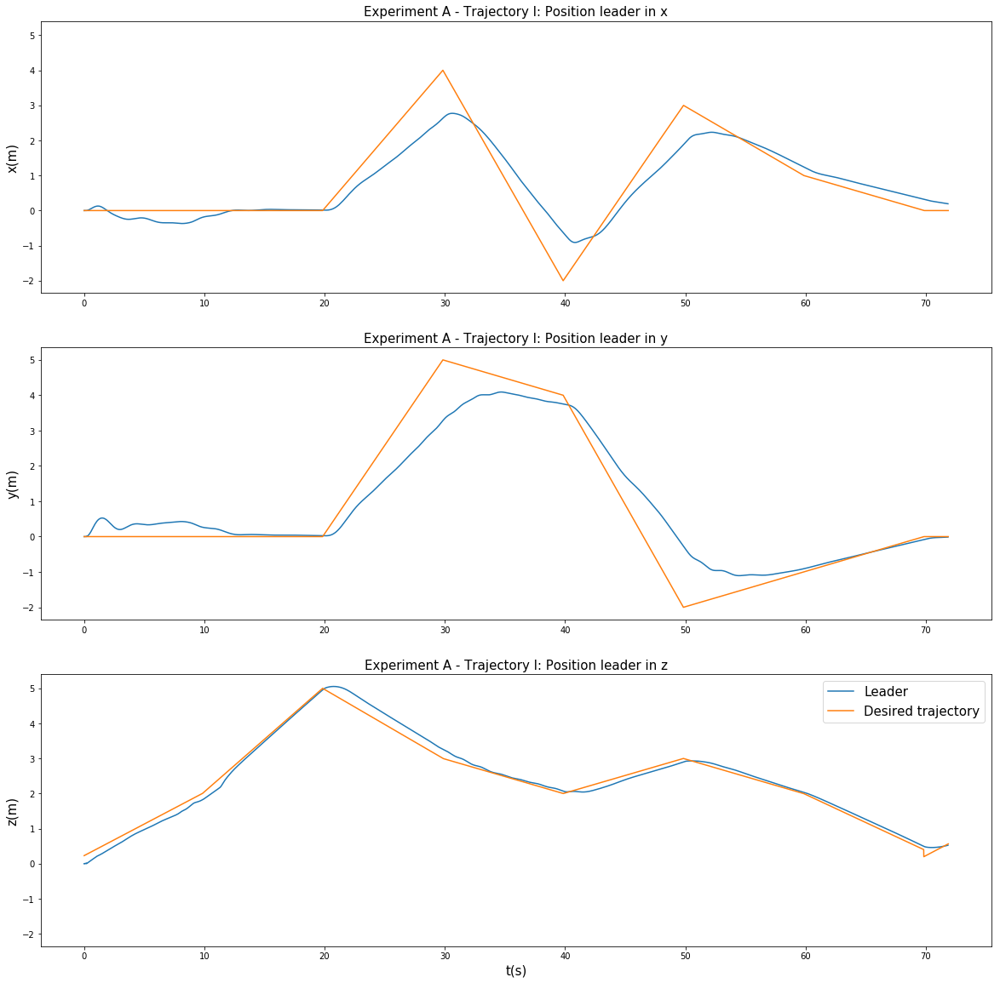

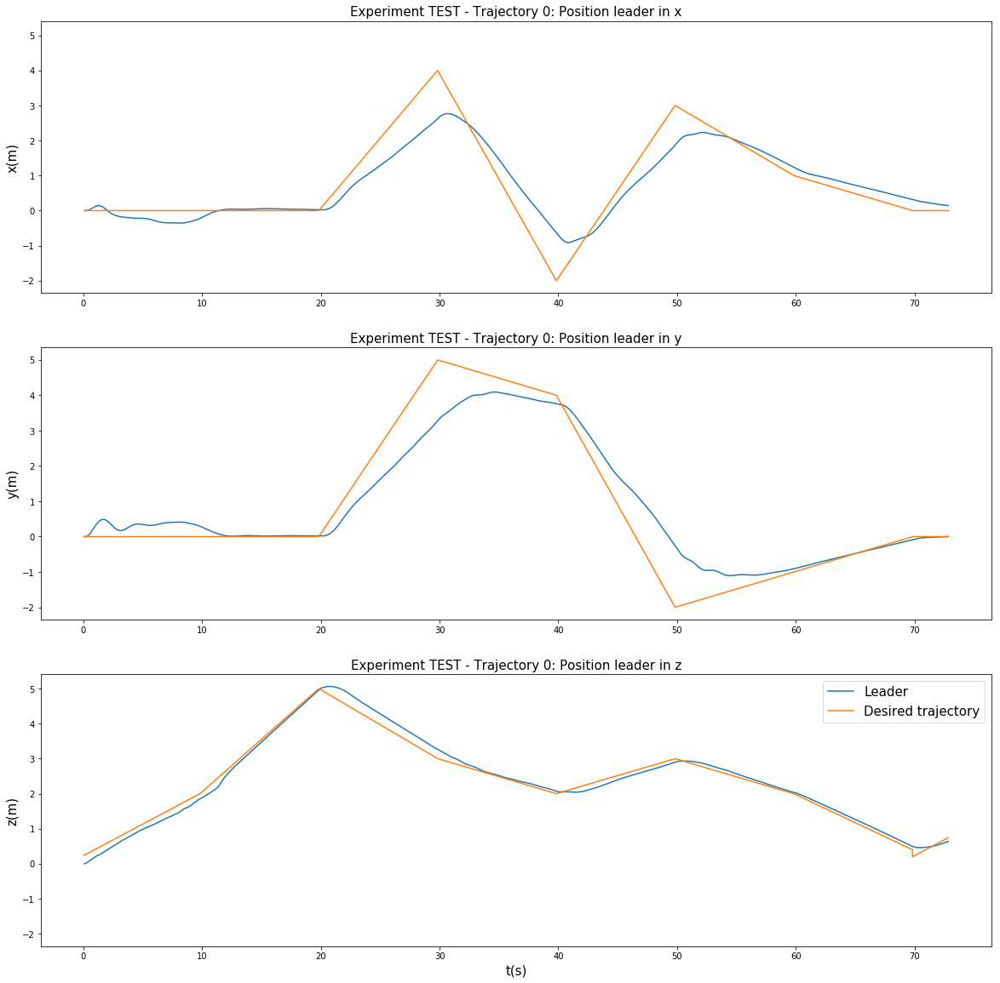

In [183]:
import matplotlib.pyplot as plt

for key in data.keys():
    fig = plt.figure(figsize=(20, 20))
    
    ax1 = plt.subplot(311)

    plt.plot(position_leader[key]["time"], position_leader[key]["pos"][:, 0], label = "Leader")
    plt.plot(trajectory_data[key]["time"], trajectory_data[key]["pos"][:, 0], label = "Desired trajectory")
    
    plt.title("Experiment " + key.split("_")[0] + " - Trajectory " + key.split("_")[1] + ": Position leader in x", fontsize=15)
    plt.ylabel("x(m)", fontsize=15)
    plt.setp(ax1.get_xticklabels(), fontsize=10)

    # share x only
    ax2 = plt.subplot(312, sharex=ax1)
    plt.plot(position_leader[key]["time"], position_leader[key]["pos"][:, 1], label = "Leader")
    plt.plot(trajectory_data[key]["time"], trajectory_data[key]["pos"][:, 1], label = "Desired trajectory")
    
    plt.title("Experiment " + key.split("_")[0] + " - Trajectory " + key.split("_")[1] + ": Position leader in y", fontsize=15)
    plt.ylabel("y(m)", fontsize=15)
    plt.setp(ax1.get_xticklabels(), fontsize=10)

    # share x and y
    ax3 = plt.subplot(313, sharex=ax1, sharey=ax1)
    plt.plot(position_leader[key]["time"], position_leader[key]["pos"][:, 2], label = "Leader")
    plt.plot(trajectory_data[key]["time"], trajectory_data[key]["pos"][:, 2], label = "Desired trajectory")
    
    plt.title("Experiment " + key.split("_")[0] + " - Trajectory " + key.split("_")[1] + ": Position leader in z", fontsize=15)
    plt.ylabel("z(m)", fontsize=15)   
    plt.xlabel("t(s)", fontsize=15)   
    plt.setp(ax1.get_xticklabels(), fontsize=10)
    plt.legend(fontsize=15)
    plt.savefig("./images/leader_2D_experiment_" + key + ".png", bbox_inches='tight')
    plt.savefig("./images/leader_2D_experiment_" + key + ".eps", bbox_inches='tight')
    plt.show()

# 3D leader trajectory

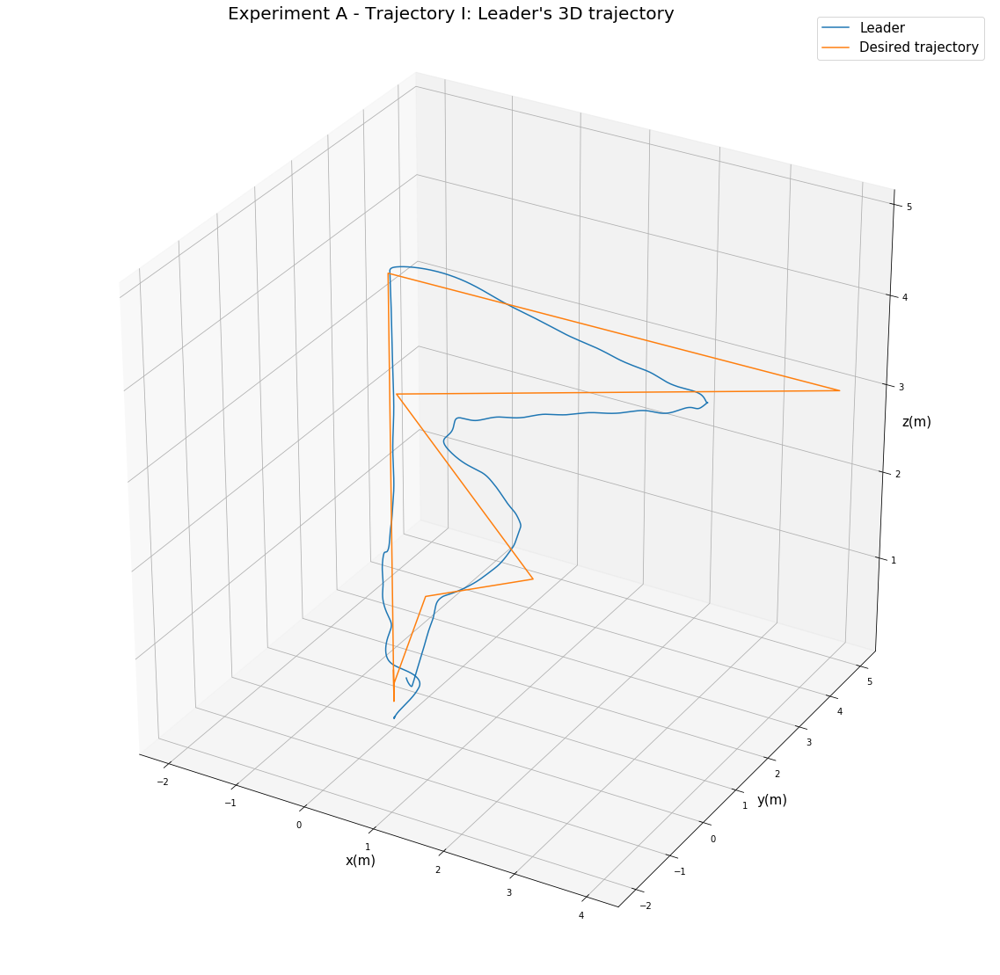

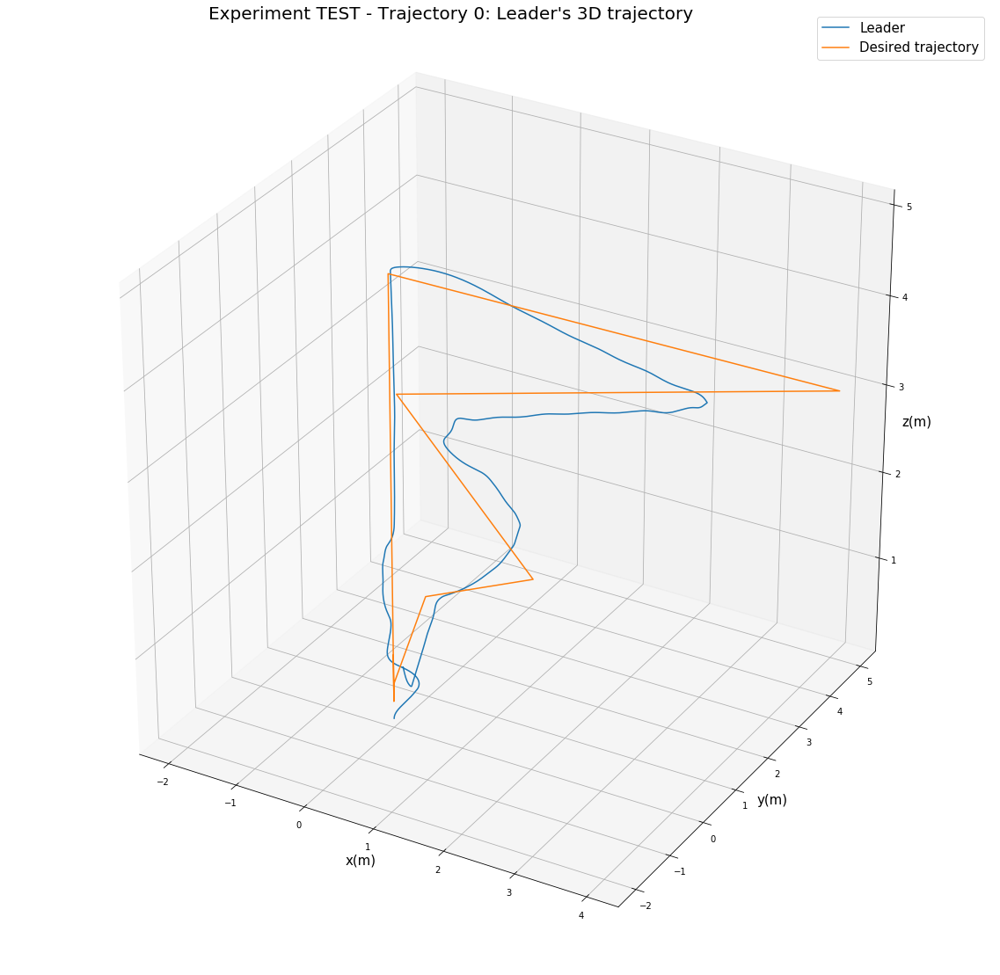

In [184]:
from mpl_toolkits.mplot3d import Axes3D

for key in data.keys():
    fig = plt.figure(figsize = (20,20))
    ax = fig.add_subplot(111, projection='3d')
    
    plt.plot(position_leader[key]["pos"][:, 0], position_leader[key]["pos"][:, 1], position_leader[key]["pos"][:, 2], label = "Leader")   
    plt.plot(trajectory_data[key]["pos"][:, 0], trajectory_data[key]["pos"][:, 1], trajectory_data[key]["pos"][:, 2], label = "Desired trajectory")
    ax.set_xlabel("x(m)", fontsize=15)   
    ax.set_ylabel("y(m)", fontsize=15)   
    ax.set_zlabel("z(m)", fontsize=15)   
    plt.title("Experiment " + key.split("_")[0] + " - Trajectory " + key.split("_")[1] + ": Leader's 3D trajectory", fontsize = 20, x = 0.45, y = 1.07)
    plt.legend(fontsize=15)
    plt.savefig("./images/leader_3D_experiment_" + key + ".png", bbox_inches='tight')
    plt.savefig("./images/leader_3D_experiment_" + key + ".eps", bbox_inches='tight')
    plt.show()

# Interpolation

In [185]:
from scipy.interpolate import interp1d

for experiment in data.keys():
    maxTime = 1e20
    minTime = -1e20
    for key in data[experiment].keys():
        if key.split("_")[0] == "crazyflie":
            data[experiment][key]["interpolation"] = {}
            data[experiment][key]["interpolation"]["x"] = interp1d(data[experiment][key]["time"], data[experiment][key]["pos"][:, 0], kind='cubic')
            data[experiment][key]["interpolation"]["y"] = interp1d(data[experiment][key]["time"], data[experiment][key]["pos"][:, 1], kind='cubic')
            data[experiment][key]["interpolation"]["z"] = interp1d(data[experiment][key]["time"], data[experiment][key]["pos"][:, 2], kind='cubic')
            maxTime = min(maxTime, max(data[experiment][key]["time"]))   
            minTime = max(minTime, min(data[experiment][key]["time"]))
    data[experiment]["distanceTime"] = np.arange(minTime, maxTime, 0.01)

# 3D position all

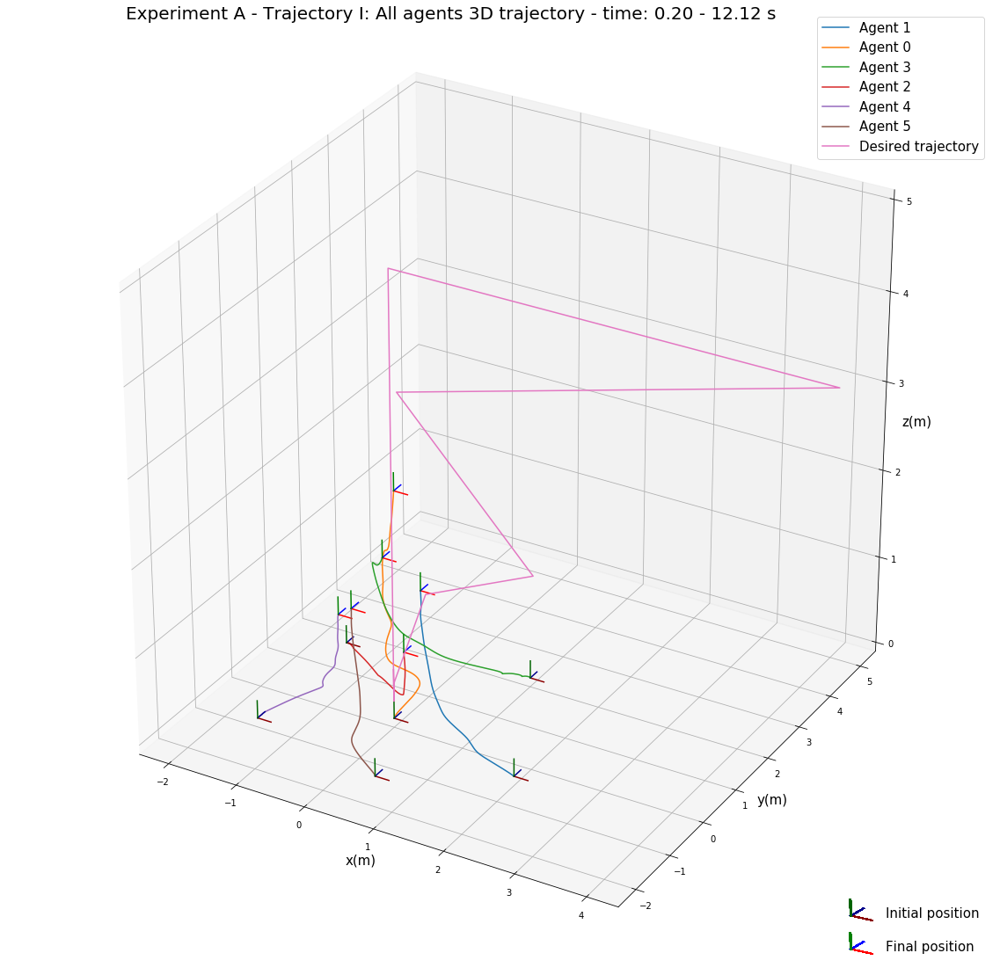

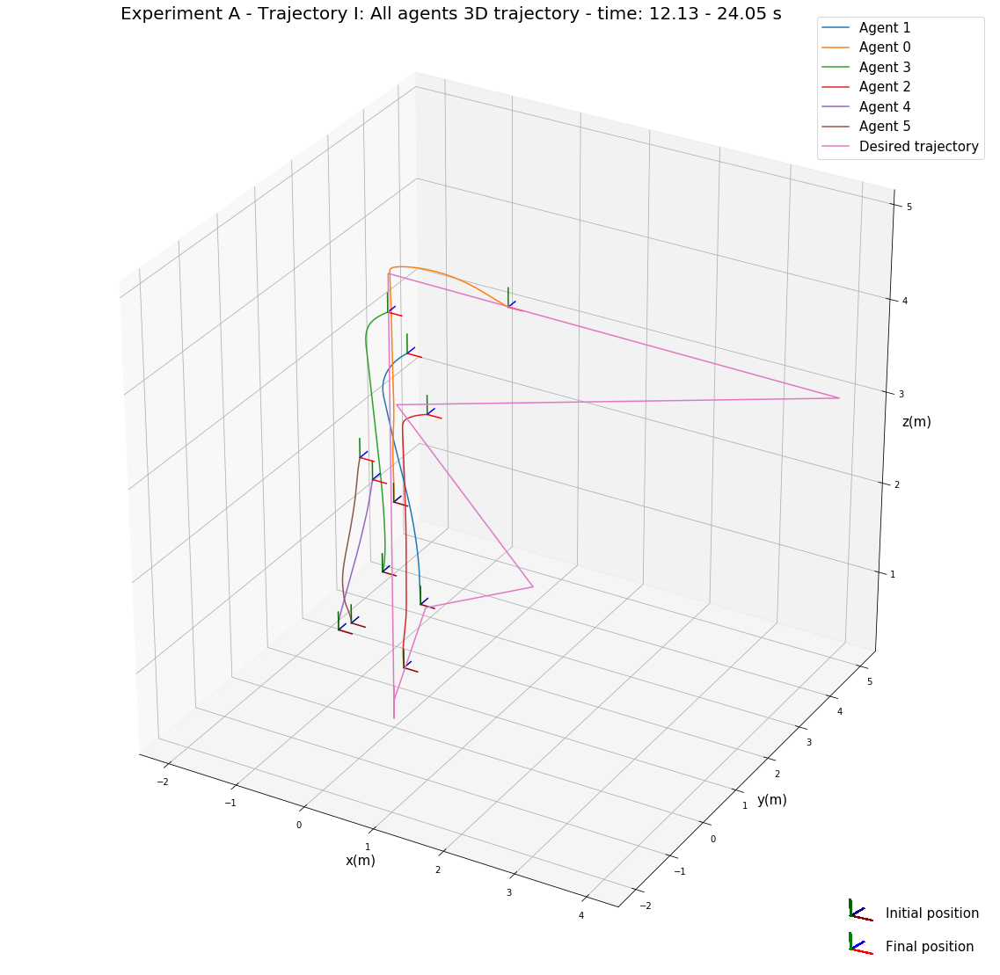

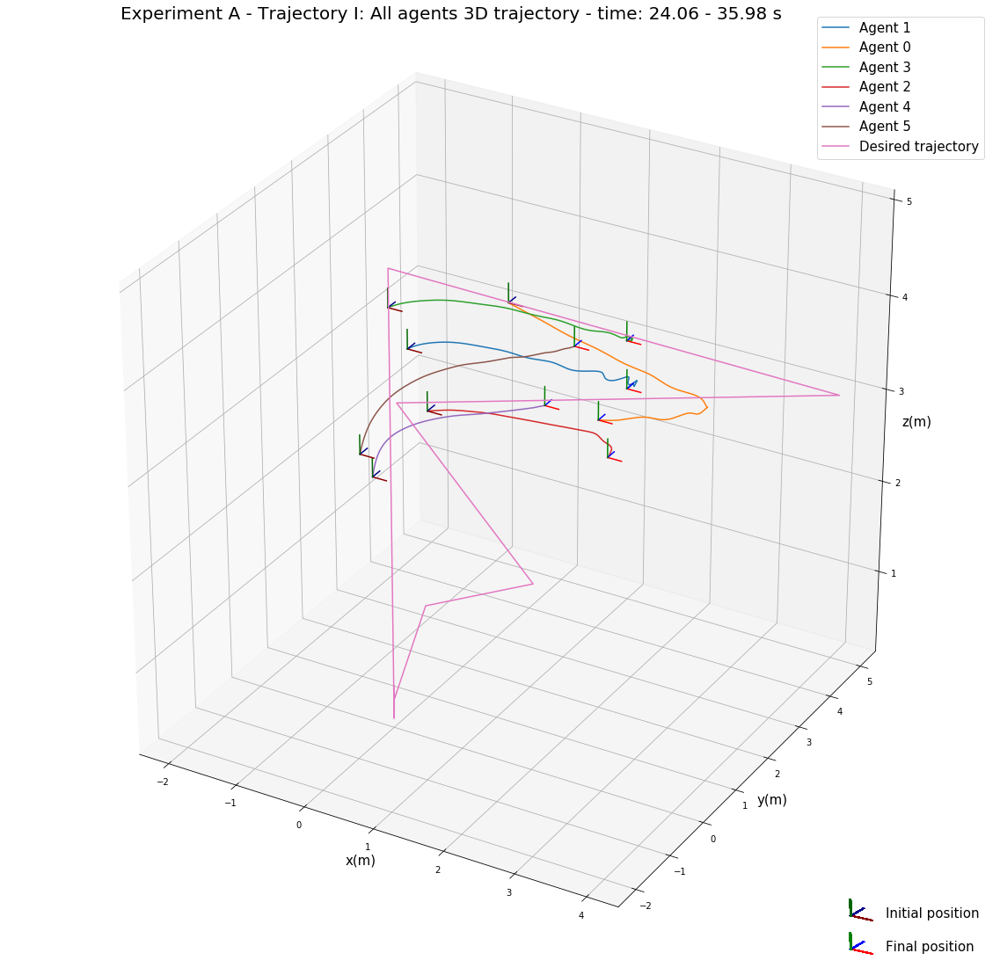

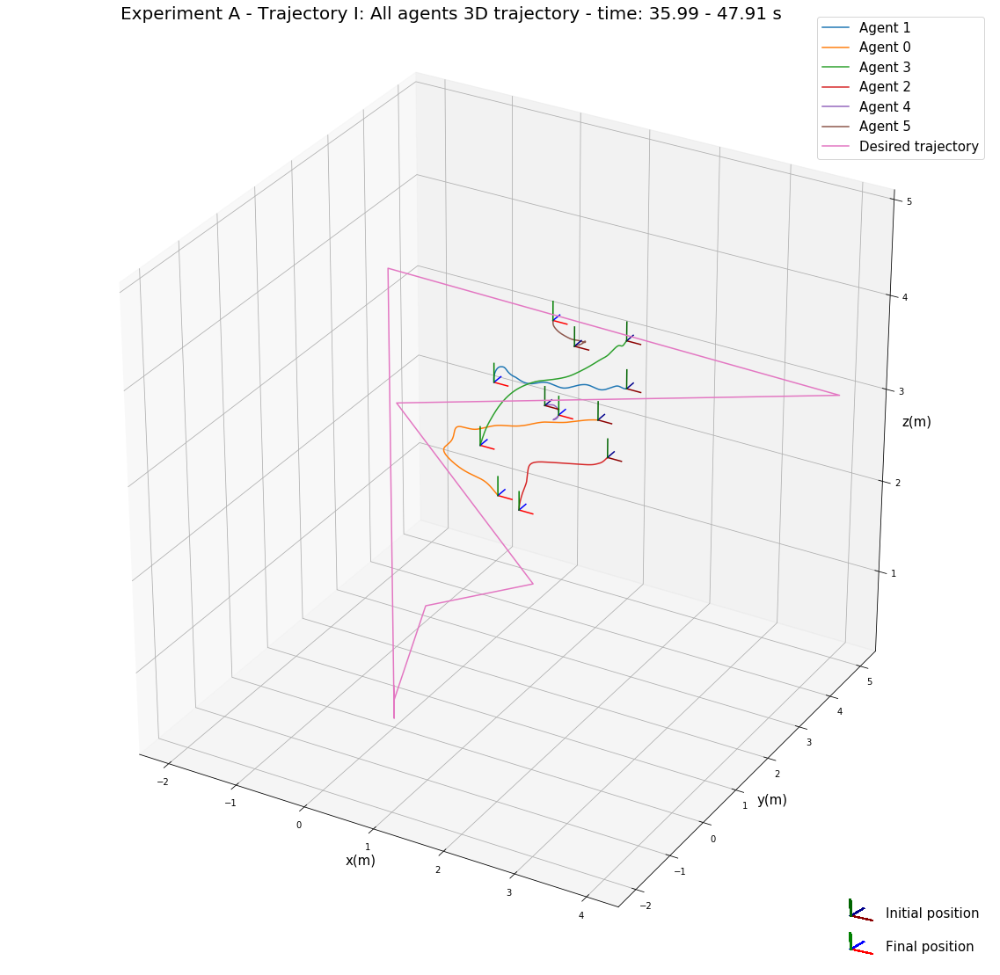

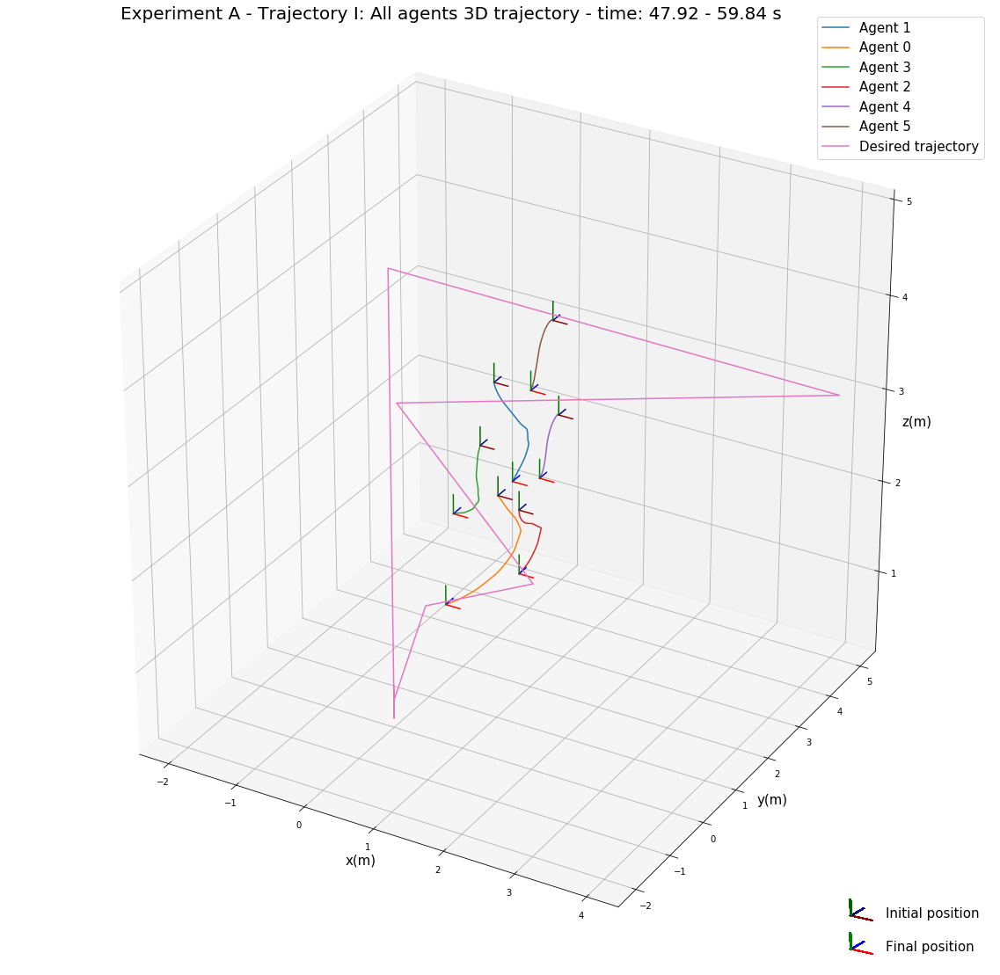

In [ ]:
import os
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.transforms import TransformedBbox
from matplotlib.image import BboxImage
from matplotlib.legend_handler import HandlerBase
from matplotlib._png import read_png
import matplotlib.lines
from matplotlib.transforms import Bbox

class HandlerLineImage(HandlerBase):

    def __init__(self, path, space=15, offset = 10):
        self.space=space
        self.offset=offset
        self.image_data = plt.imread(path)  
        super(HandlerLineImage, self).__init__()

    def create_artists(self, legend, orig_handle,
                       xdescent, ydescent, width, height, fontsize, trans):

      

        bb = Bbox.from_bounds(xdescent - 8,
                              ydescent - 7,
                              0.05*self.image_data.shape[1],
                              0.035*self.image_data.shape[0])

        tbb = TransformedBbox(bb, trans)
        image = BboxImage(tbb)
        image.set_data(self.image_data)

        self.update_prop(image, orig_handle, legend)
        return [image]


class ImageHandler(HandlerBase):
    def create_artists(self, legend, orig_handle,
                       xdescent, ydescent, width, height, fontsize):

        # enlarge the image by these margins
        sx, sy = self.image_stretch 

        # create a bounding box to house the image
        bb = Bbox.from_bounds(xdescent - sx,
                              ydescent - sy,
                              width + sx,
                              height + sy)

        tbb = TransformedBbox(bb, trans)
        image = BboxImage(tbb)
        image.set_data(self.image_data)

        self.update_prop(image, orig_handle, legend)

        return [image]

    def set_image(self, image_path, image_stretch=(0, 0)):
        if not os.path.exists(image_path):
            print("File does not exist")
        else:
            self.image_data = read_png(image_path)

        self.image_stretch = image_stretch
        
numDivisions = 6
length = 0.2
custom_handler_dark = ImageHandler()
custom_handler_dark.set_image("./utils/axisDark.png",
                         image_stretch=(0, 20)) 
custom_handler_clear = ImageHandler()
custom_handler_clear.set_image("./utils/axisClear.png",
                         image_stretch=(0, 20)) 
for experiment in data.keys():
    experimentTime = data[experiment]["distanceTime"]
    dividedIndex = len(experimentTime)/numDivisions
    dividedTime = (max(experimentTime) - min(experimentTime))/numDivisions
    listTimeToPosition = [(i + 1)*dividedTime for i in np.arange(numDivisions)]
    listIndexes = [(i)*dividedIndex for i in np.arange(numDivisions)]
    for i in np.arange(numDivisions-1):
        fig = plt.figure(figsize = (20,20))
        ax = fig.add_subplot(111, projection='3d')
        for key in data[experiment].keys():
            if key.split("_")[0] == 'crazyflie':
                time = experimentTime[listIndexes[i]:listIndexes[i+1]]
                plt.plot(data[experiment][key]["interpolation"]["x"](time), data[experiment][key]["interpolation"]["y"](time), data[experiment][key]["interpolation"]["z"](time), label = "Agent " + key.split("_")[1])   
                
                pos = np.array([data[experiment][key]["interpolation"]["x"]([time[0]]), data[experiment][key]["interpolation"]["y"]([time[0]]), data[experiment][key]["interpolation"]["z"]([time[0]])])
                pos = pos[:,0]
                dark, = plt.plot([pos[0], pos[0] + length], [pos[1], pos[1]], [pos[2], pos[2]], color = "darkred")
                plt.plot([pos[0], pos[0]], [pos[1], pos[1] + length], [pos[2], pos[2]], color = "darkblue" )
                plt.plot([pos[0], pos[0]], [pos[1], pos[1]], [pos[2], pos[2] + length], color = "darkgreen" )
                pos = np.array([data[experiment][key]["interpolation"]["x"](time[-1]), data[experiment][key]["interpolation"]["y"]([time[-1]]), data[experiment][key]["interpolation"]["z"]([time[-1]])])
                clear, = plt.plot([pos[0], pos[0] + length], [pos[1], pos[1]], [pos[2], pos[2]], color = "red" )
                plt.plot([pos[0], pos[0]], [pos[1], pos[1] + length], [pos[2], pos[2]], color = "blue" )
                plt.plot([pos[0], pos[0]], [pos[1], pos[1]], [pos[2], pos[2] + length], color = "green" )
        
        plt.plot(trajectory_data[experiment]["pos"][:, 0], trajectory_data[experiment]["pos"][:, 1], trajectory_data[experiment]["pos"][:, 2], label = "Desired trajectory")
        ax.set_xlabel("x(m)", fontsize=15)   
        ax.set_ylabel("y(m)", fontsize=15)   
        ax.set_zlabel("z(m)", fontsize=15)   
        plt.title("Experiment " + experiment.split("_")[0] + " - Trajectory " + experiment.split("_")[1] + ": All agents 3D trajectory - time: " + "{:.2f}".format(time[0]) + " - " + "{:.2f}".format(time[-1]) + " s", fontsize = 20, x = 0.45, y = 1.07)
        legend = plt.legend(fontsize=15)
        plt.legend([dark, clear], ["Initial position", "Final position"], handler_map={dark: HandlerLineImage("./utils/axisDark.png"), clear:  HandlerLineImage("./utils/axisClear.png")},
           labelspacing=1.5,
           frameon=False, fontsize=15, loc= 4)
        plt.gca().add_artist(legend)
        plt.savefig("./images/all_3D_experiment_" + experiment + "_time" + str(i) + ".png", bbox_inches='tight')
        plt.savefig("./images/all_3D_experiment_" + experiment + "_time" + str(i) + ".eps", bbox_inches='tight')
        plt.show()

# Collision distances

In [15]:
for experiment in data.keys():
    counter = 0
    experimentTime = data[experiment]["distanceTime"]
    for ids in data[experiment].keys():
        if ids.split("_")[0] == 'crazyflie':
            counter = counter + 1
    for i in np.arange(counter):
        for j in np.arange(i + 1, counter):
            data[experiment]["distanceCol_" + str(i) + "_" + str(j)] = np.sqrt((data[experiment]["crazyflie_" + str(i)]["interpolation"]["x"](experimentTime) - data[experiment]["crazyflie_" + str(j)]["interpolation"]["x"](experimentTime))**2 +  
                                                                              (data[experiment]["crazyflie_" + str(i)]["interpolation"]["y"](experimentTime) - data[experiment]["crazyflie_" + str(j)]["interpolation"]["y"](experimentTime))**2 +
                                                                             (data[experiment]["crazyflie_" + str(i)]["interpolation"]["z"](experimentTime) - data[experiment]["crazyflie_" + str(j)]["interpolation"]["z"](experimentTime))**2)

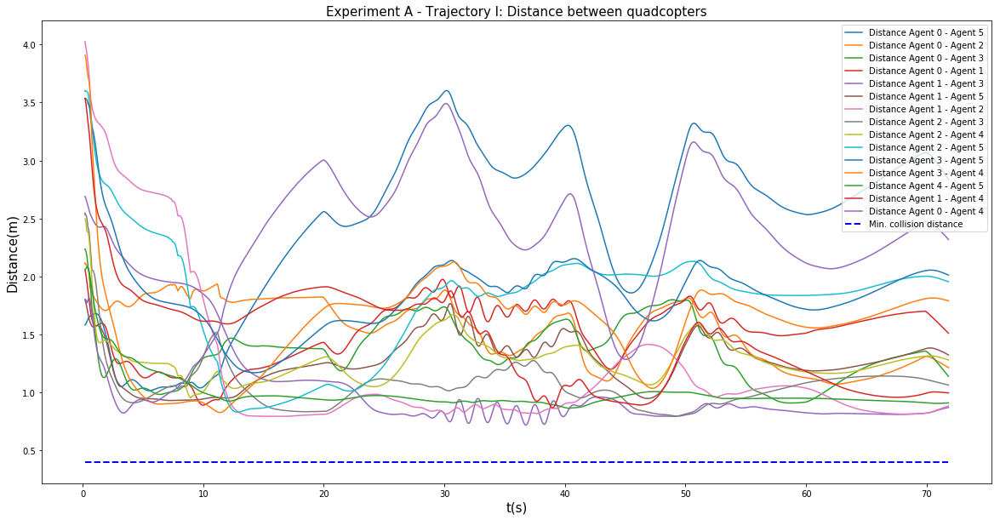

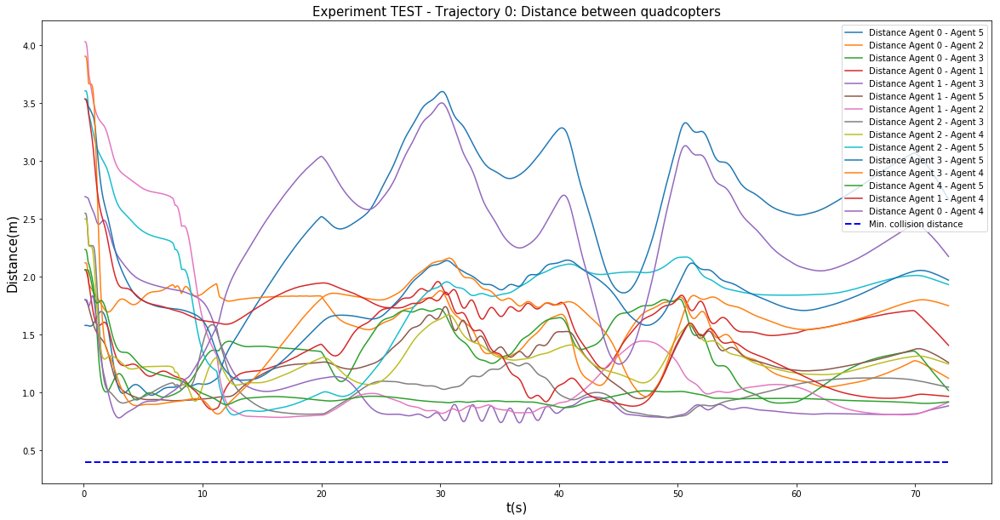

In [16]:
import matplotlib.pyplot as plt

for experiment in data.keys():
    fig = plt.figure(figsize=(20, 10))
    
    ax1 = plt.subplot(111)
    
    for key in data[experiment].keys():
        if key.split("_")[0] == 'distanceCol':
            i = key.split("_")[1]
            j = key.split("_")[2]

            plt.plot( data[experiment]["distanceTime"], data[experiment][key], label = "Distance Agent " + str(i) + " - Agent " + str(j))
            
    plt.plot( [data[experiment]["distanceTime"][0], data[experiment]["distanceTime"][-1]],[0.4, 0.4], color='blue', linestyle='dashed', linewidth=2, label = "Min. collision distance")
    plt.title("Experiment " + experiment.split("_")[0] + " - Trajectory " + experiment.split("_")[1] + ": Distance between quadcopters", fontsize=15)
    plt.ylabel("Distance(m)", fontsize=15)   
    plt.xlabel("t(s)", fontsize=15)   
    plt.setp(ax1.get_xticklabels(), fontsize=10)
    plt.legend(fontsize=10)
    plt.savefig("./images/distances_experiment_" + experiment + ".png", bbox_inches='tight')
    plt.savefig("./images/distances_experiment_" + experiment + ".eps", bbox_inches='tight')
    plt.show()

   

# Connection distances

In [24]:
dictionary_of_trajectory = { "TEST_0": {0 : [1, 2, 3], 1 : [5], 2 : [3, 4], 4: [5] }, 
                             "A_I": {0 : [1, 2, 3], 1 : [5], 2 : [3, 4], 4: [5] }}

for experiment in data.keys():
    experimentTime = data[experiment]["distanceTime"]
    for key in dictionary_of_trajectory[experiment].keys():
        for index in dictionary_of_trajectory[experiment][key]:
            data[experiment]["distanceCon_" + str(key) + "_" + str(index)] = np.sqrt((data[experiment]["crazyflie_" + str(key)]["interpolation"]["x"](experimentTime) - data[experiment]["crazyflie_" + str(index)]["interpolation"]["x"](experimentTime))**2 +  
                                                                              (data[experiment]["crazyflie_" + str(key)]["interpolation"]["y"](experimentTime) - data[experiment]["crazyflie_" + str(index)]["interpolation"]["y"](experimentTime))**2 +
                                                                             (data[experiment]["crazyflie_" + str(key)]["interpolation"]["z"](experimentTime) - data[experiment]["crazyflie_" + str(index)]["interpolation"]["z"](experimentTime))**2)

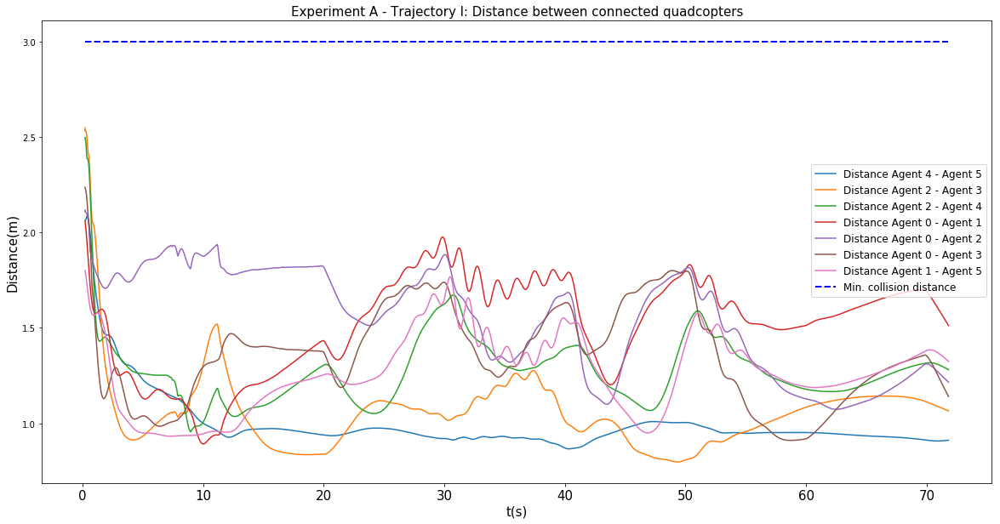

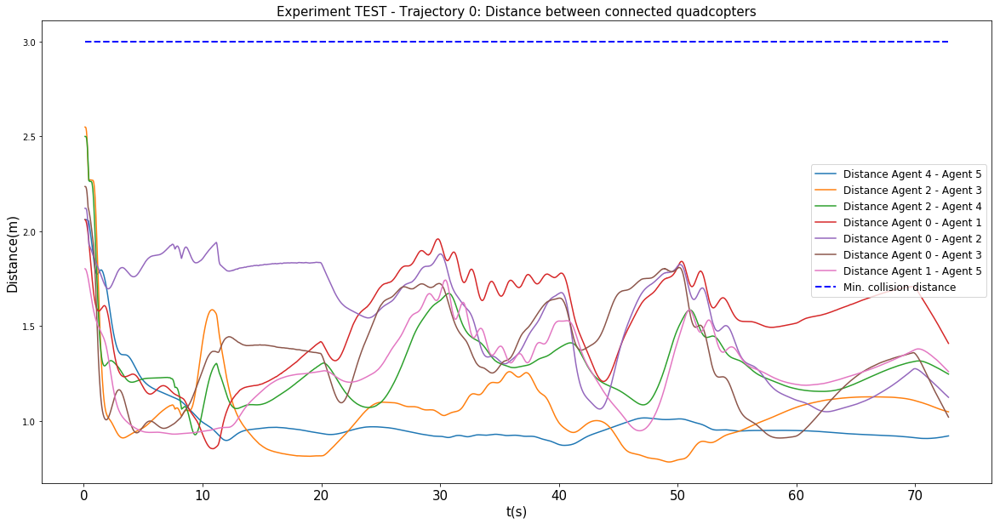

In [25]:
import matplotlib.pyplot as plt

for experiment in data.keys():
    fig = plt.figure(figsize=(20, 10))
    
    ax1 = plt.subplot(111)
    
    for key in data[experiment].keys():
        if key.split("_")[0] == 'distanceCon':
            i = key.split("_")[1]
            j = key.split("_")[2]

            plt.plot( data[experiment]["distanceTime"], data[experiment][key], label = "Distance Agent " + str(i) + " - Agent " + str(j))
            
    plt.plot( [data[experiment]["distanceTime"][0], data[experiment]["distanceTime"][-1]],[3, 3], color='blue', linestyle='dashed', linewidth=2, label = "Min. collision distance")
    plt.title("Experiment " + experiment.split("_")[0] + " - Trajectory " + experiment.split("_")[1] + ": Distance between connected quadcopters", fontsize=15)
    plt.ylabel("Distance(m)", fontsize=15)   
    plt.xlabel("t(s)", fontsize=15)   
    plt.setp(ax1.get_xticklabels(), fontsize=15)
    plt.legend(fontsize=12, loc='best', bbox_to_anchor=(0.5, 0.2, 0.5, 0.5))
    plt.savefig("./images/distances_experiment_" + experiment + ".png", bbox_inches='tight')
    plt.savefig("./images/distances_experiment_" + experiment + ".eps", bbox_inches='tight')
    plt.show()


# Input and betas

In [58]:
forcesBetas = {}
maxBeta = -1e20
minBeta = 1e20
maxForce = -1e20
minForce = 1e20
maxAll = -1e20
minAll = 1e20

for experiment in data.keys(): 
    forcesBetas[experiment] = {}
    for key in data[experiment].keys():
        if key.split("_")[0] == "crazyflie":
            forcesBetas[experiment][key] = {}
for experiment in data.keys(): 
    for key in data[experiment].keys():
        if key.split("_")[0] == "betas":
            forcesBetas[experiment]["crazyflie_" + key.split("_")[2]]["beta_con"] = data[experiment][key]["beta_con"]
            maxBeta = np.amax([maxBeta, np.amax(forcesBetas[experiment]["crazyflie_" + key.split("_")[2]]["beta_con"])])
            minBeta = np.amin([minBeta, np.amin(forcesBetas[experiment]["crazyflie_" + key.split("_")[2]]["beta_con"])])
            forcesBetas[experiment]["crazyflie_" + key.split("_")[2]]["beta_col"] = data[experiment][key]["beta_col"]
            maxBeta = np.amax([maxBeta, np.amax(forcesBetas[experiment]["crazyflie_" + key.split("_")[2]]["beta_col"])])
            minBeta = np.amin([minBeta, np.amin(forcesBetas[experiment]["crazyflie_" + key.split("_")[2]]["beta_col"])])

        if key.split("_")[0] == "forces":
            forcesBetas[experiment]["crazyflie_" + key.split("_")[2]]["force"] = data[experiment][key]["force"]
            maxForce = np.amax([maxForce, np.amax(forcesBetas[experiment]["crazyflie_" + key.split("_")[2]]["force"])])
            minForce = np.amin([minForce, np.amin(forcesBetas[experiment]["crazyflie_" + key.split("_")[2]]["force"])])

maxAll = np.amax([maxBeta, maxForce])
minAll = np.amin([minBeta, minForce])


1.684066044546866e-06
3.631309329922574e-06
2.7715936945149576e-05
2.7715936945149576e-05
2.7715936945149576e-05
2.7715936945149576e-05
2.7715936945149576e-05
2.7715936945149576e-05
2.7715936945149576e-05
2.7715936945149576e-05
2.7715936945149576e-05
2.7715936945149576e-05
2.7715936945149576e-05
2.7715936945149576e-05
2.7715936945149576e-05
2.7715936945149576e-05
2.7715936945149576e-05
2.7715936945149576e-05
2.7715936945149576e-05
2.7715936945149576e-05
2.7715936945149576e-05
2.7715936945149576e-05
2.7715936945149576e-05
2.7715936945149576e-05


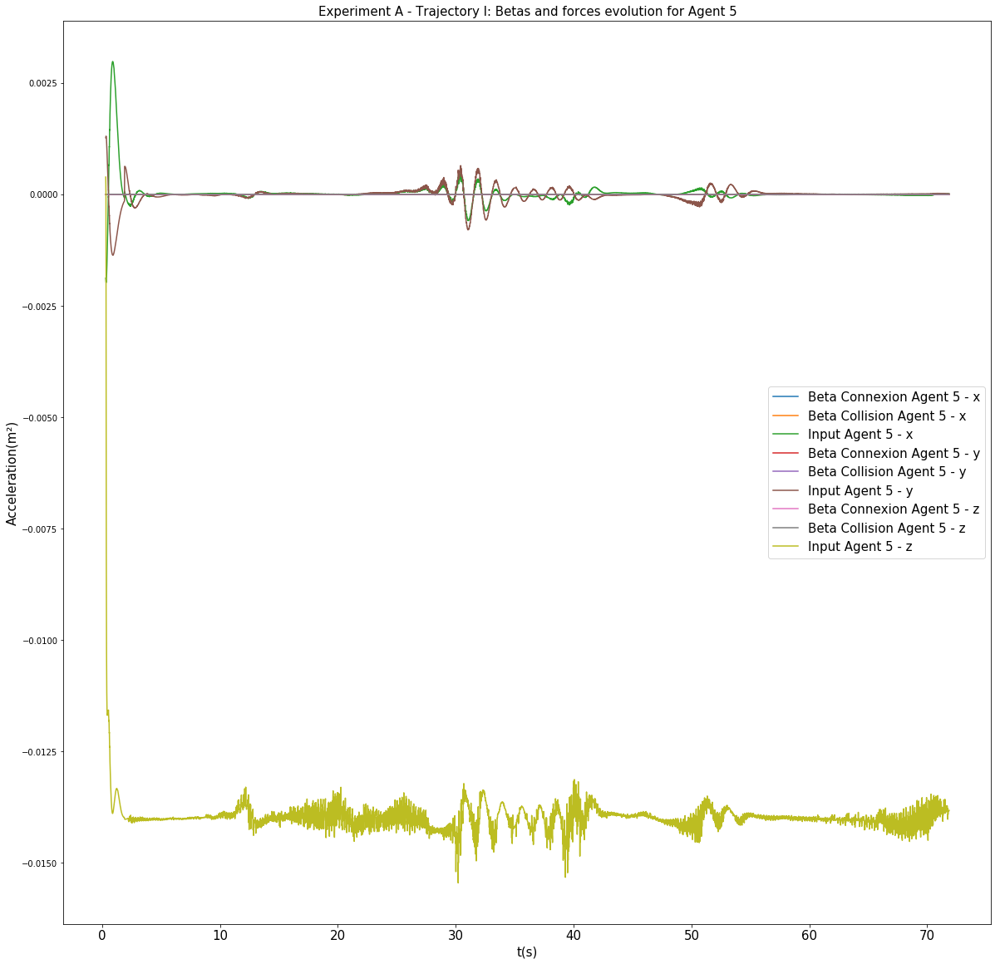

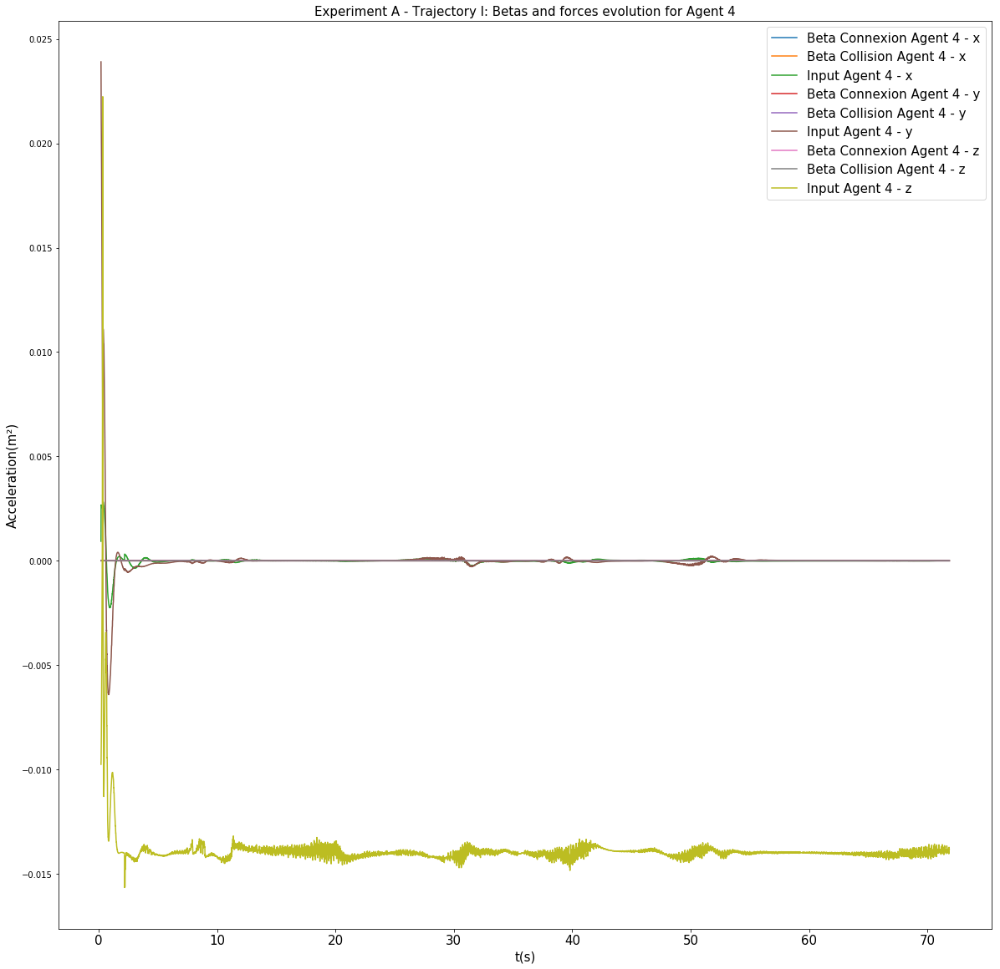

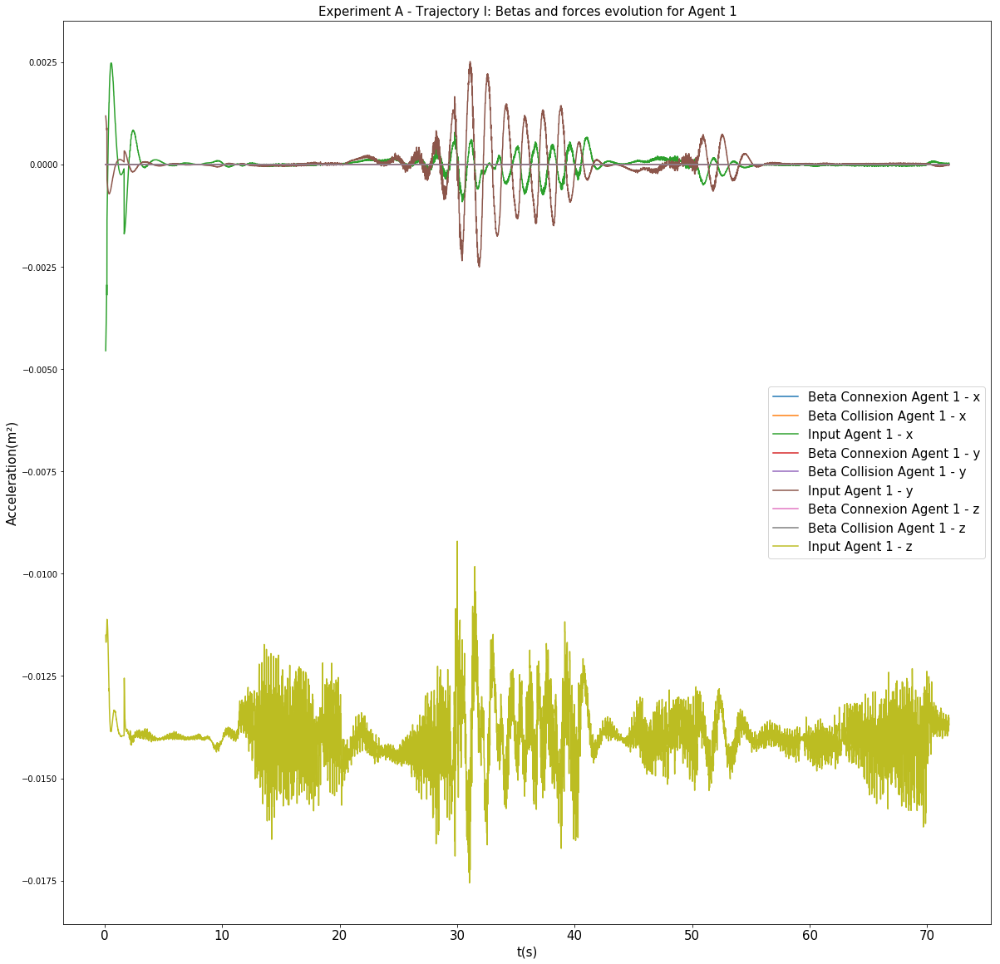

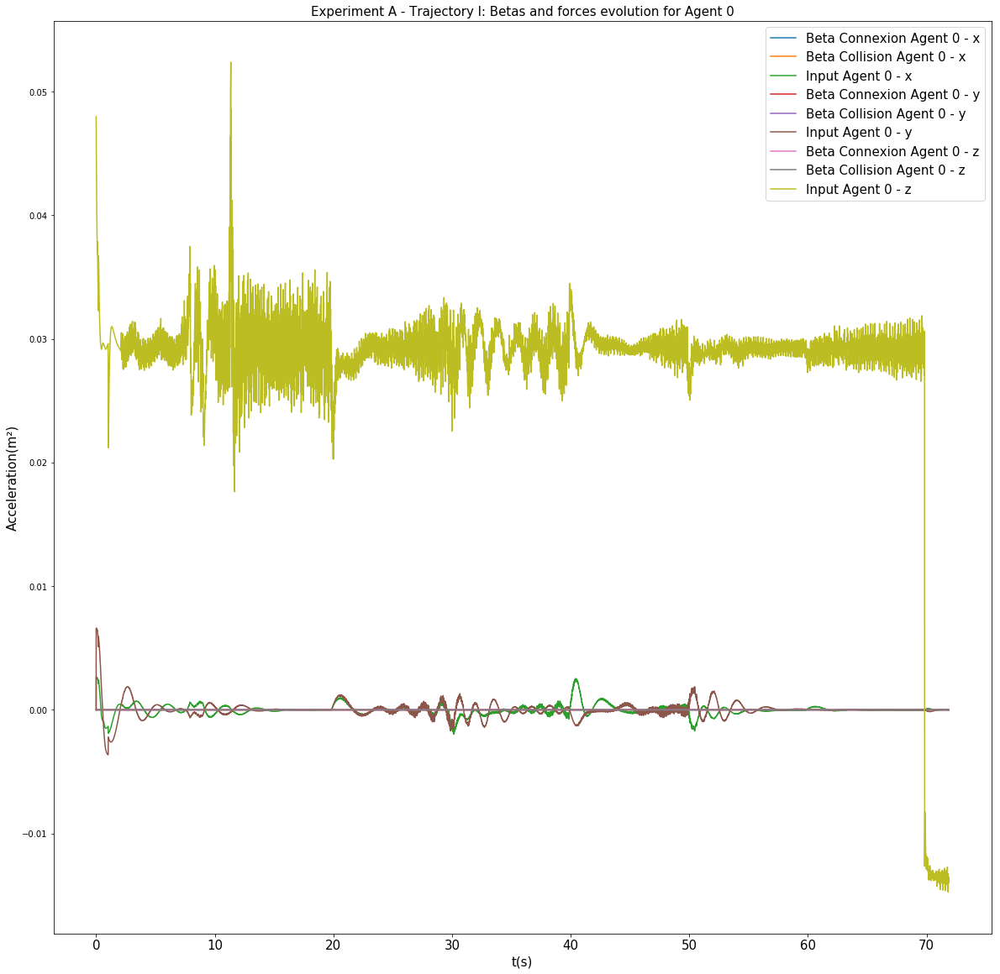

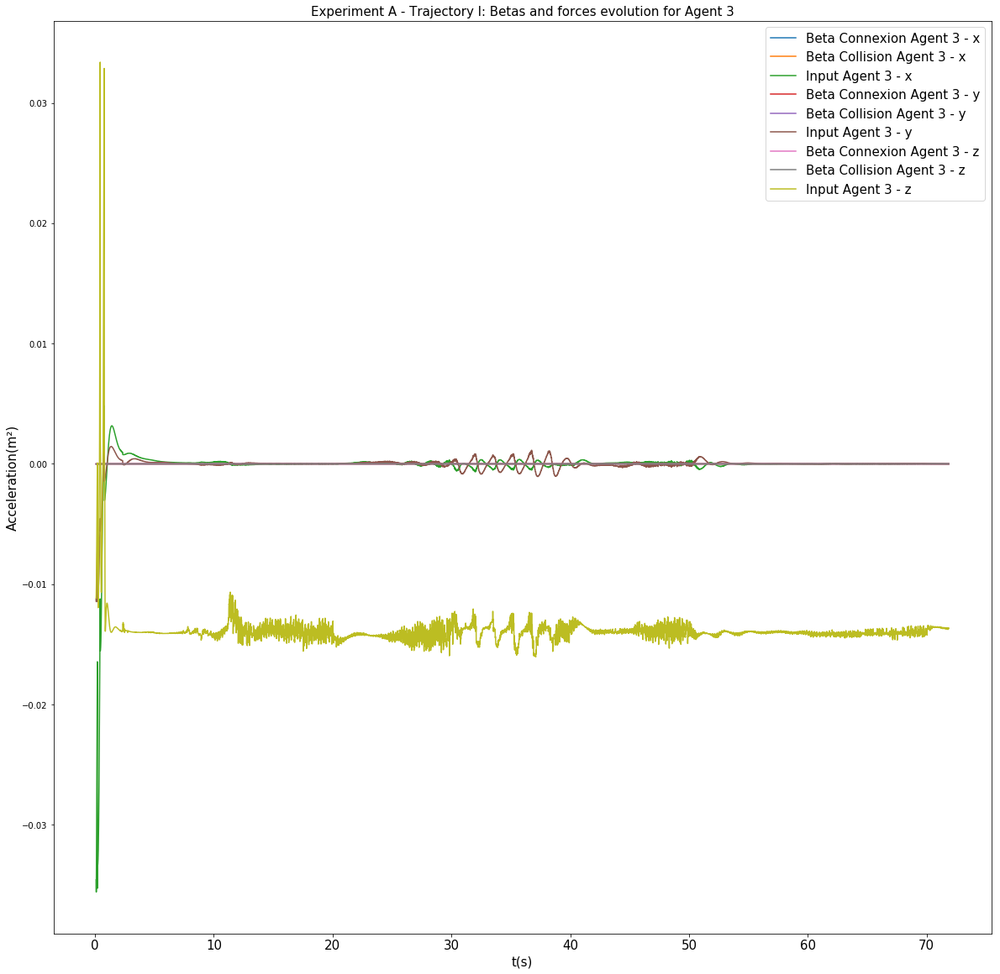

...

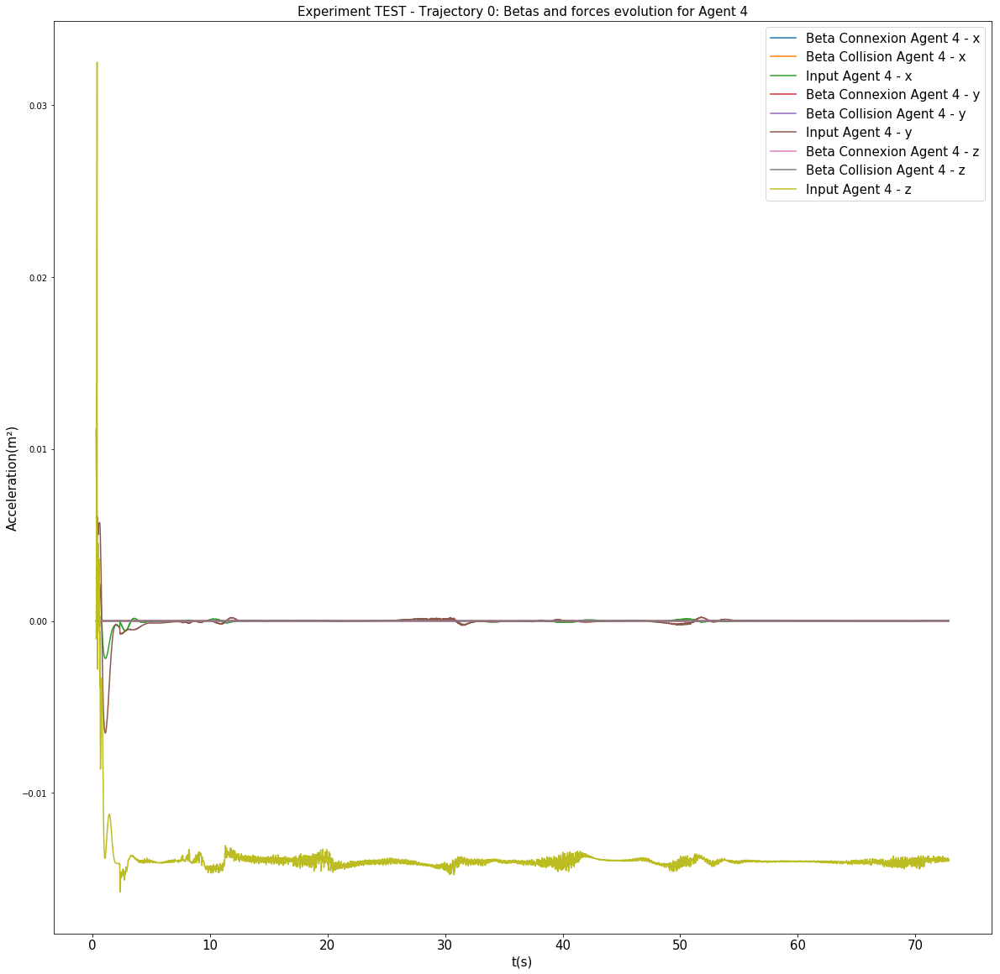

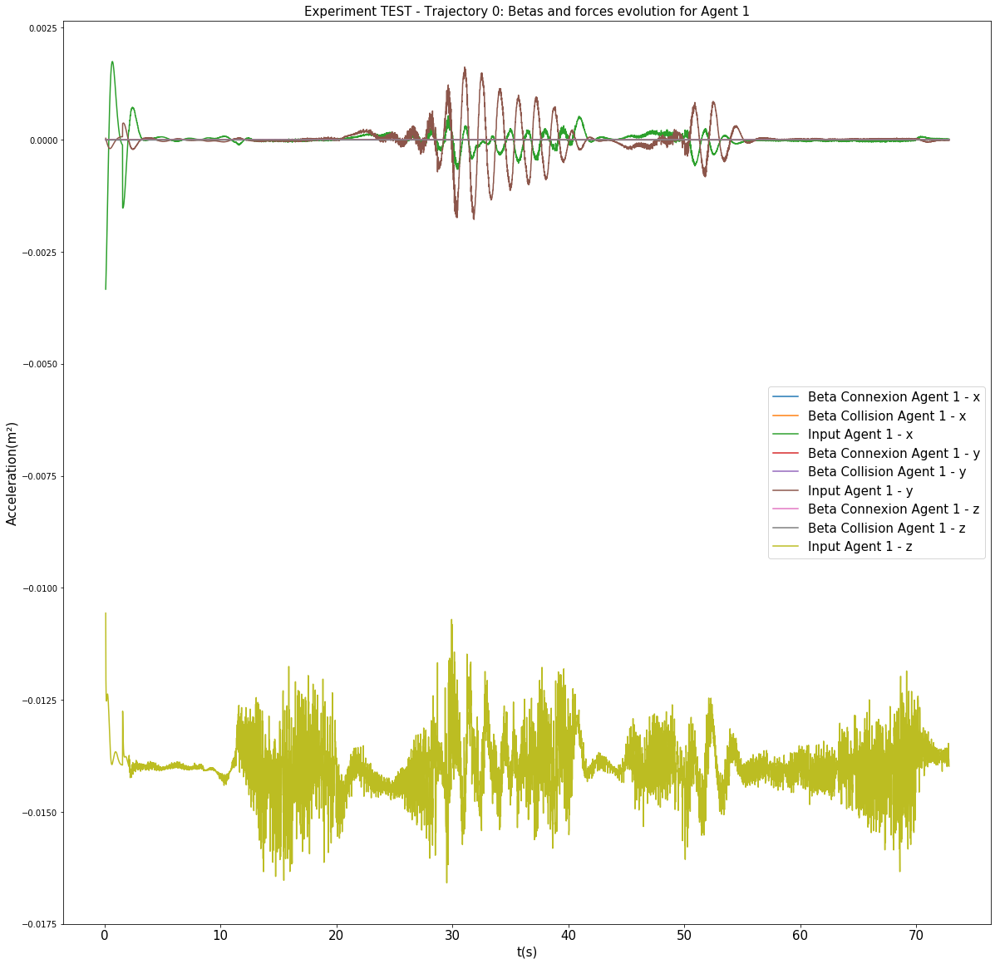

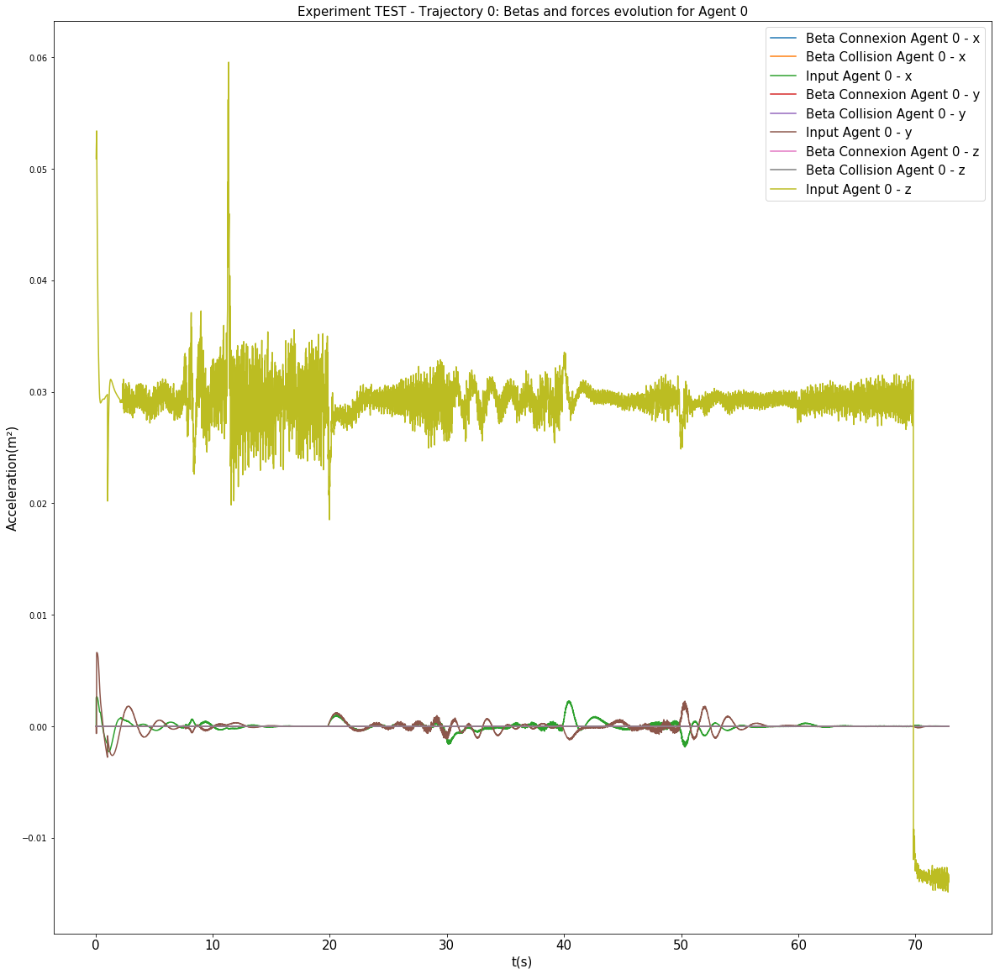

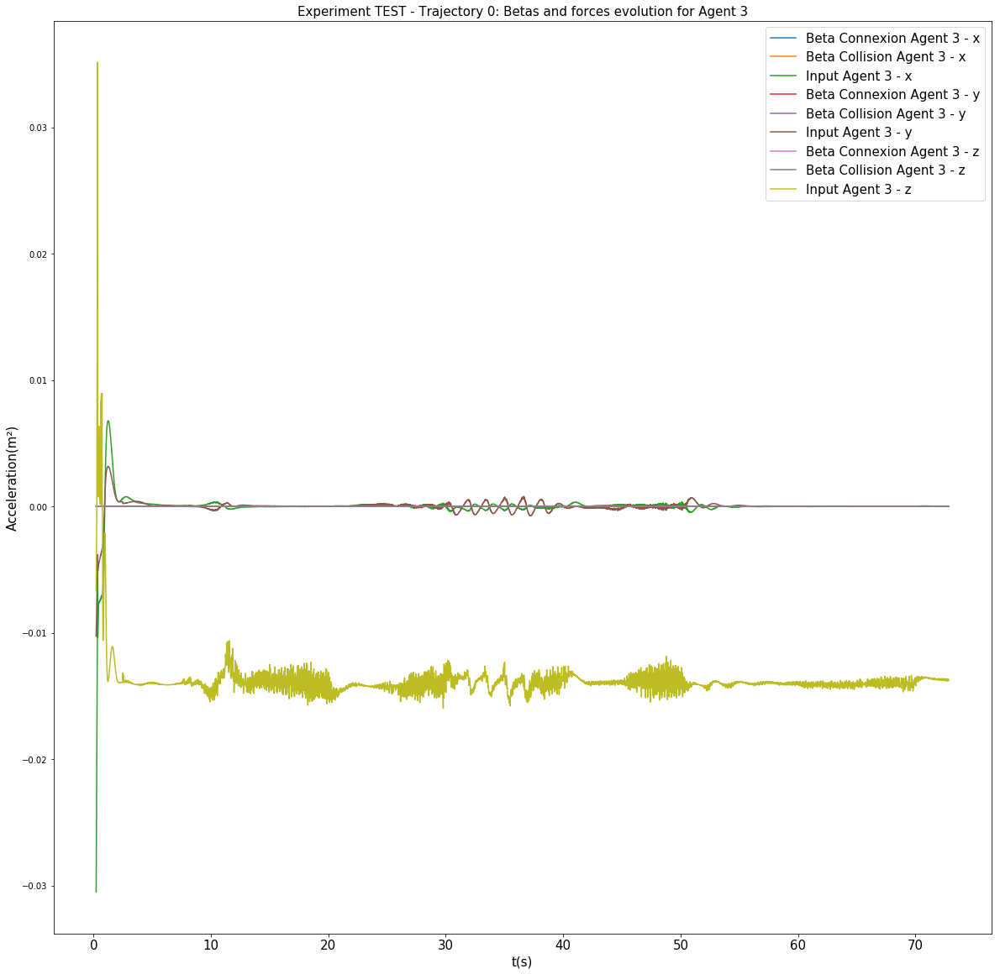

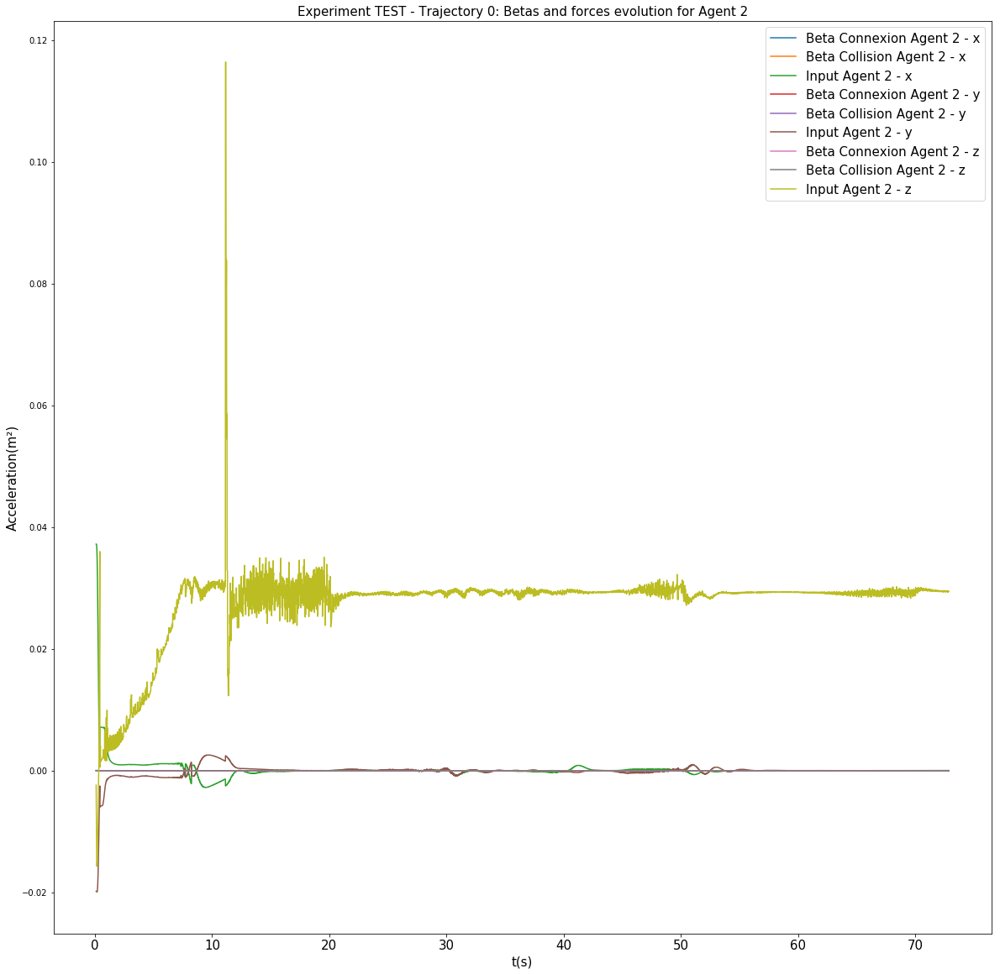

In [60]:
import matplotlib.pyplot as plt

for experiment in data.keys():
    for drone in forcesBetas[experiment].keys():
        fig = plt.figure(figsize=(20, 20))

        ax1 = plt.subplot(111)

        plt.plot( data[experiment]["betas_" + drone]["time"], forcesBetas[experiment][drone]["beta_con"][:, 0], label = "Beta Connexion Agent " + drone.split("_")[1] + " - x")
        plt.plot( data[experiment]["betas_" + drone]["time"], forcesBetas[experiment][drone]["beta_col"][:, 0], label = "Beta Collision Agent " + drone.split("_")[1] + " - x")
        plt.plot( data[experiment]["forces_" + drone]["time"], forcesBetas[experiment][drone]["force"][:, 0], label = "Input Agent " + drone.split("_")[1] + " - x")
        
        plt.plot( data[experiment]["betas_" + drone]["time"], forcesBetas[experiment][drone]["beta_con"][:, 1], label = "Beta Connexion Agent " + drone.split("_")[1] + " - y")
        plt.plot( data[experiment]["betas_" + drone]["time"], forcesBetas[experiment][drone]["beta_col"][:, 1], label = "Beta Collision Agent " + drone.split("_")[1] + " - y")
        plt.plot( data[experiment]["forces_" + drone]["time"], forcesBetas[experiment][drone]["force"][:, 1], label = "Input Agent " + drone.split("_")[1] + " - y")

        plt.plot( data[experiment]["betas_" + drone]["time"], forcesBetas[experiment][drone]["beta_con"][:, 2], label = "Beta Connexion Agent " + drone.split("_")[1] + " - z")
        plt.plot( data[experiment]["betas_" + drone]["time"], forcesBetas[experiment][drone]["beta_col"][:, 2], label = "Beta Collision Agent " + drone.split("_")[1] + " - z")
        plt.plot( data[experiment]["forces_" + drone]["time"], forcesBetas[experiment][drone]["force"][:, 2], label = "Input Agent " + drone.split("_")[1] + " - z")
        #plt.ylim([minAll, maxAll])

        plt.title("Experiment " + experiment.split("_")[0] + " - Trajectory " + experiment.split("_")[1] + ": Betas and forces evolution for Agent " + drone.split("_")[1], fontsize=15)
        plt.ylabel(u"Acceleration(m²)", fontsize=15)   
        plt.xlabel("t(s)", fontsize=15)   
        plt.setp(ax1.get_xticklabels(), fontsize=15)
        plt.legend(fontsize=15, loc='best')
        plt.savefig("./images/3axis_betas_and_forces_experiment_" + experiment + "_" + drone + ".png", bbox_inches='tight')
        plt.savefig("./images/3axis_betas_and_forces_experiment_" + experiment + "_" + drone  + ".eps", bbox_inches='tight')
        plt.show()


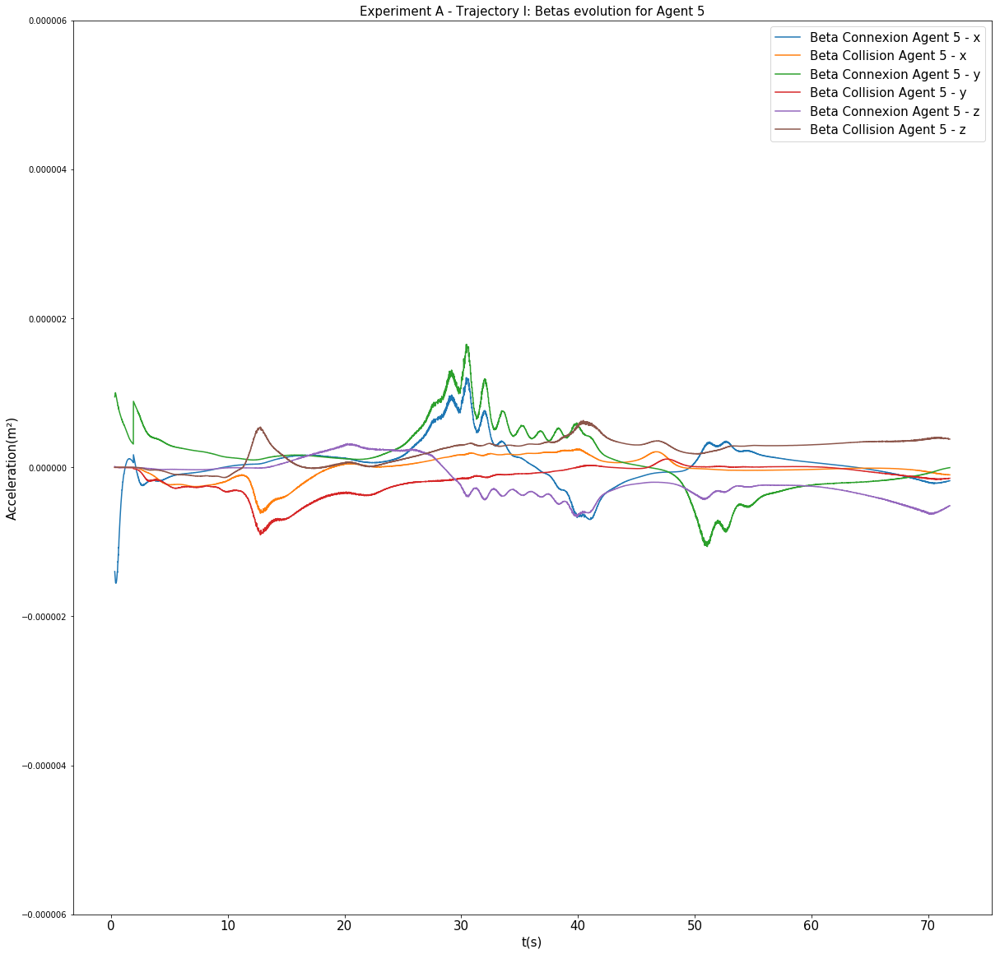

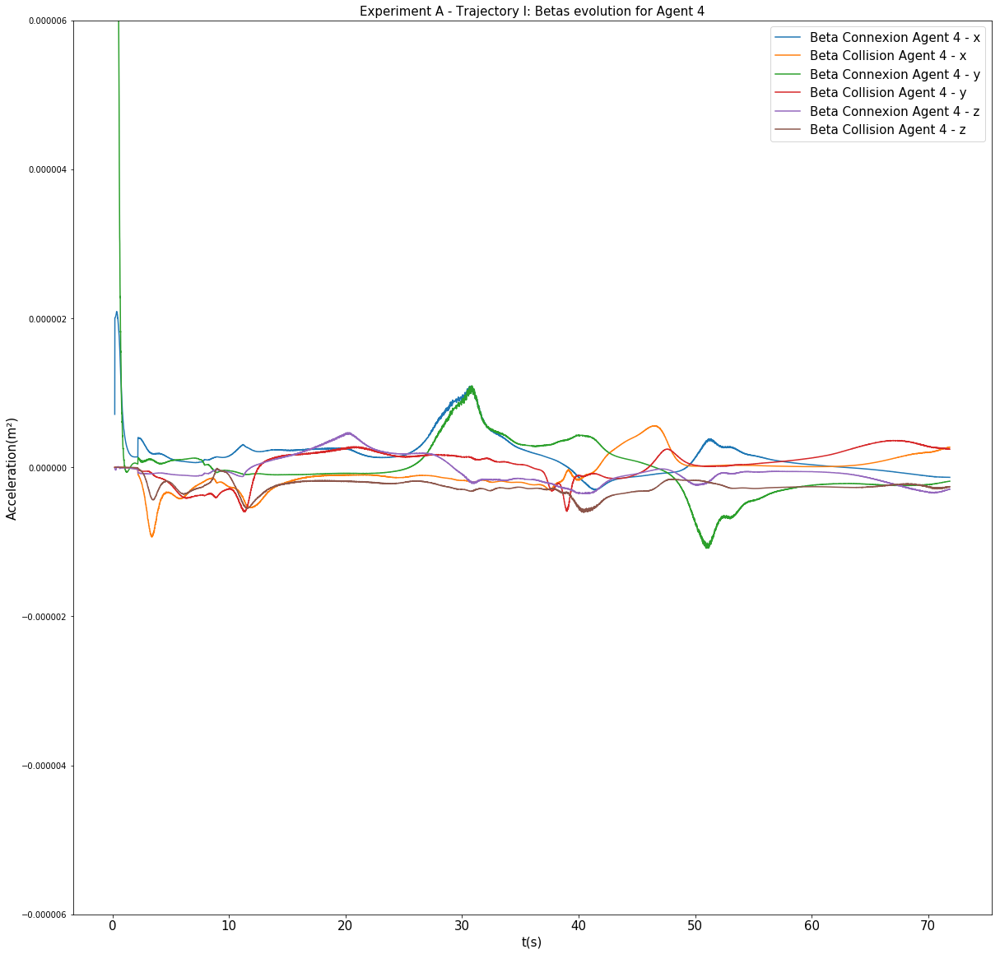

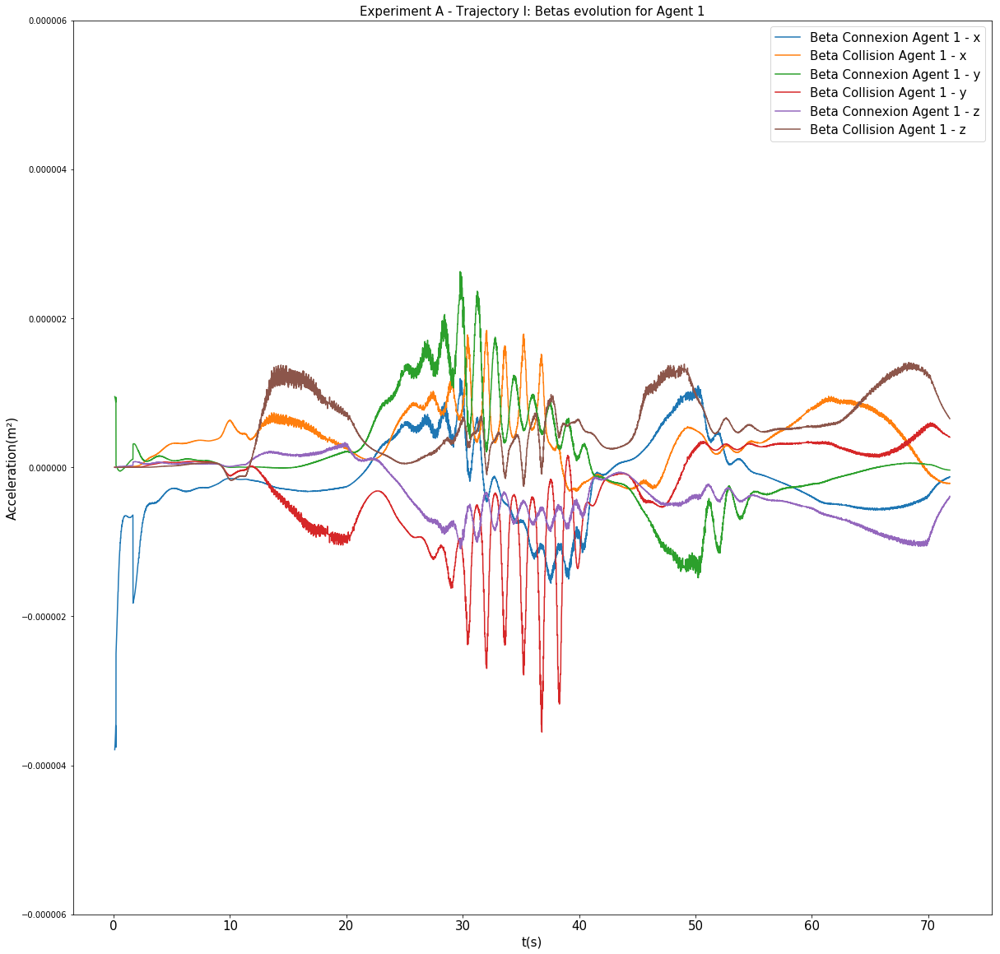

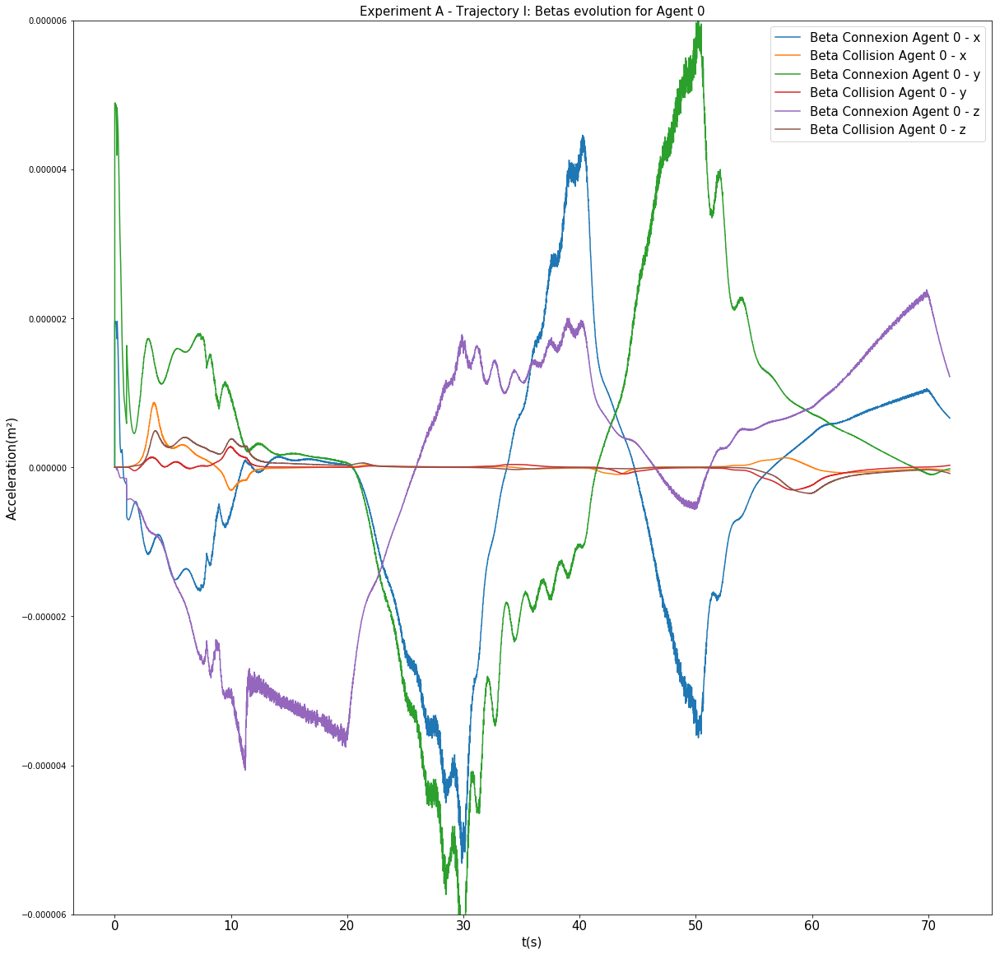

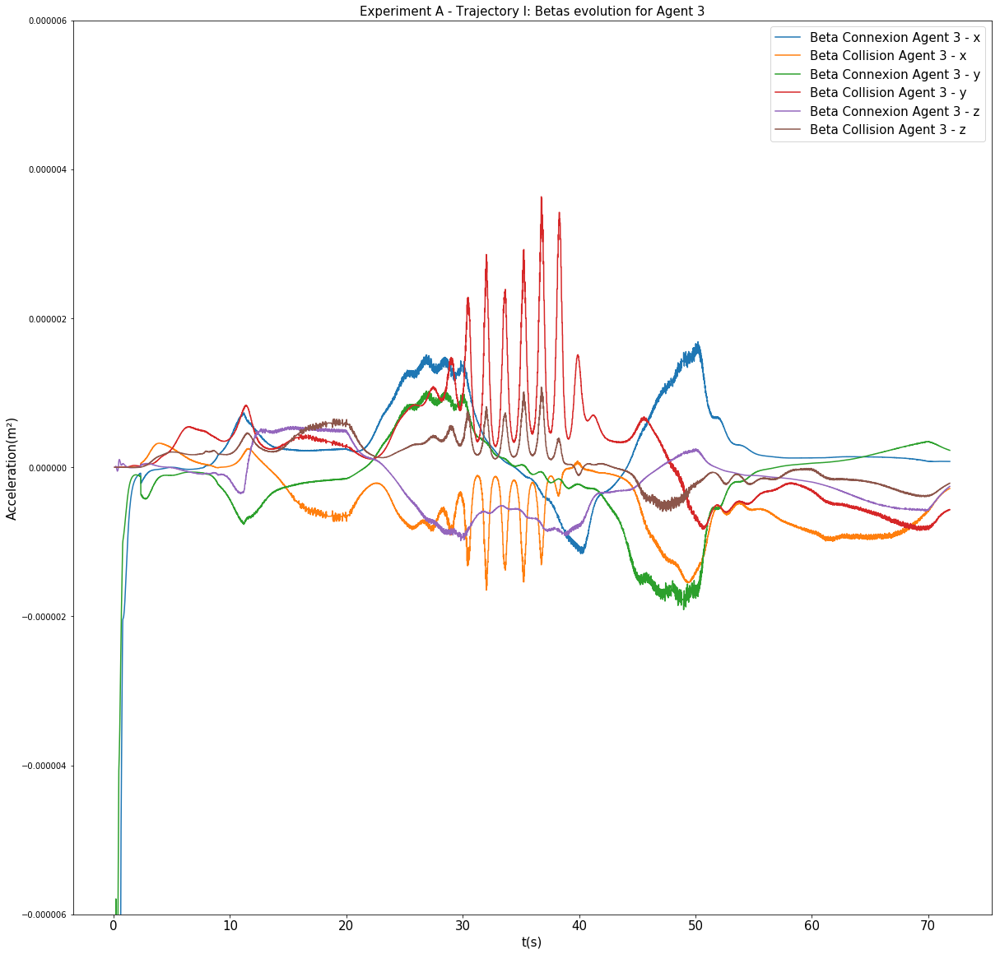

...

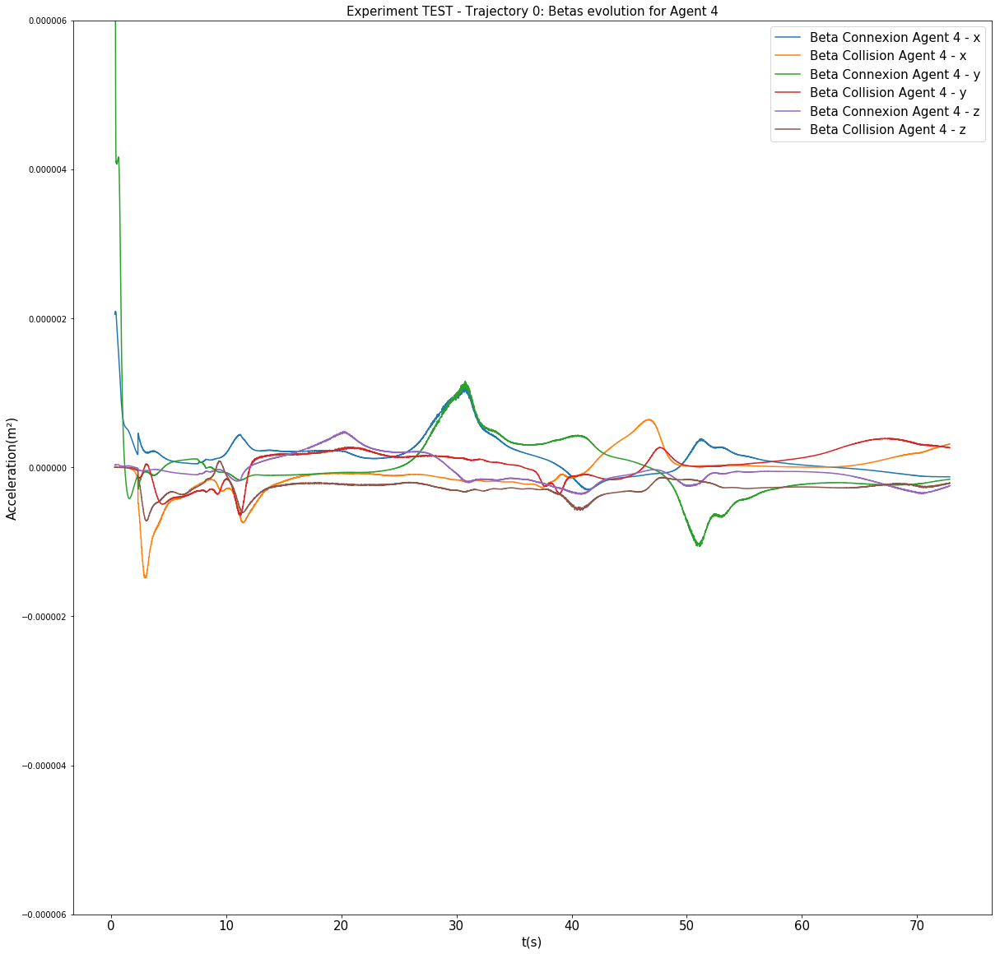

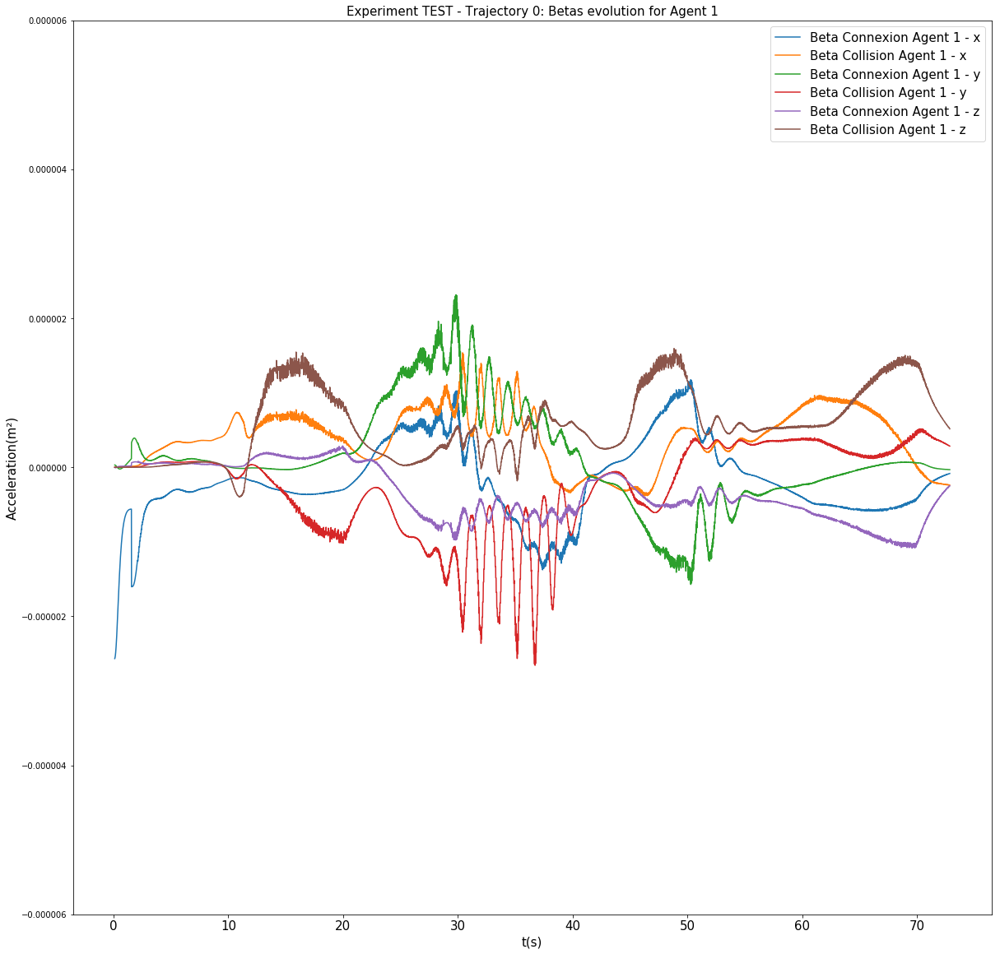

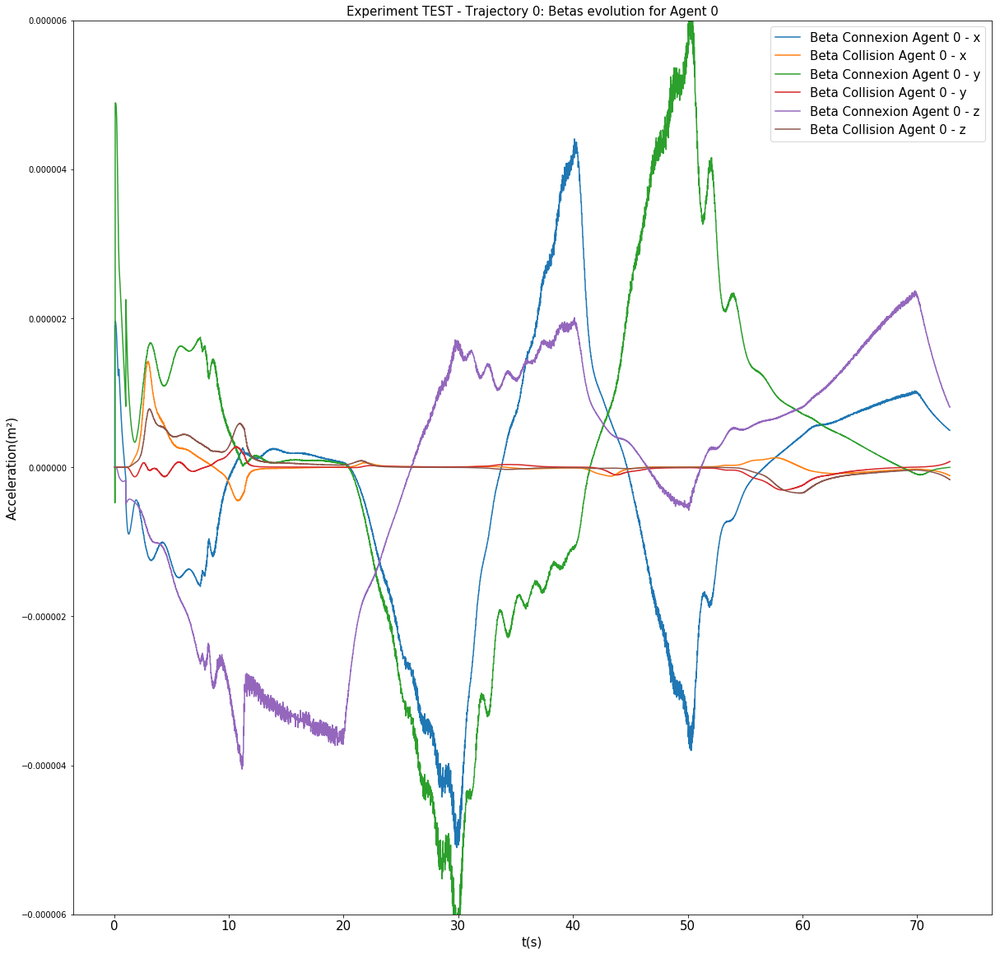

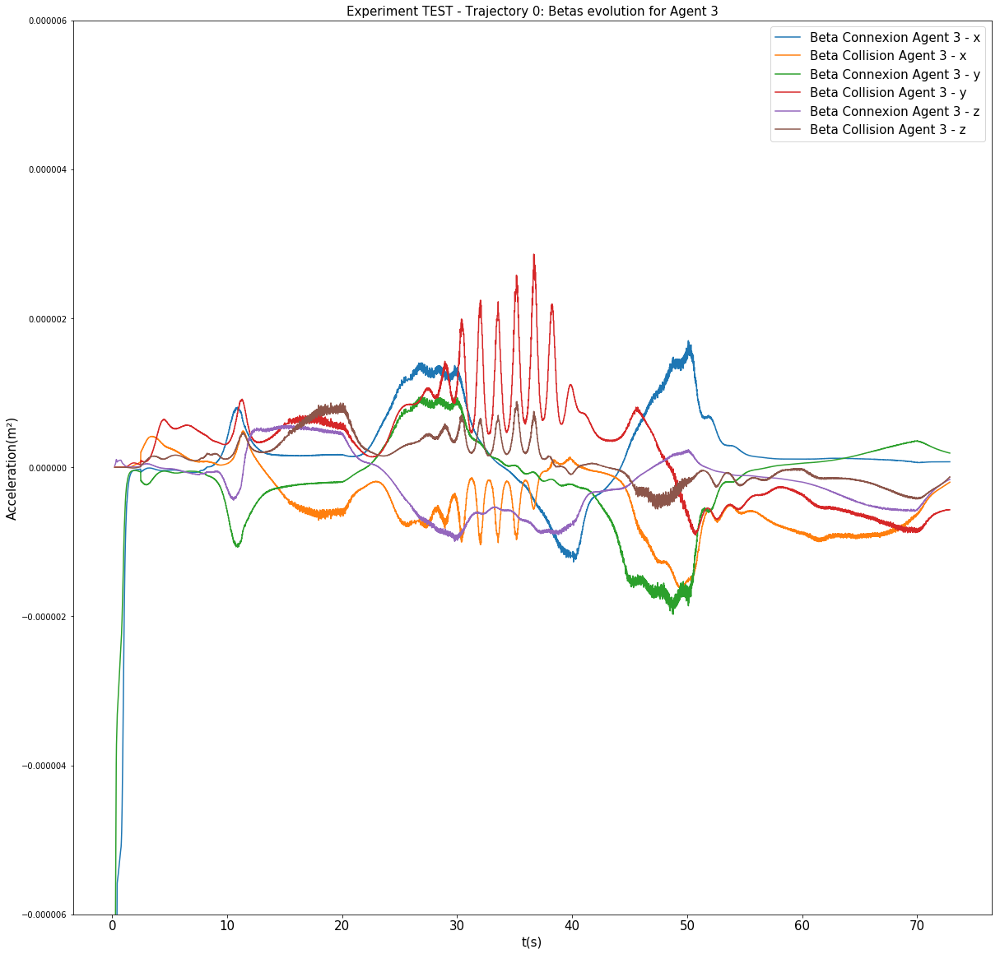

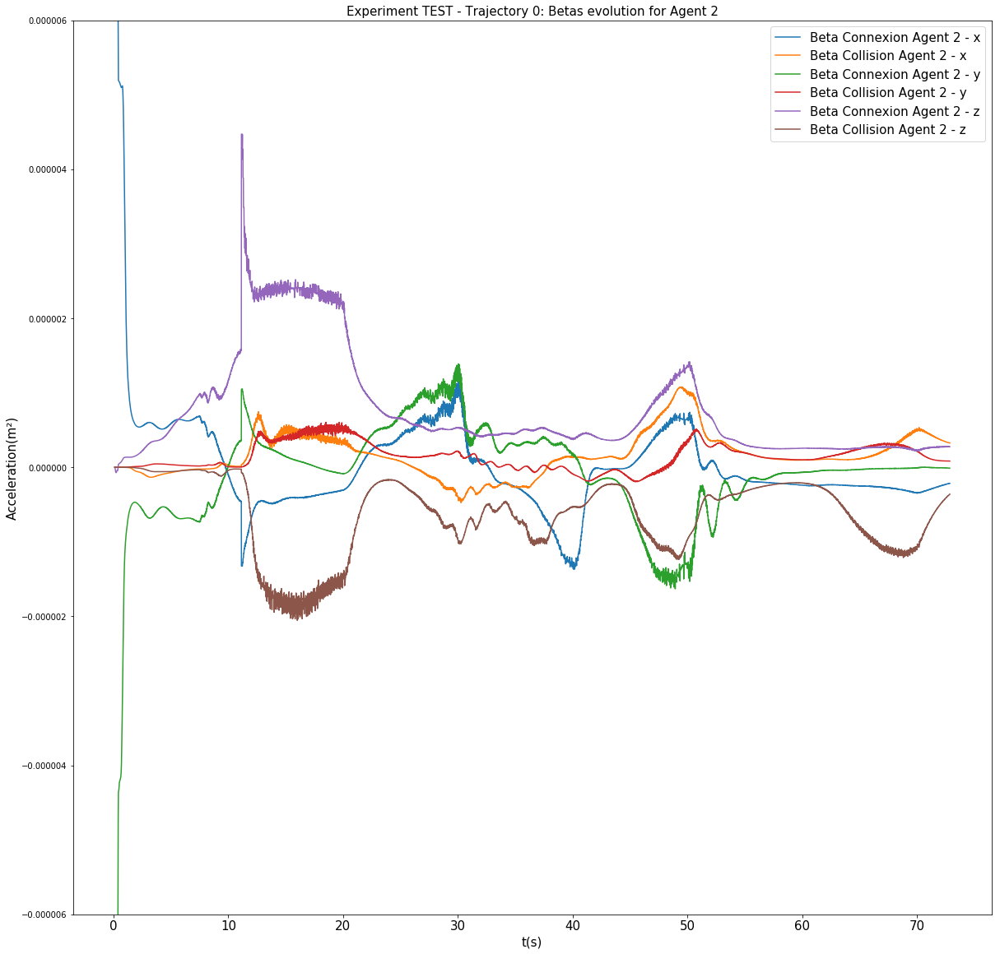

In [63]:

import matplotlib.pyplot as plt

for experiment in data.keys():
    for drone in forcesBetas[experiment].keys():
        fig = plt.figure(figsize=(20, 20))

        ax1 = plt.subplot(111)

        plt.plot( data[experiment]["betas_" + drone]["time"], forcesBetas[experiment][drone]["beta_con"][:, 0], label = "Beta Connexion Agent " + drone.split("_")[1] + " - x")
        plt.plot( data[experiment]["betas_" + drone]["time"], forcesBetas[experiment][drone]["beta_col"][:, 0], label = "Beta Collision Agent " + drone.split("_")[1] + " - x")

        plt.plot( data[experiment]["betas_" + drone]["time"], forcesBetas[experiment][drone]["beta_con"][:, 1], label = "Beta Connexion Agent " + drone.split("_")[1] + " - y")
        plt.plot( data[experiment]["betas_" + drone]["time"], forcesBetas[experiment][drone]["beta_col"][:, 1], label = "Beta Collision Agent " + drone.split("_")[1] + " - y")

        plt.plot( data[experiment]["betas_" + drone]["time"], forcesBetas[experiment][drone]["beta_con"][:, 2], label = "Beta Connexion Agent " + drone.split("_")[1] + " - z")
        plt.plot( data[experiment]["betas_" + drone]["time"], forcesBetas[experiment][drone]["beta_col"][:, 2], label = "Beta Collision Agent " + drone.split("_")[1] + " - z")

        plt.ylim([-0.000006, 0.000006])
        plt.title("Experiment " + experiment.split("_")[0] + " - Trajectory " + experiment.split("_")[1] + ": Betas evolution for Agent " + drone.split("_")[1], fontsize=15)
        plt.ylabel(u"Acceleration(m²)", fontsize=15)   
        plt.xlabel("t(s)", fontsize=15)   
        plt.setp(ax1.get_xticklabels(), fontsize=15)
        plt.legend(fontsize=15, loc='best')
        plt.savefig("./images/3axis_betas_and_experiment_" + experiment + "_" + drone + ".png", bbox_inches='tight')
        plt.savefig("./images/3axis_betas_and_experiment_" + experiment + "_" + drone + ".eps", bbox_inches='tight')
        plt.show()

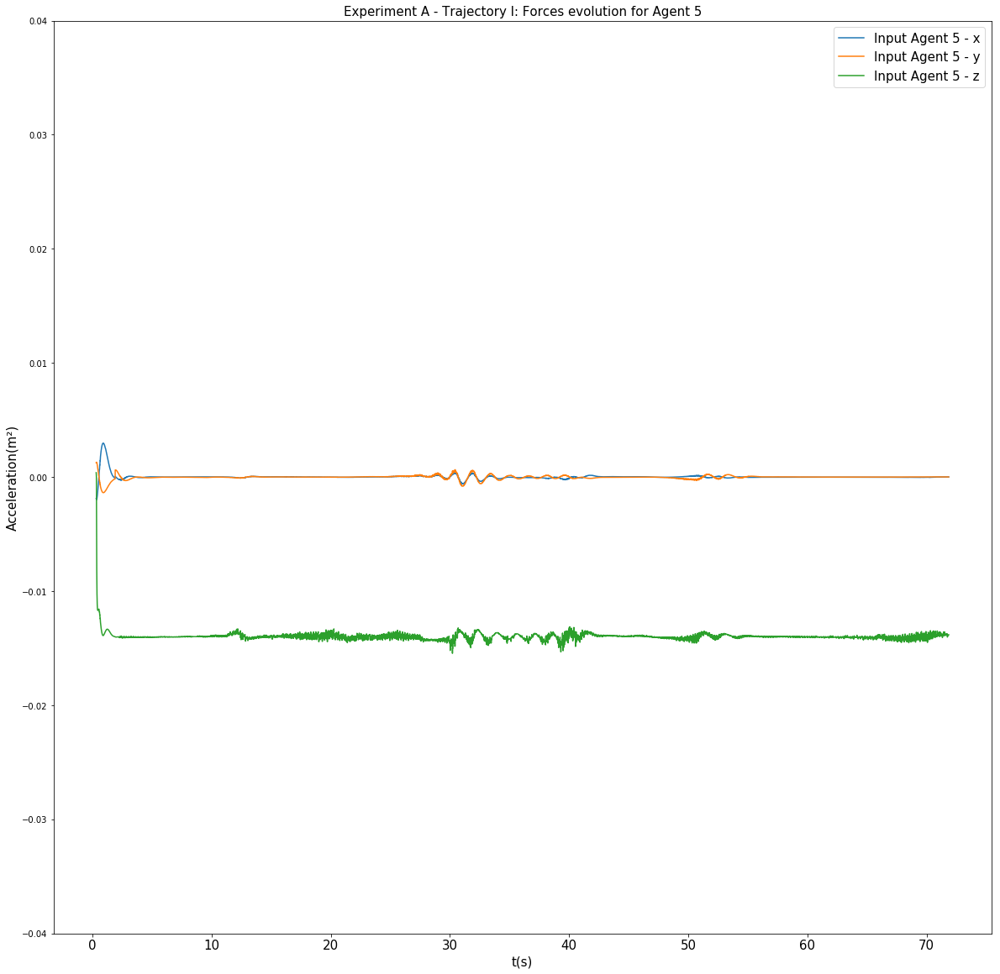

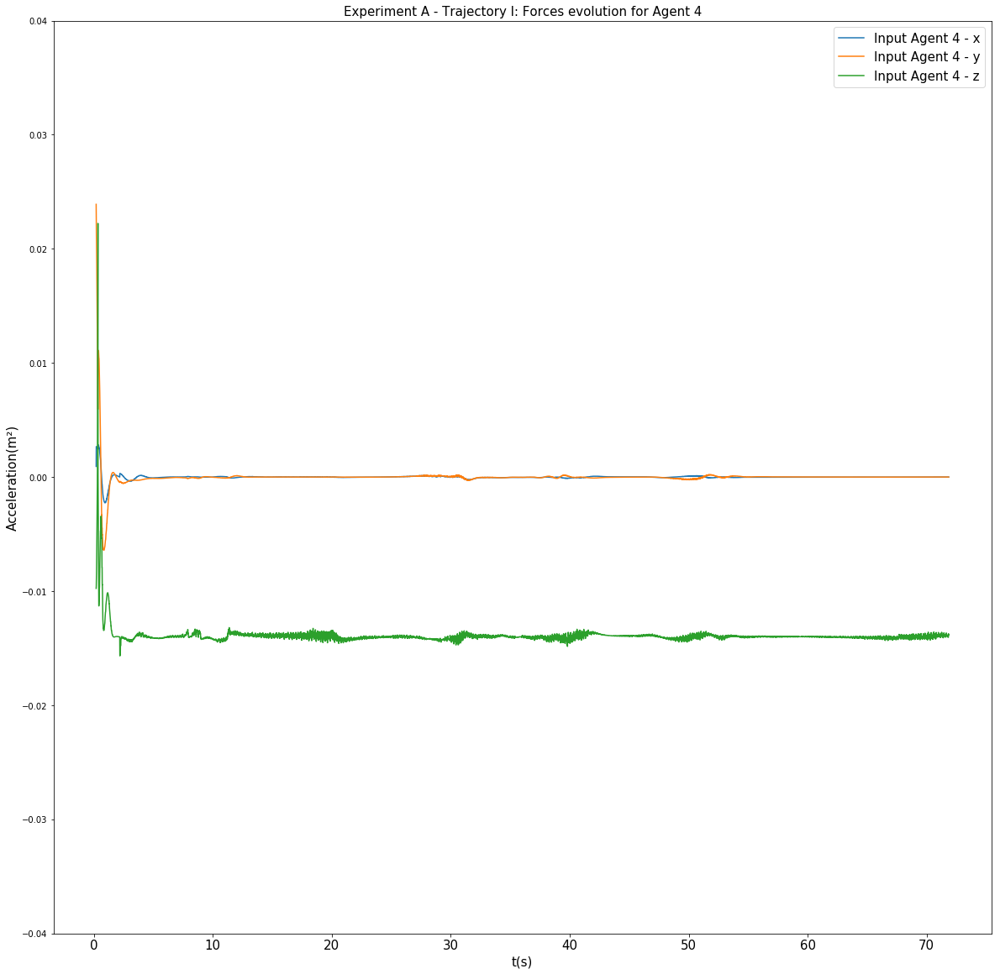

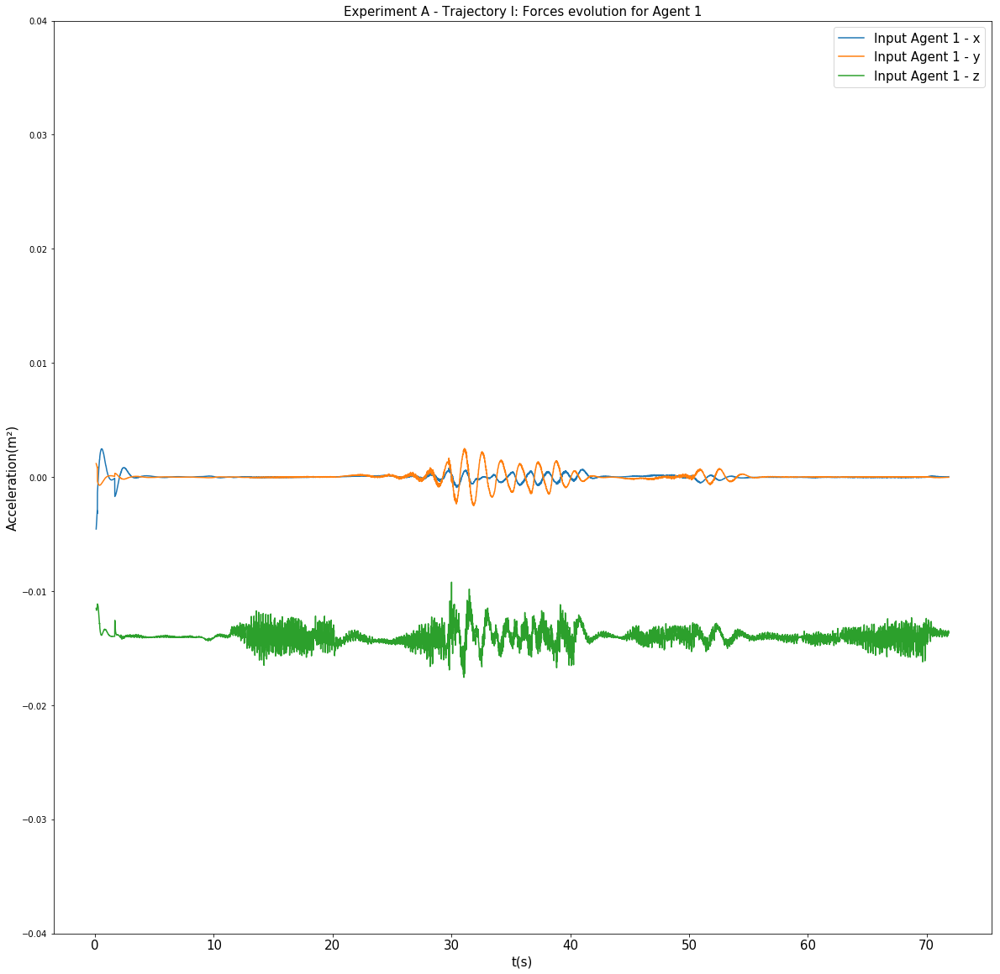

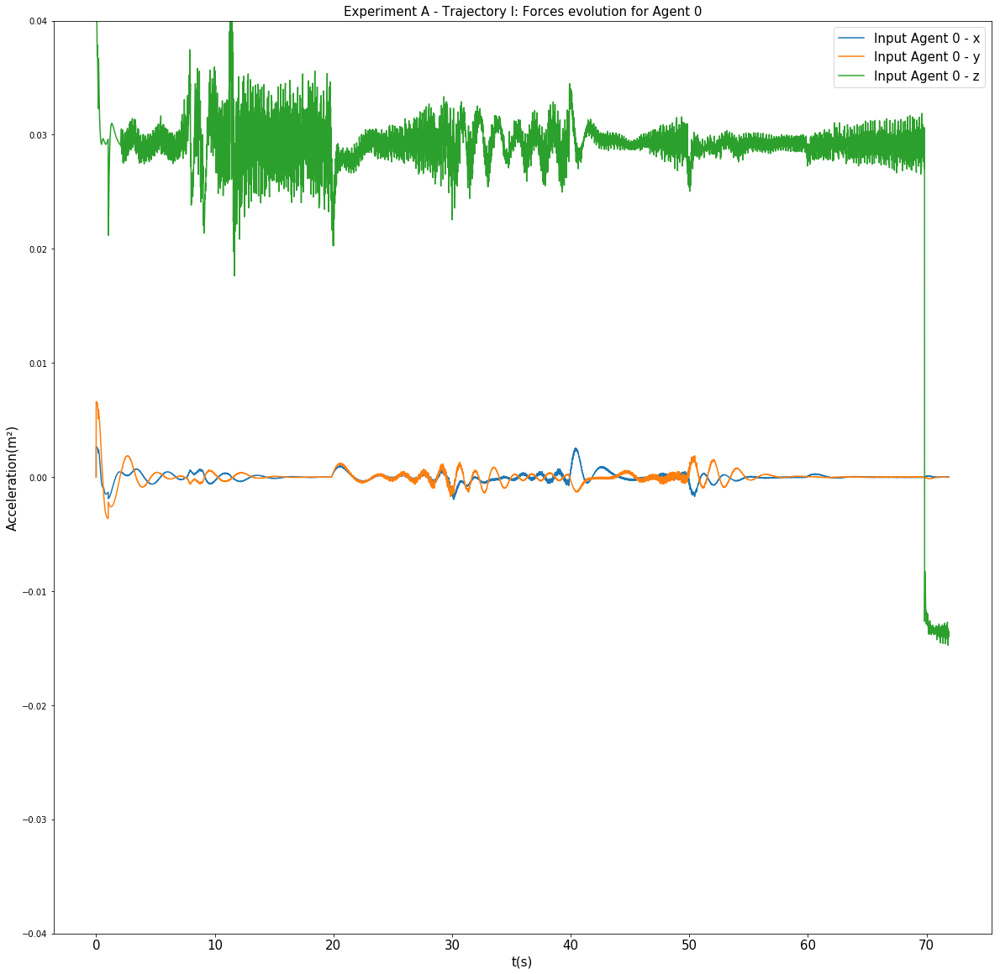

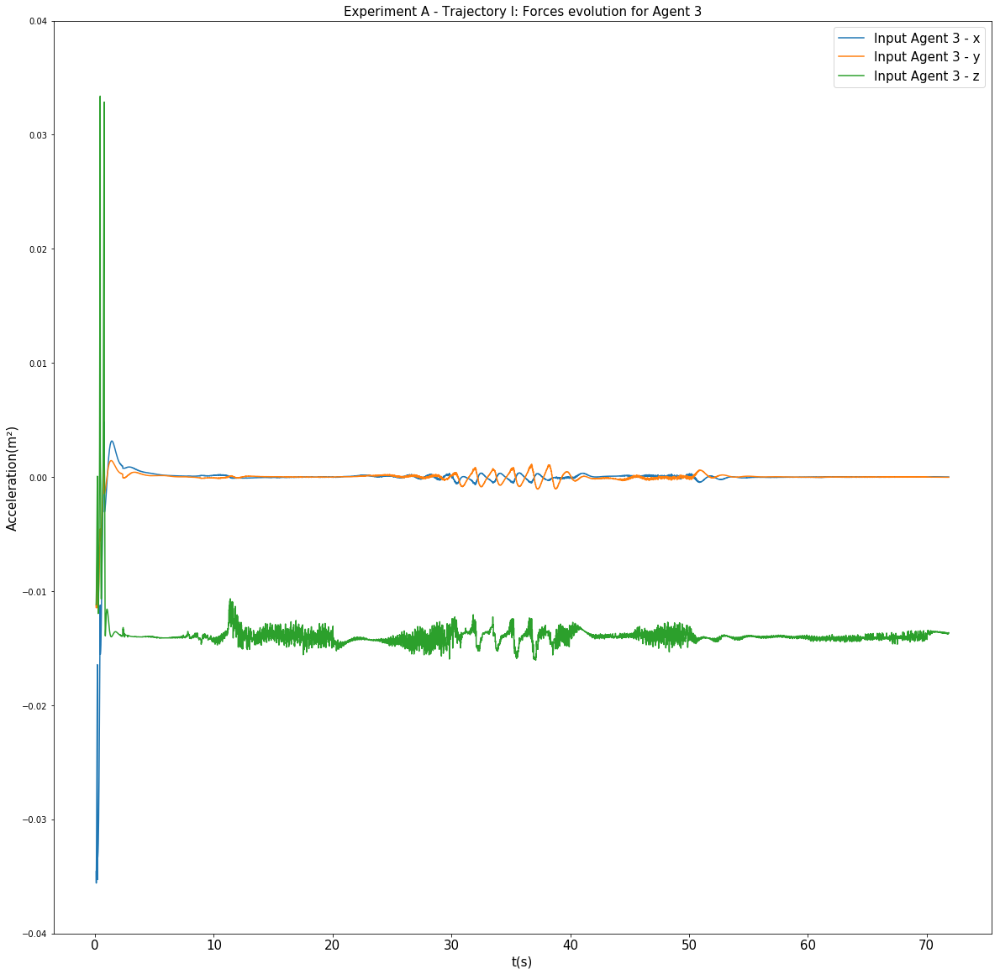

...

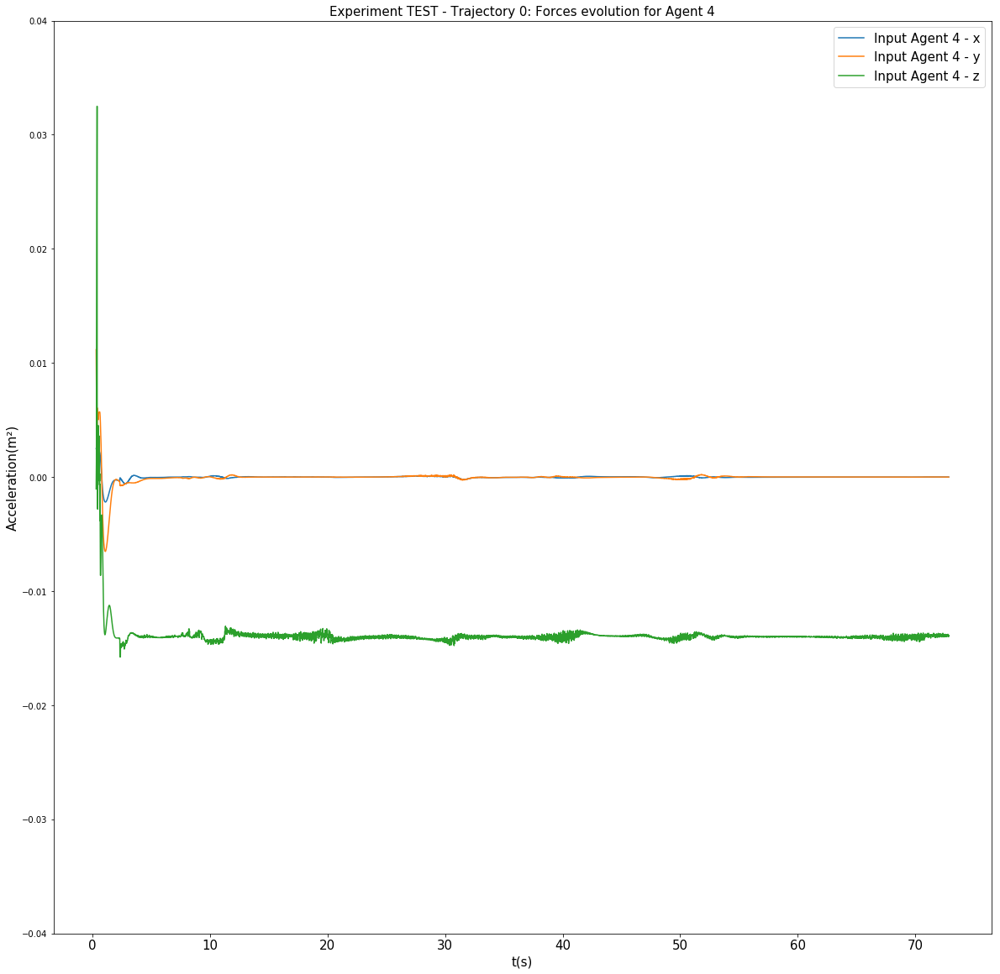

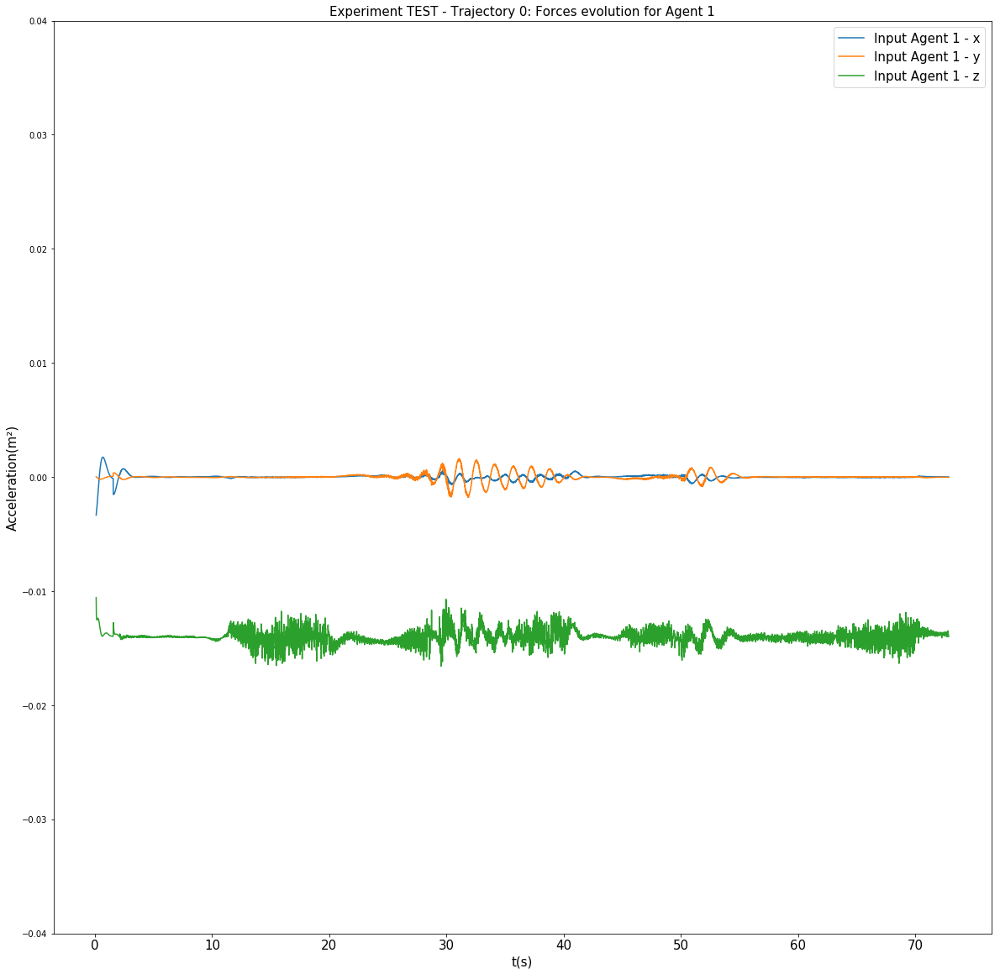

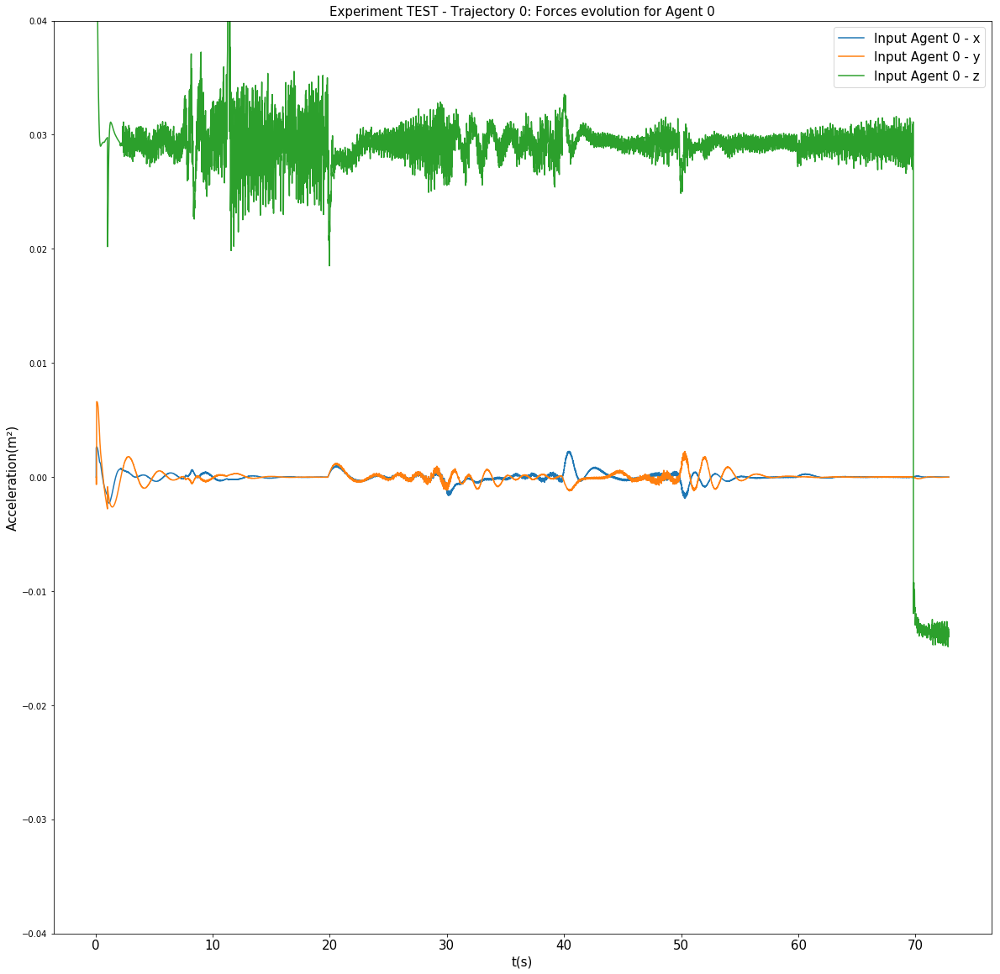

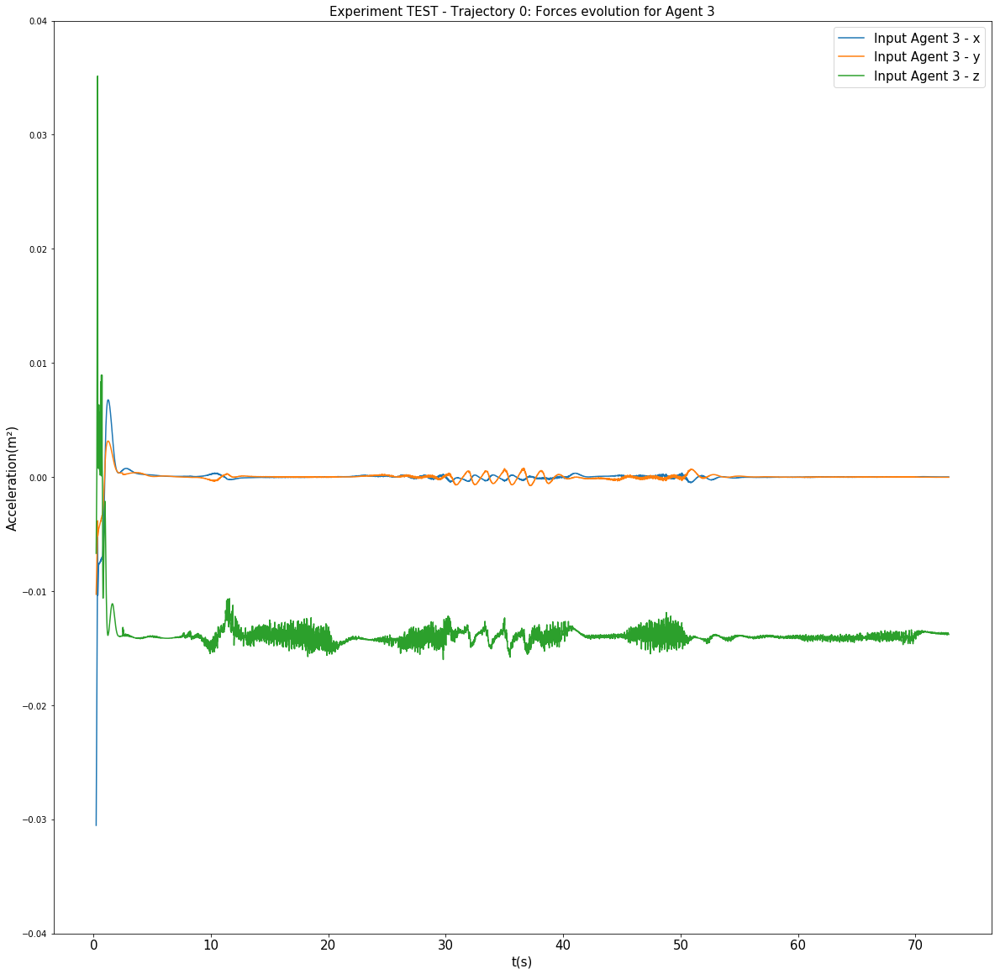

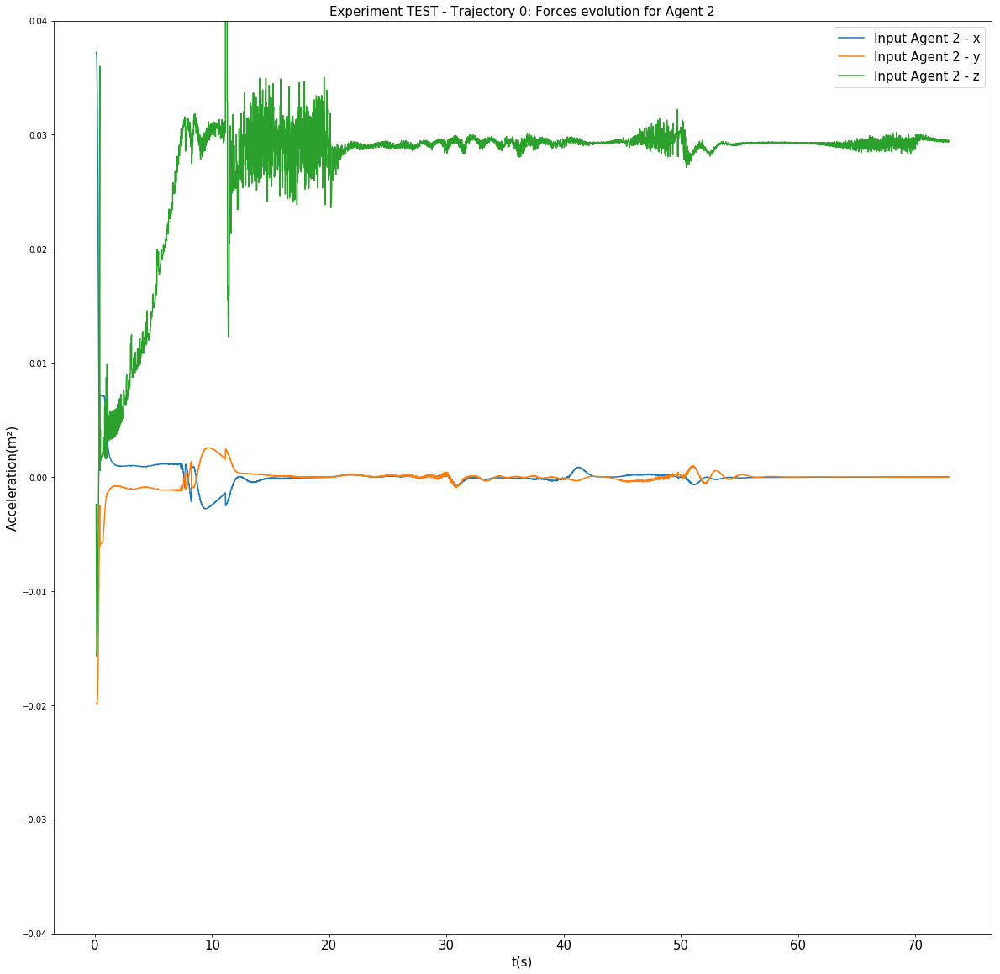

In [67]:
import matplotlib.pyplot as plt

for experiment in data.keys():
    for drone in forcesBetas[experiment].keys():
        fig = plt.figure(figsize=(20, 20))

        ax1 = plt.subplot(111)

        plt.plot( data[experiment]["forces_" + drone]["time"], forcesBetas[experiment][drone]["force"][:, 0], label = "Input Agent " + drone.split("_")[1] + " - x")
        
        plt.plot( data[experiment]["forces_" + drone]["time"], forcesBetas[experiment][drone]["force"][:, 1], label = "Input Agent " + drone.split("_")[1] + " - y")

        plt.plot( data[experiment]["forces_" + drone]["time"], forcesBetas[experiment][drone]["force"][:, 2], label = "Input Agent " + drone.split("_")[1] + " - z")
        plt.ylim([-0.04, 0.04])

        plt.title("Experiment " + experiment.split("_")[0] + " - Trajectory " + experiment.split("_")[1] + ": Forces evolution for Agent " + drone.split("_")[1], fontsize=15)
        plt.ylabel(u"Acceleration(m²)", fontsize=15)   
        plt.xlabel("t(s)", fontsize=15)   
        plt.setp(ax1.get_xticklabels(), fontsize=15)
        plt.legend(fontsize=15, loc='best')
        plt.savefig("./images/3axis_forces_experiment_" + experiment + "_" + drone + ".png", bbox_inches='tight')
        plt.savefig("./images/3axis_forces_experiment_" + experiment + "_" + drone  + ".eps", bbox_inches='tight')
        plt.show()

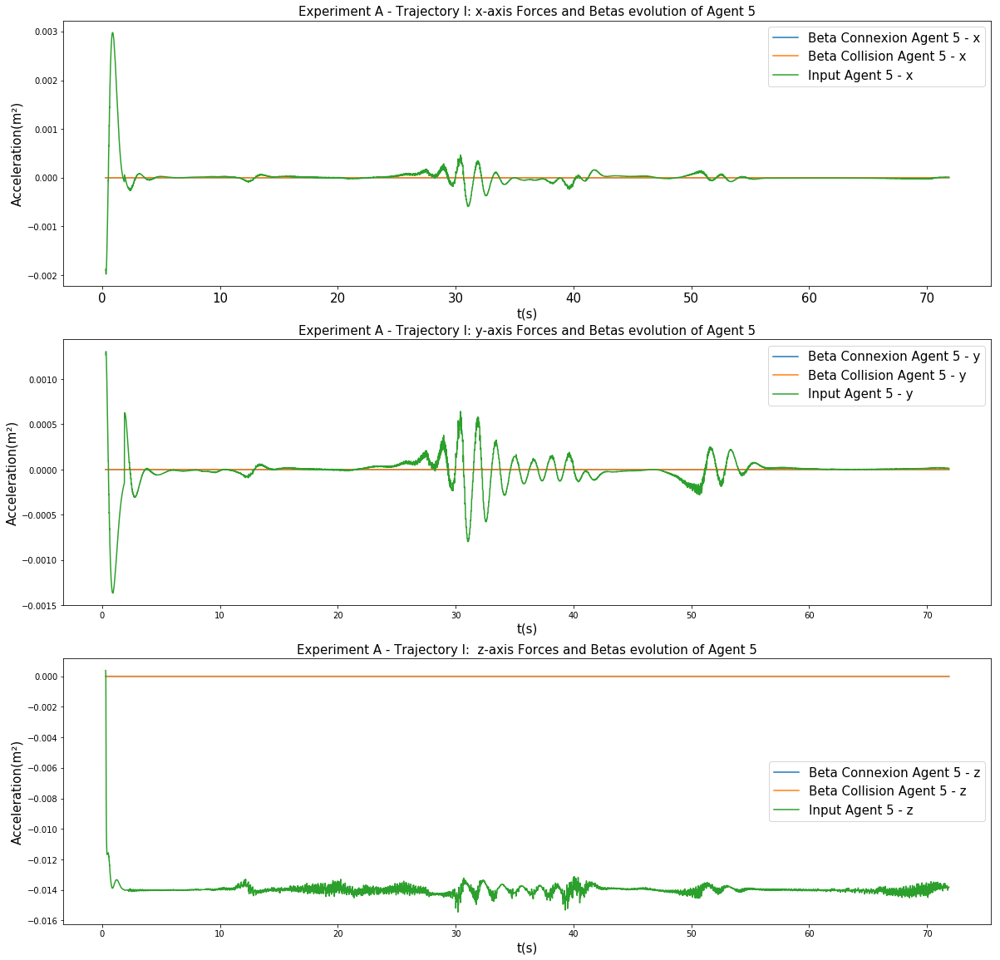

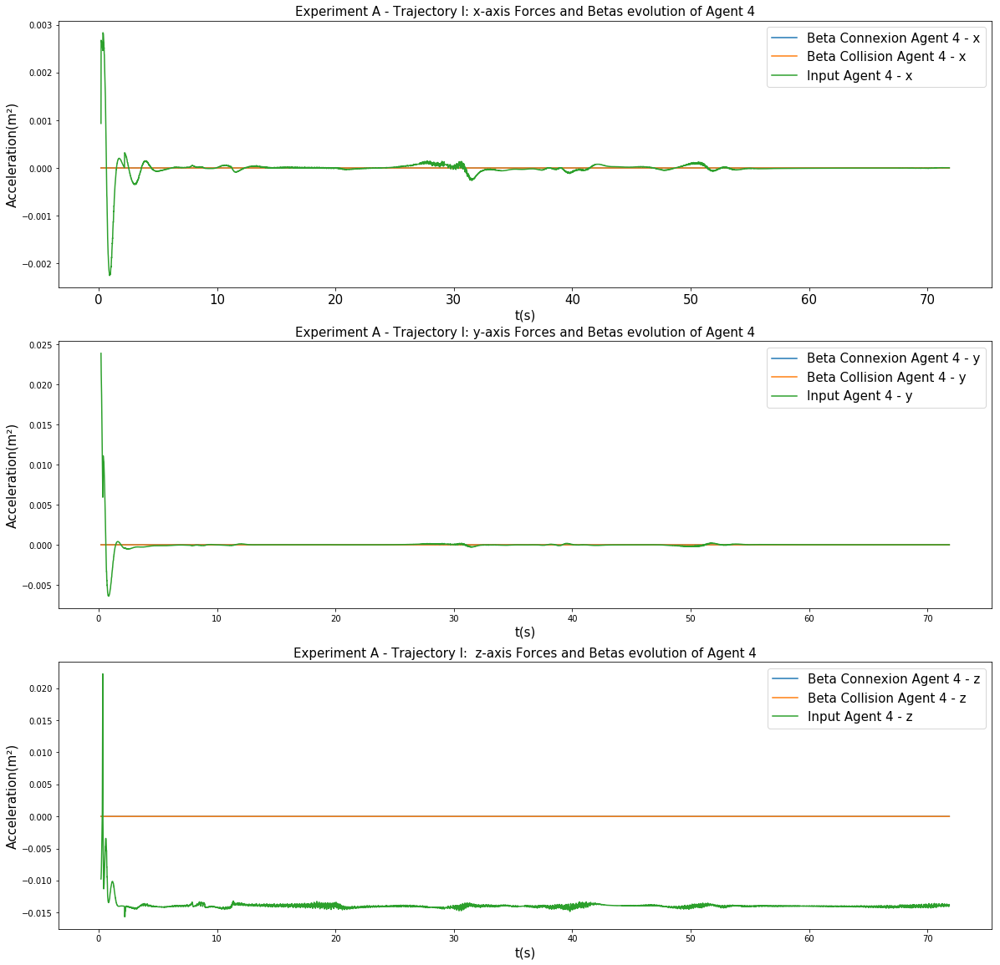

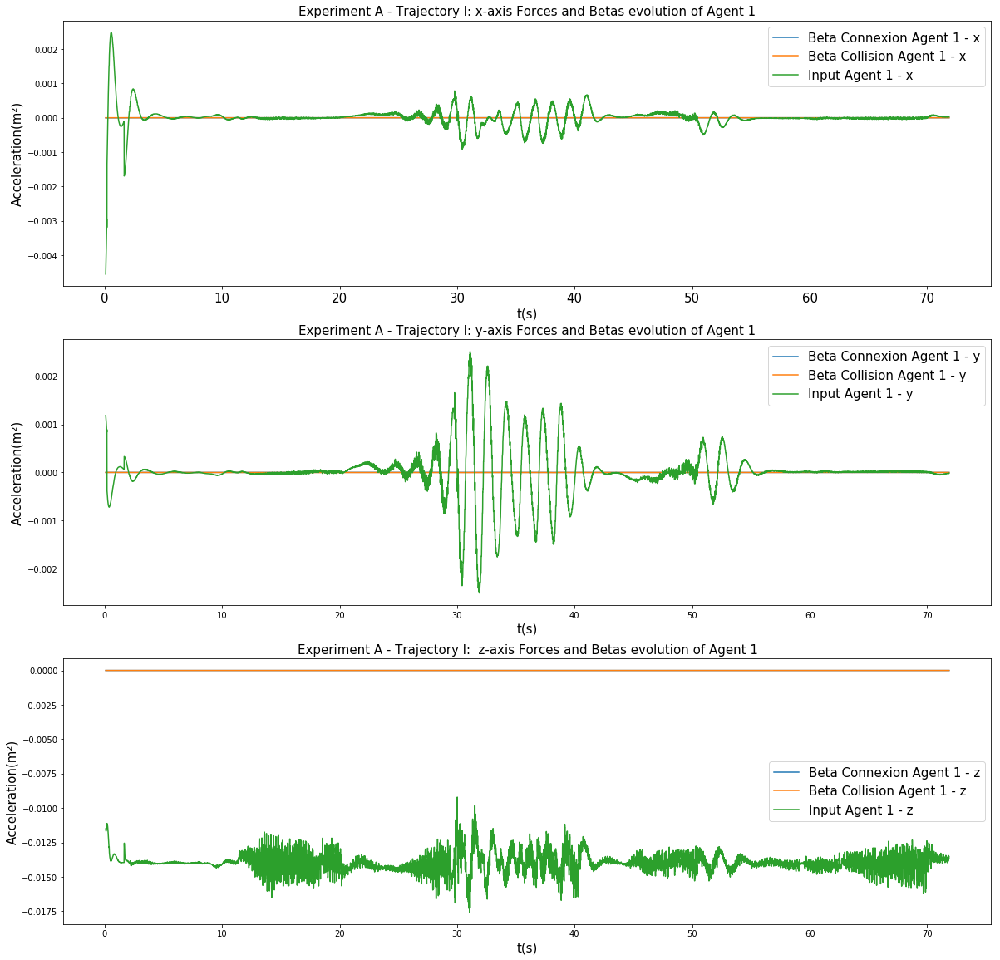

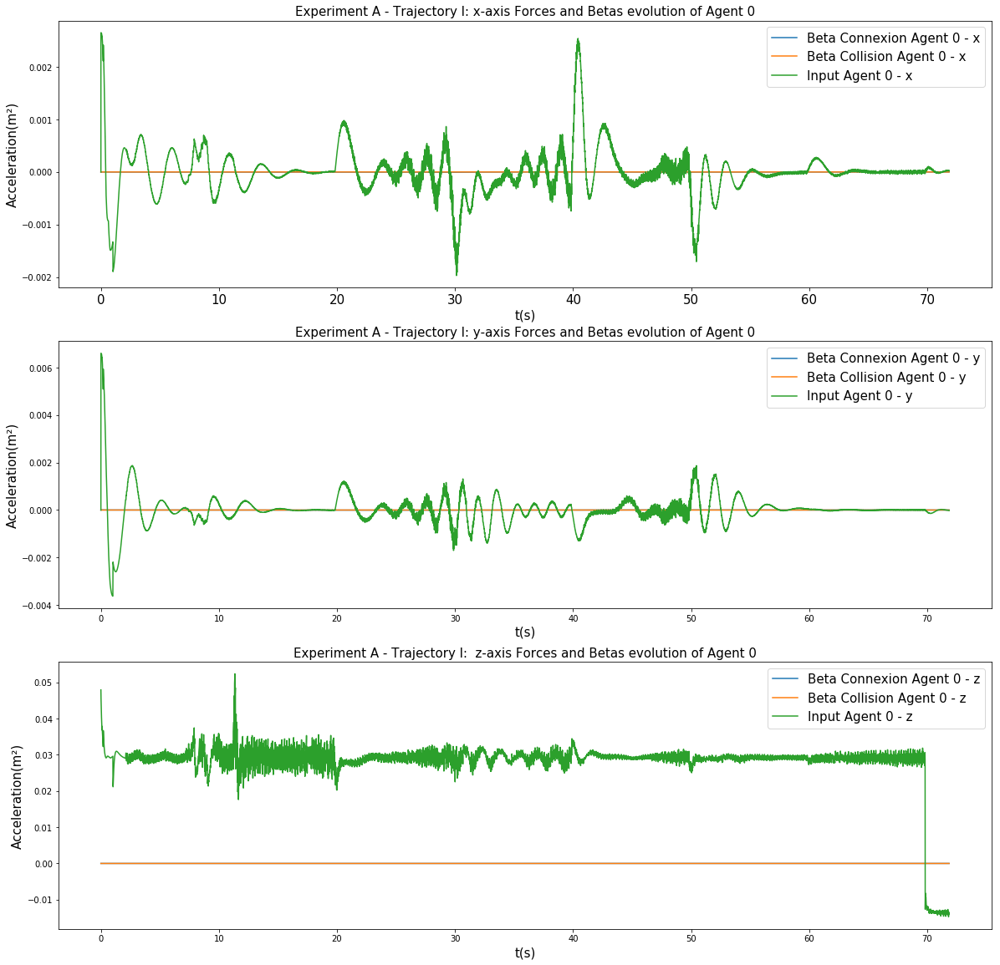

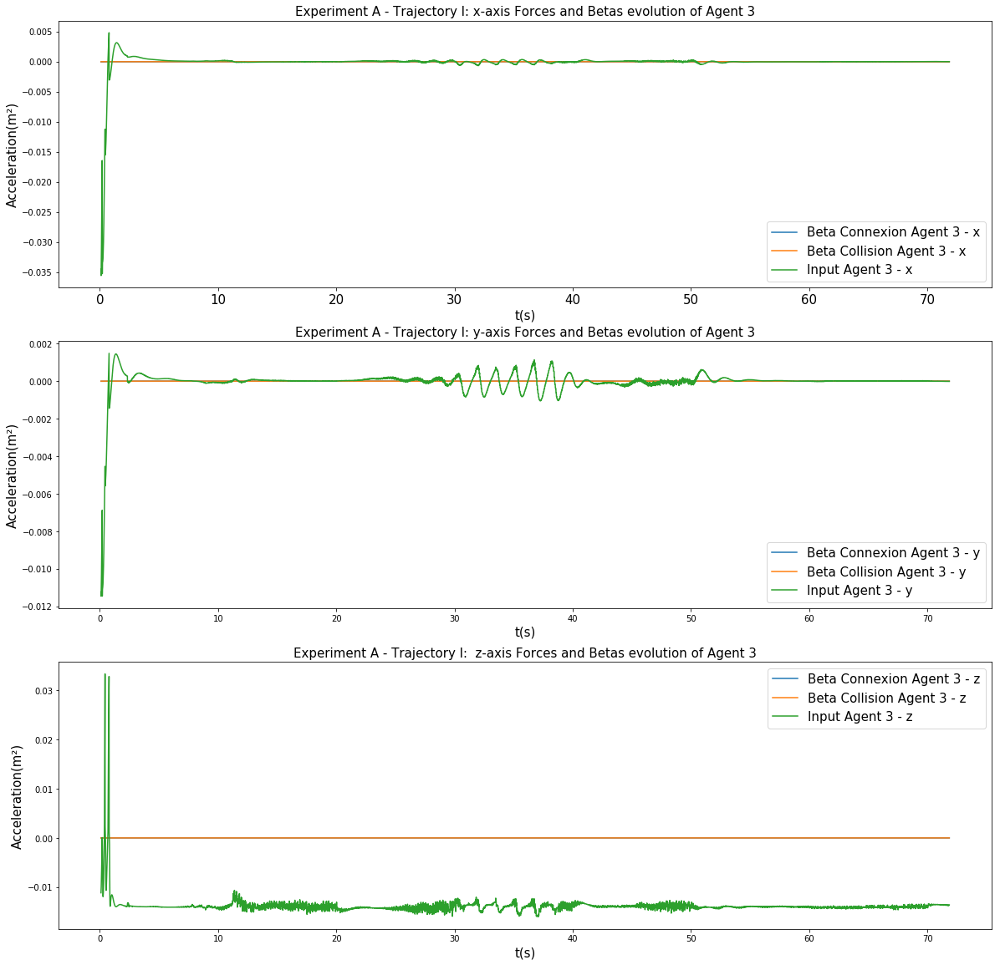

...

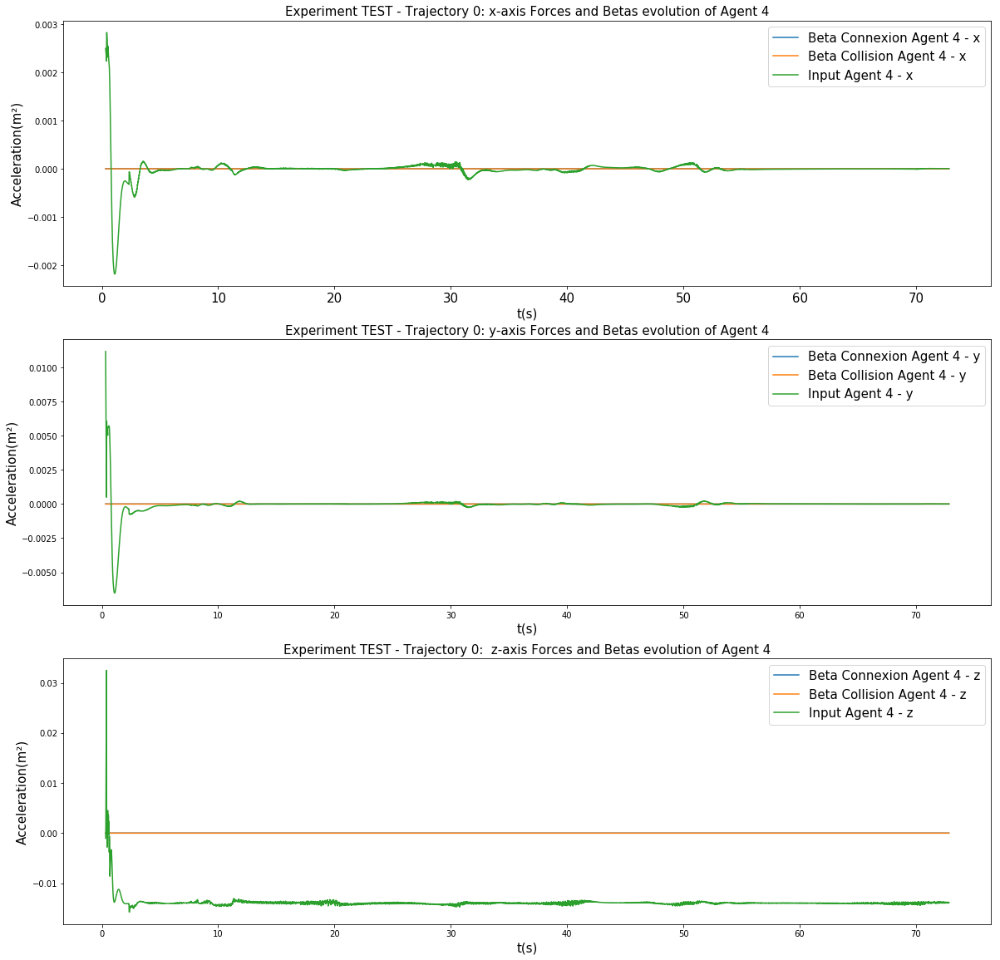

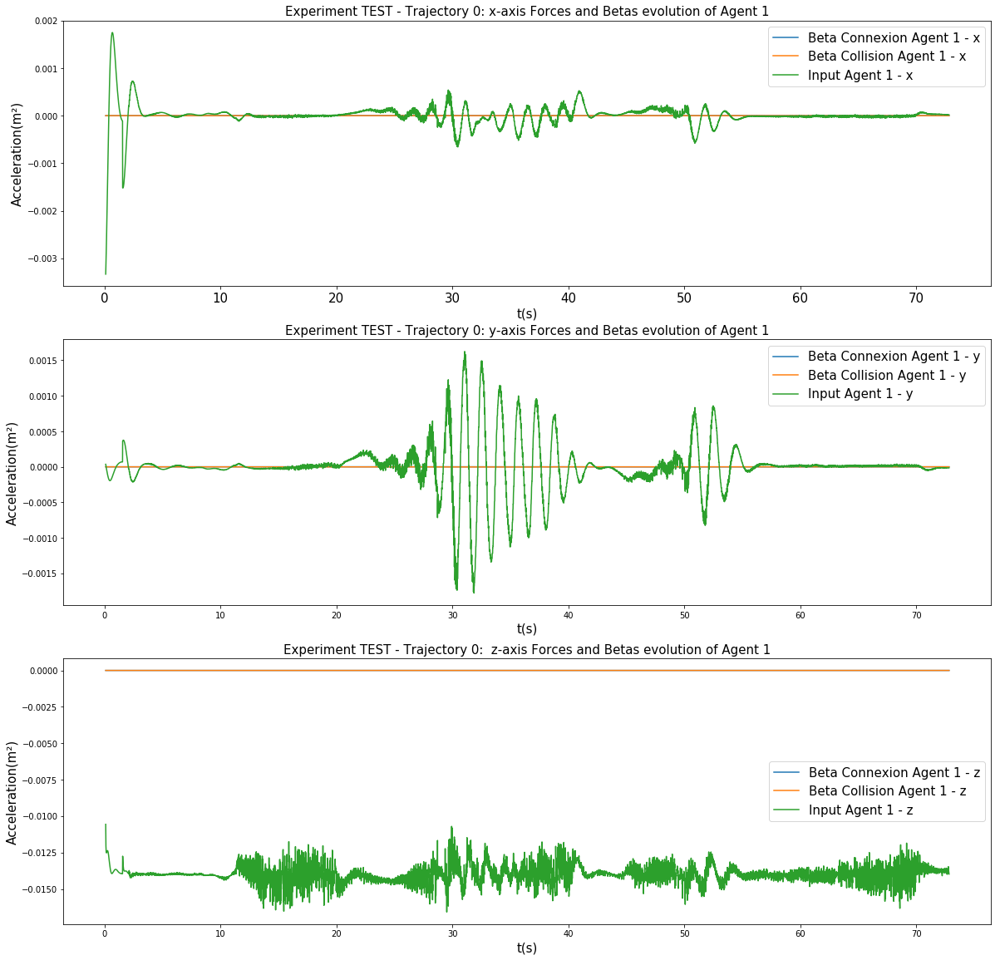

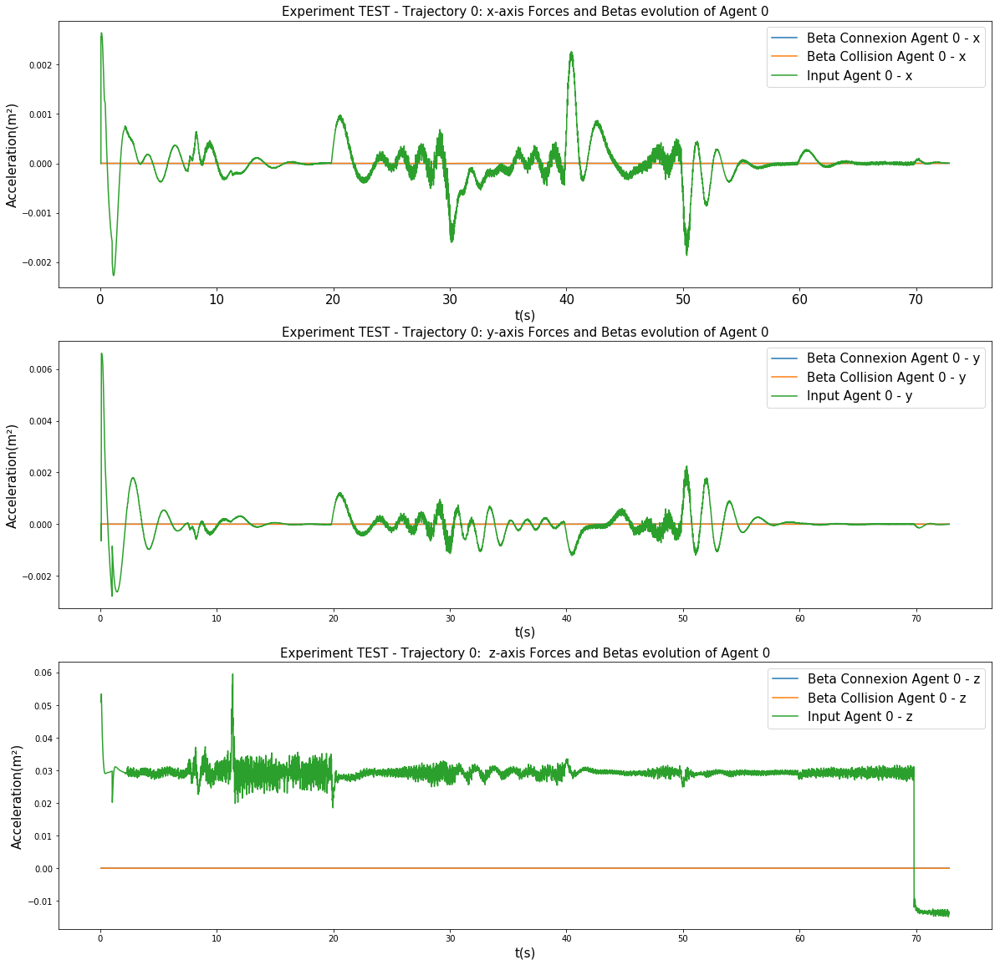

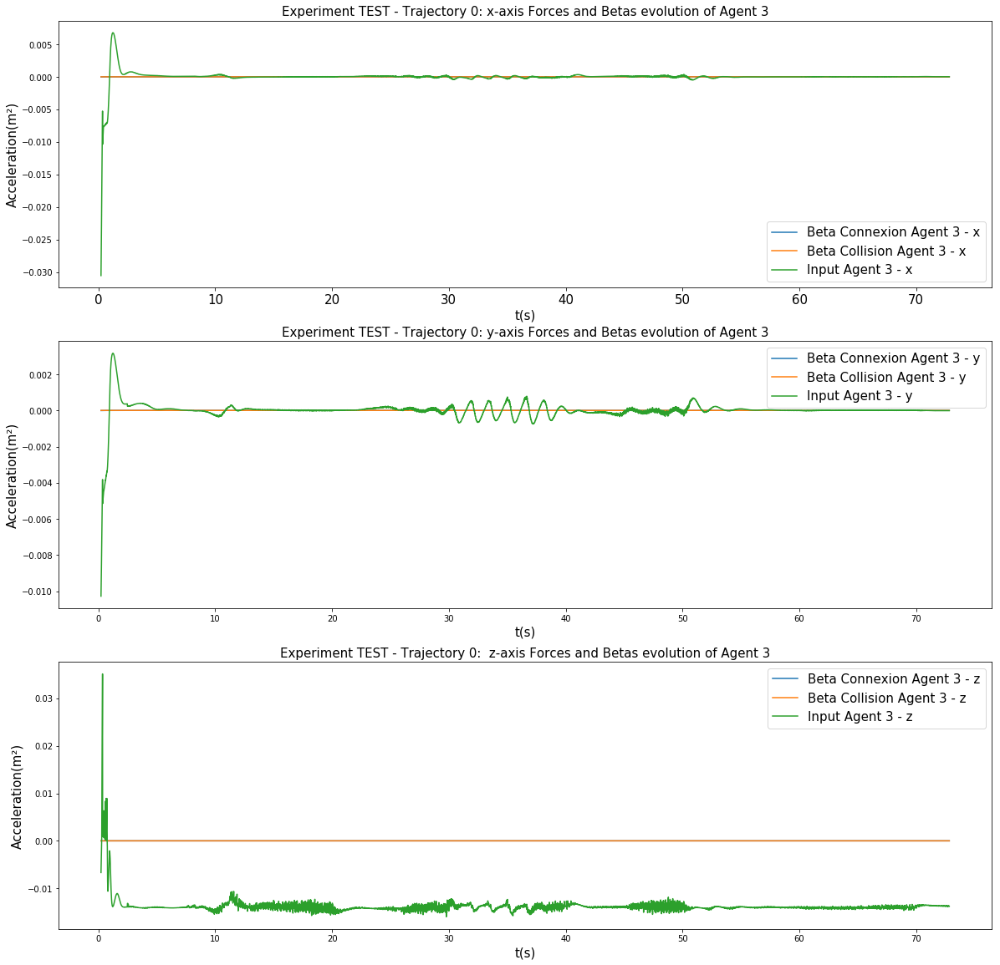

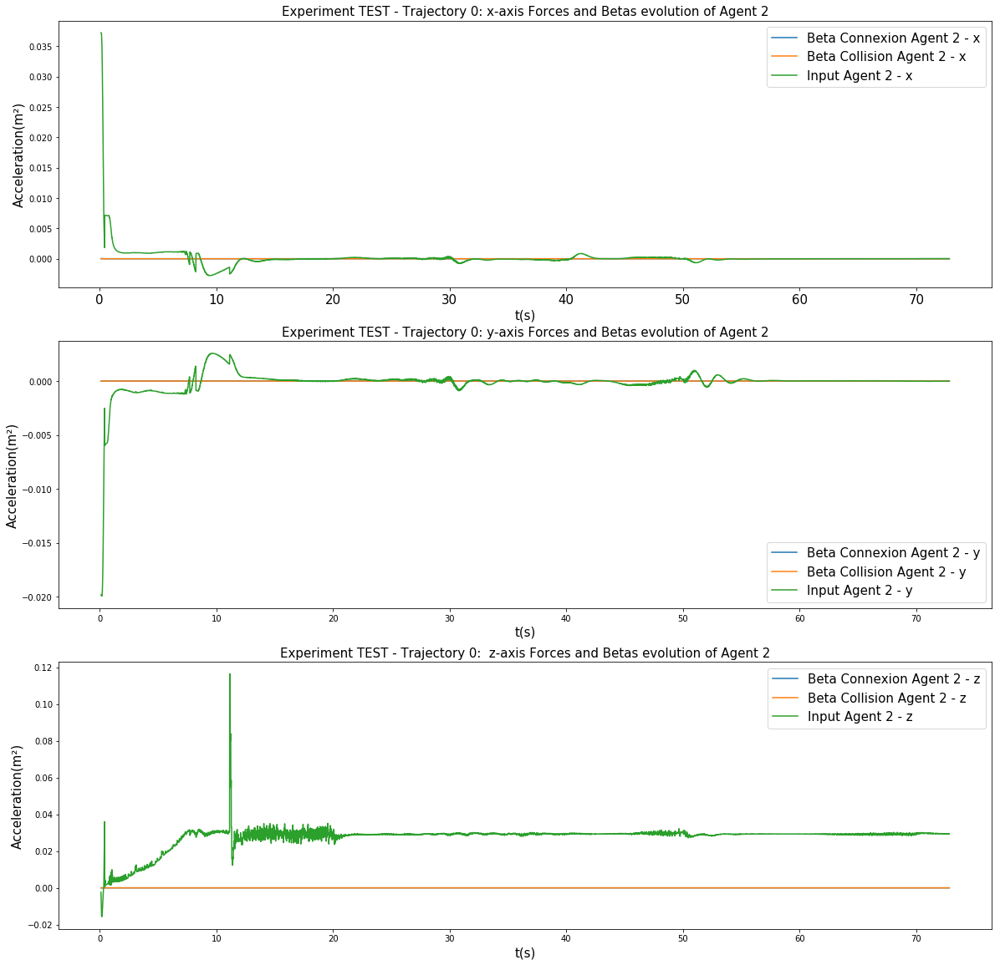

In [68]:
import matplotlib.pyplot as plt

for experiment in data.keys():
    for drone in forcesBetas[experiment].keys():
        fig = plt.figure(figsize=(20, 20))

        ax1 = plt.subplot(311)

        plt.plot( data[experiment]["betas_" + drone]["time"], forcesBetas[experiment][drone]["beta_con"][:, 0], label = "Beta Connexion Agent " + drone.split("_")[1] + " - x")
        plt.plot( data[experiment]["betas_" + drone]["time"], forcesBetas[experiment][drone]["beta_col"][:, 0], label = "Beta Collision Agent " + drone.split("_")[1] + " - x")
        plt.plot( data[experiment]["forces_" + drone]["time"], forcesBetas[experiment][drone]["force"][:, 0], label = "Input Agent " + drone.split("_")[1] + " - x")
        
        plt.title("Experiment " + experiment.split("_")[0] + " - Trajectory " + experiment.split("_")[1] + ": x-axis Forces and Betas evolution of Agent " + drone.split("_")[1], fontsize=15)
        plt.ylabel(u"Acceleration(m²)", fontsize=15)   
        plt.xlabel("t(s)", fontsize=15)   
        plt.setp(ax1.get_xticklabels(), fontsize=15)
        plt.legend(fontsize=15, loc='best')
    
        ax2 = plt.subplot(312)

        plt.plot( data[experiment]["betas_" + drone]["time"], forcesBetas[experiment][drone]["beta_con"][:, 1], label = "Beta Connexion Agent " + drone.split("_")[1] + " - y")
        plt.plot( data[experiment]["betas_" + drone]["time"], forcesBetas[experiment][drone]["beta_col"][:, 1], label = "Beta Collision Agent " + drone.split("_")[1] + " - y")
        plt.plot( data[experiment]["forces_" + drone]["time"], forcesBetas[experiment][drone]["force"][:, 1], label = "Input Agent " + drone.split("_")[1] + " - y")
       
        plt.title("Experiment " + experiment.split("_")[0] + " - Trajectory " + experiment.split("_")[1] + ": y-axis Forces and Betas evolution of Agent " + drone.split("_")[1], fontsize=15)
        plt.ylabel(u"Acceleration(m²)", fontsize=15)   
        plt.xlabel("t(s)", fontsize=15)   
        plt.setp(ax1.get_xticklabels(), fontsize=15)
        plt.legend(fontsize=15, loc='best')
        
        ax3 = plt.subplot(313)

        plt.plot( data[experiment]["betas_" + drone]["time"], forcesBetas[experiment][drone]["beta_con"][:, 2], label = "Beta Connexion Agent " + drone.split("_")[1] + " - z")
        plt.plot( data[experiment]["betas_" + drone]["time"], forcesBetas[experiment][drone]["beta_col"][:, 2], label = "Beta Collision Agent " + drone.split("_")[1] + " - z")
        plt.plot( data[experiment]["forces_" + drone]["time"], forcesBetas[experiment][drone]["force"][:, 2], label = "Input Agent " + drone.split("_")[1] + " - z")

        plt.title("Experiment " + experiment.split("_")[0] + " - Trajectory " + experiment.split("_")[1] + ":  z-axis Forces and Betas evolution of Agent " + drone.split("_")[1],fontsize=15)
        plt.ylabel(u"Acceleration(m²)", fontsize=15)   
        plt.xlabel("t(s)", fontsize=15)   
        plt.setp(ax1.get_xticklabels(), fontsize=15)
        plt.legend(fontsize=15, loc='best')
        plt.savefig("./images/subplot_axis_betas_and_forces_experiment_" + experiment + "_" + drone + ".png", bbox_inches='tight')
        plt.savefig("./images/subplot_axis_betas_and_forces_experiment_" + experiment + "_" + drone + ".eps", bbox_inches='tight')
        plt.show()


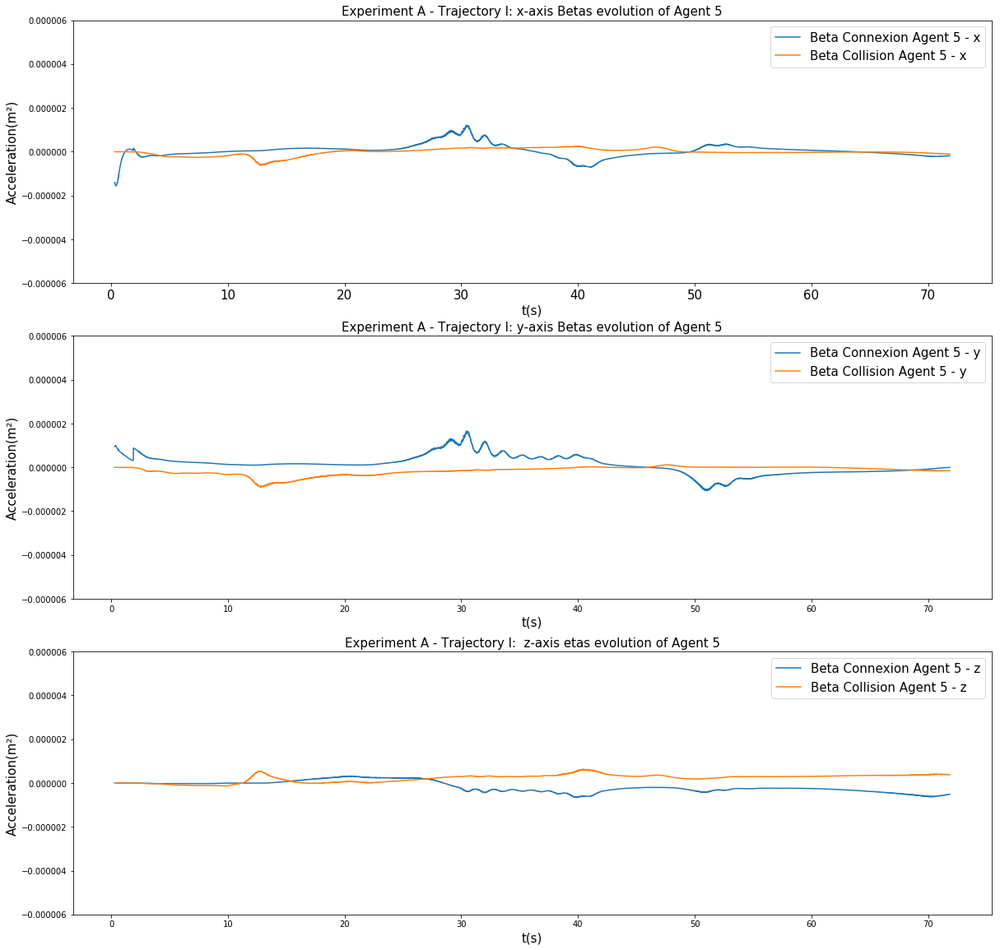

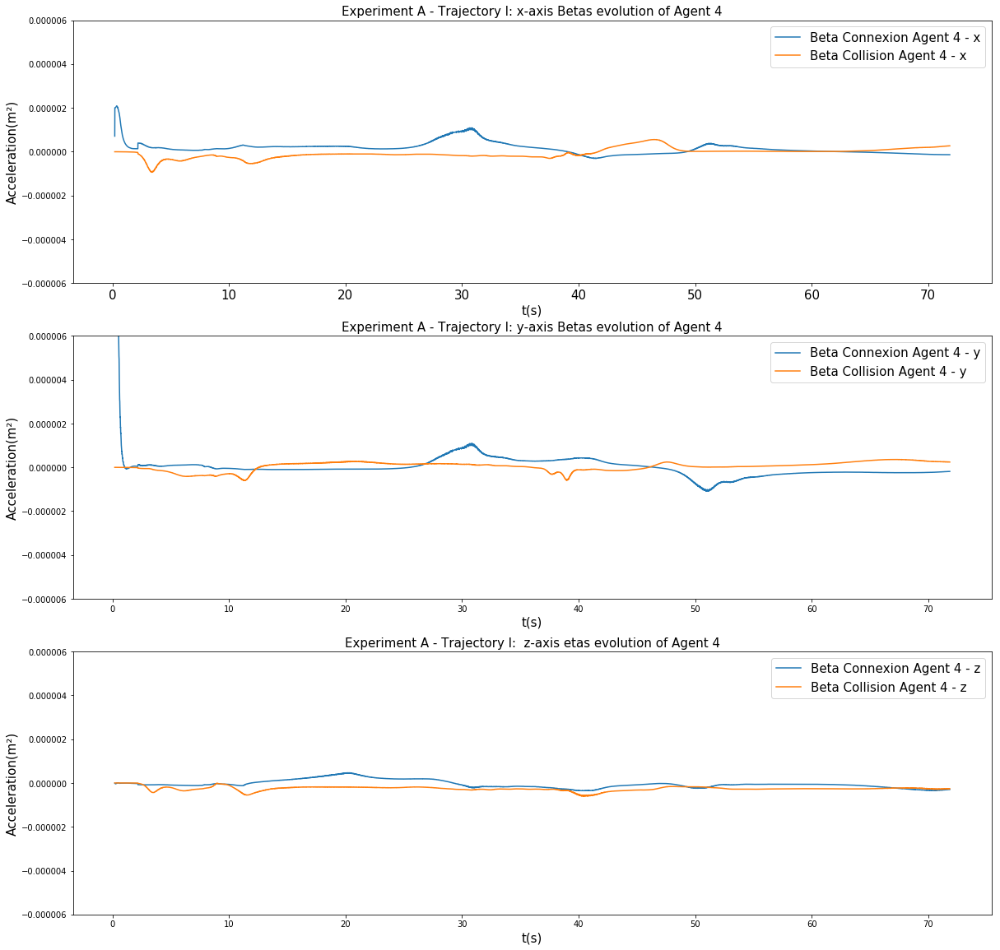

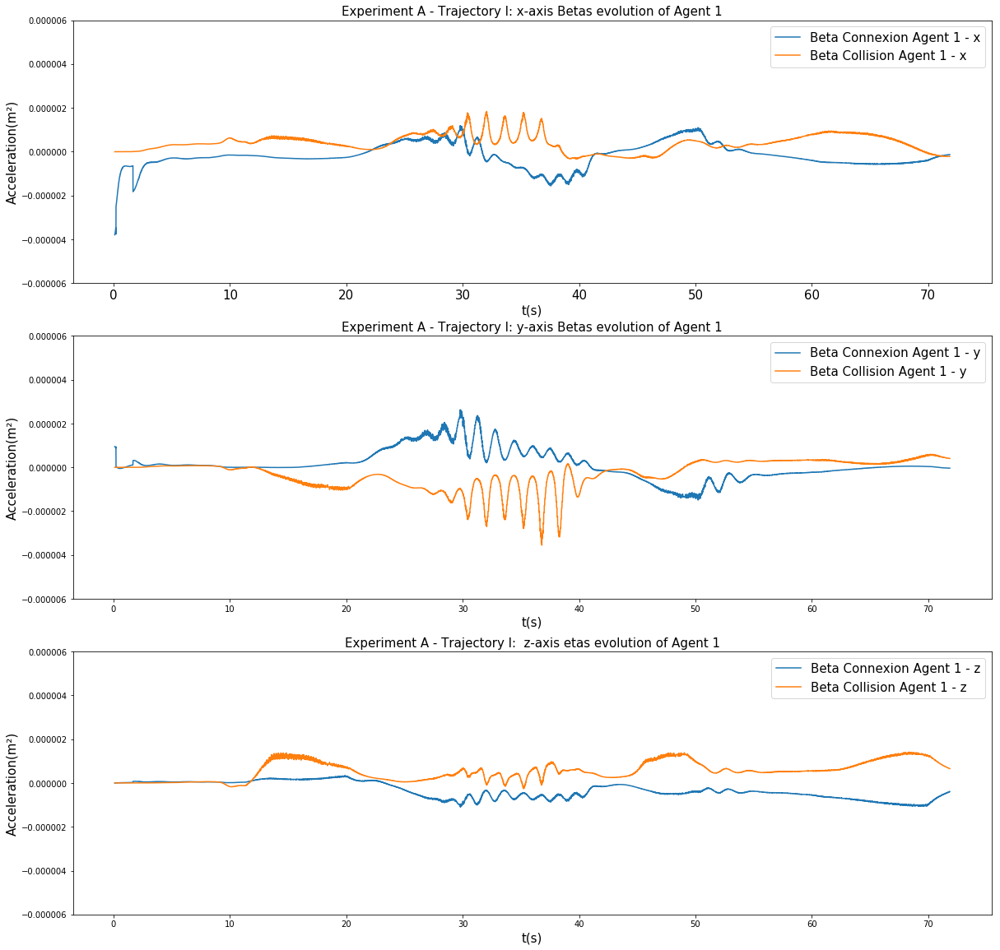

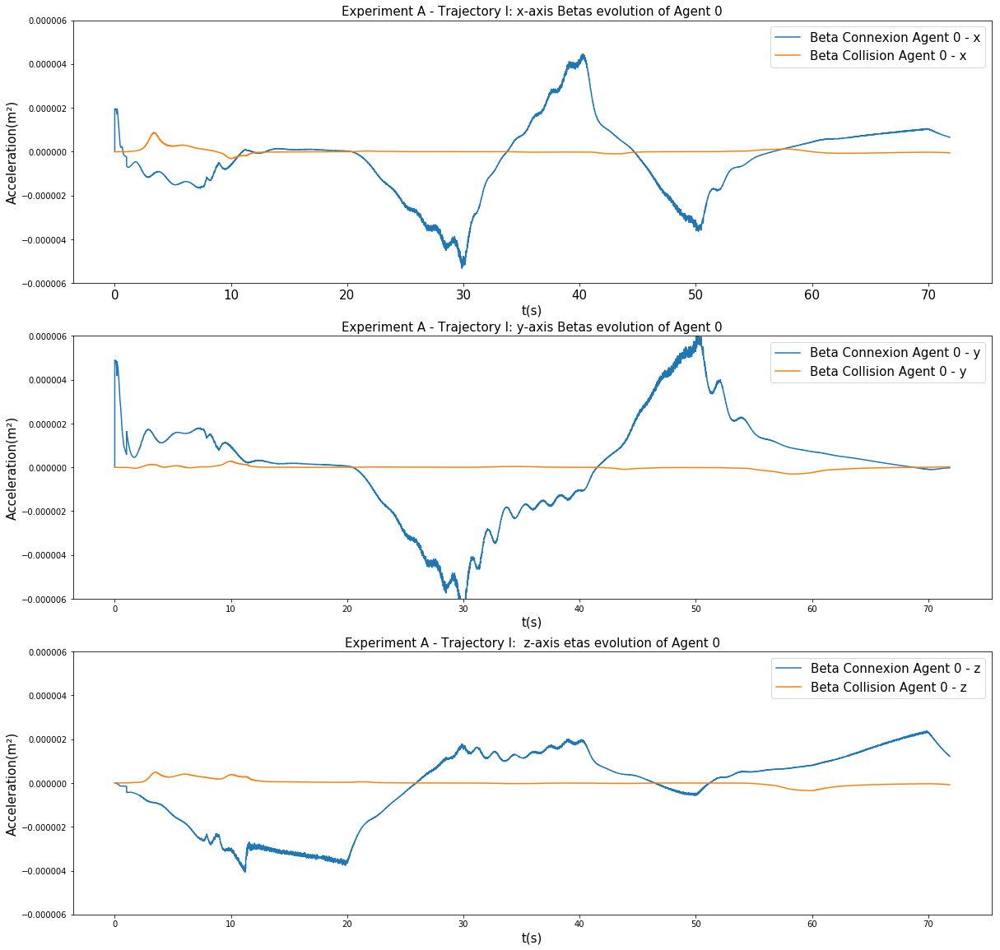

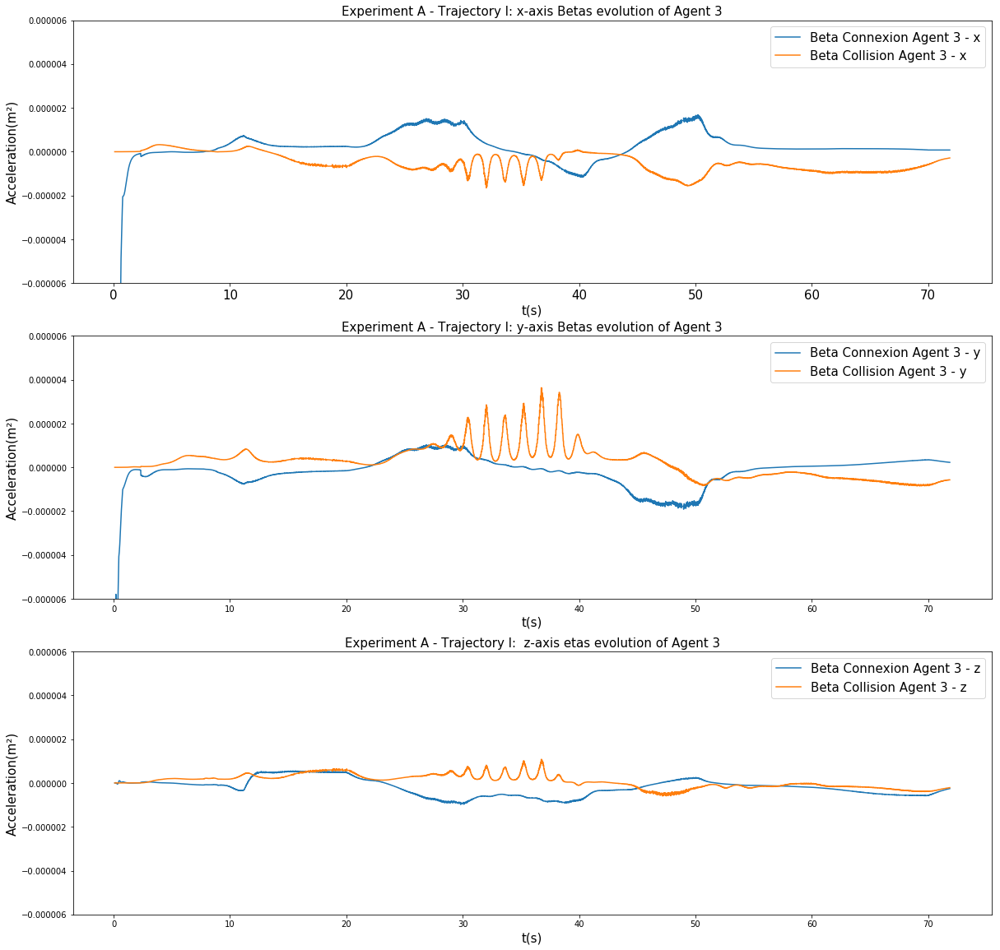

...

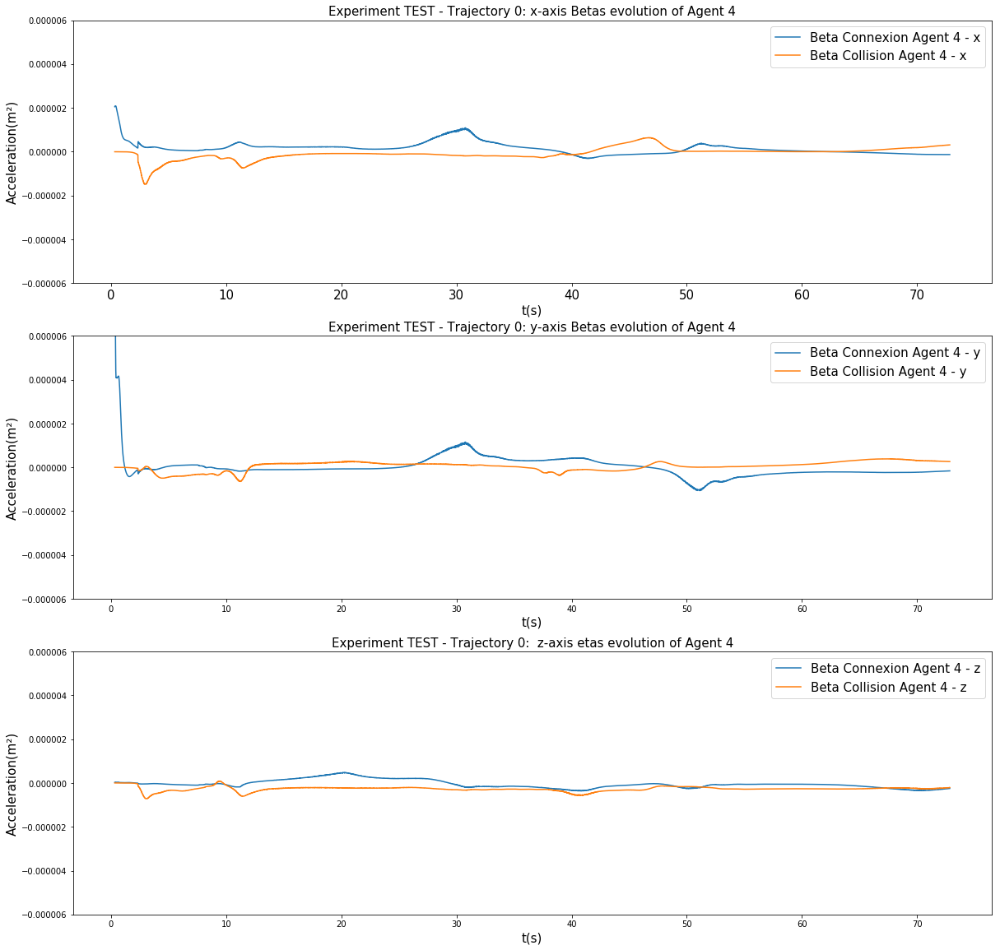

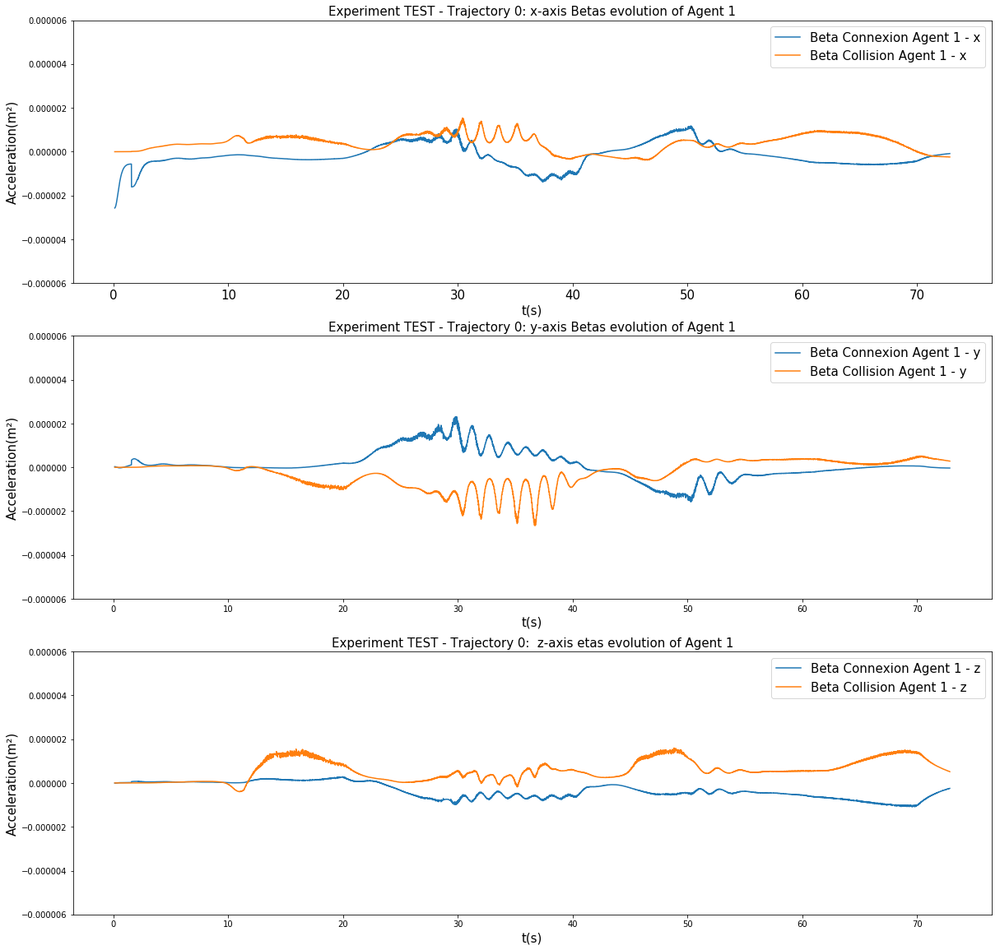

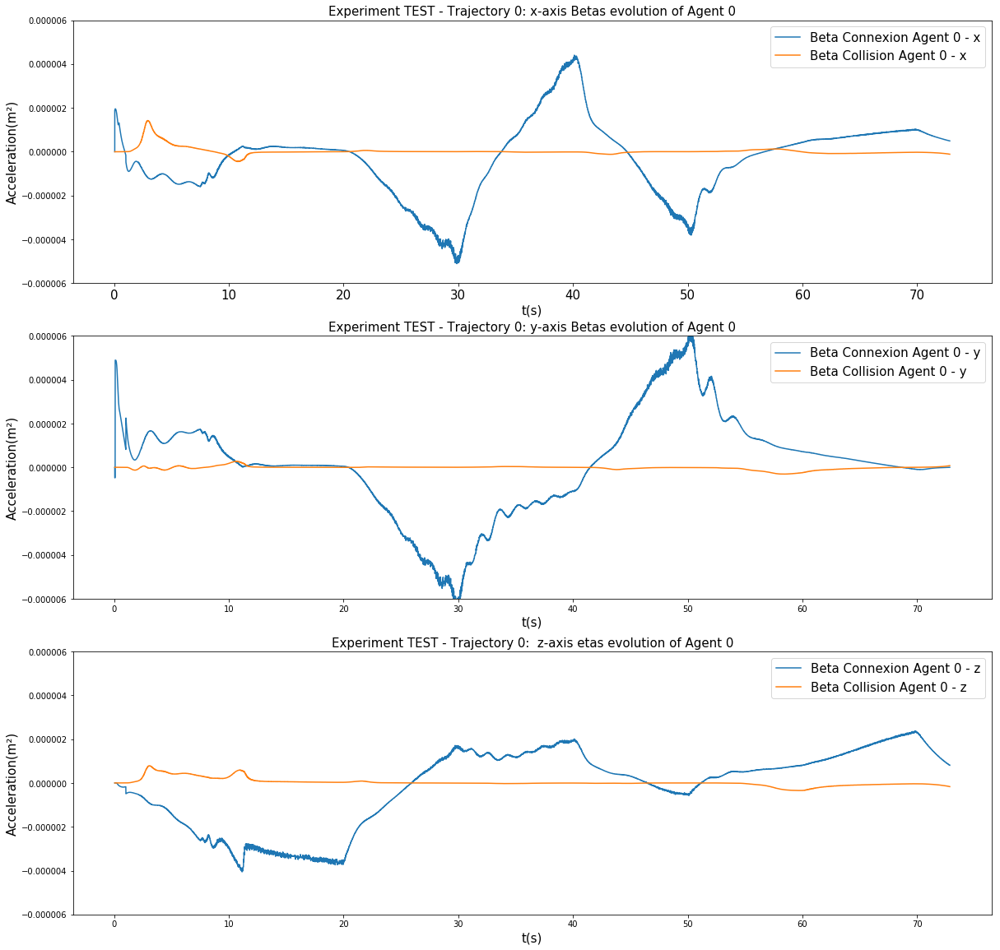

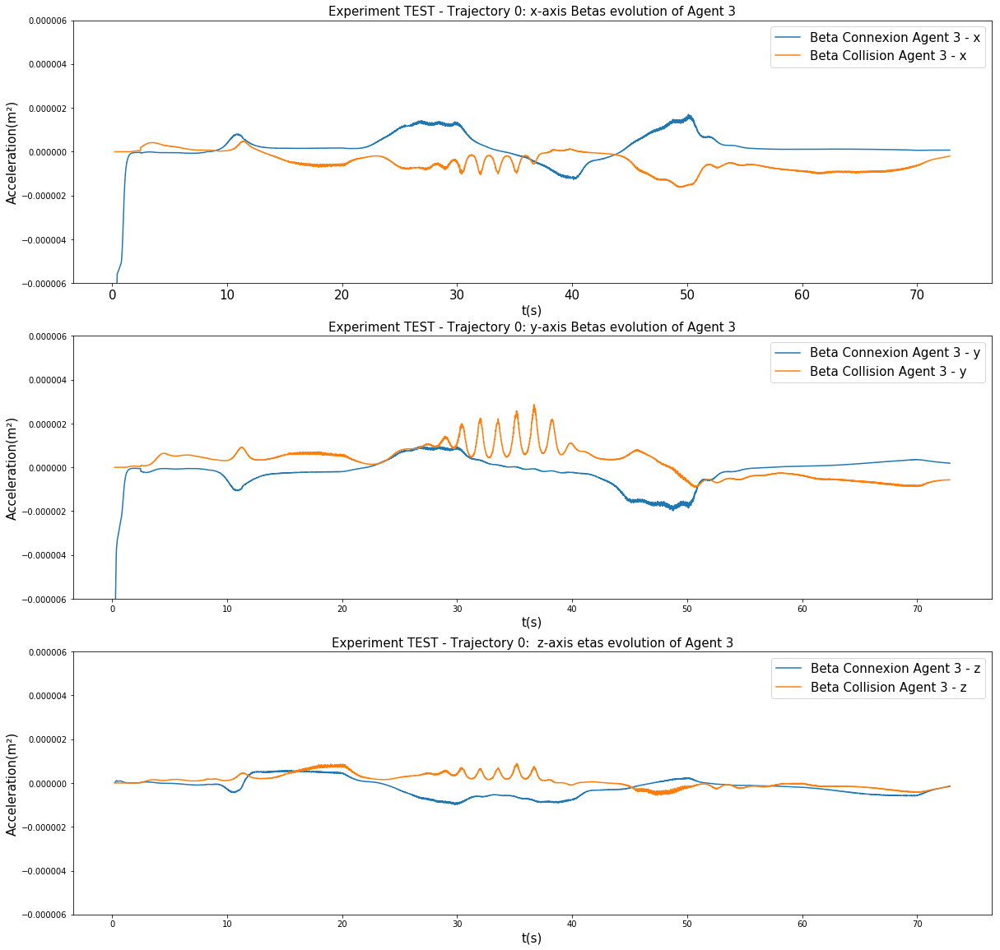

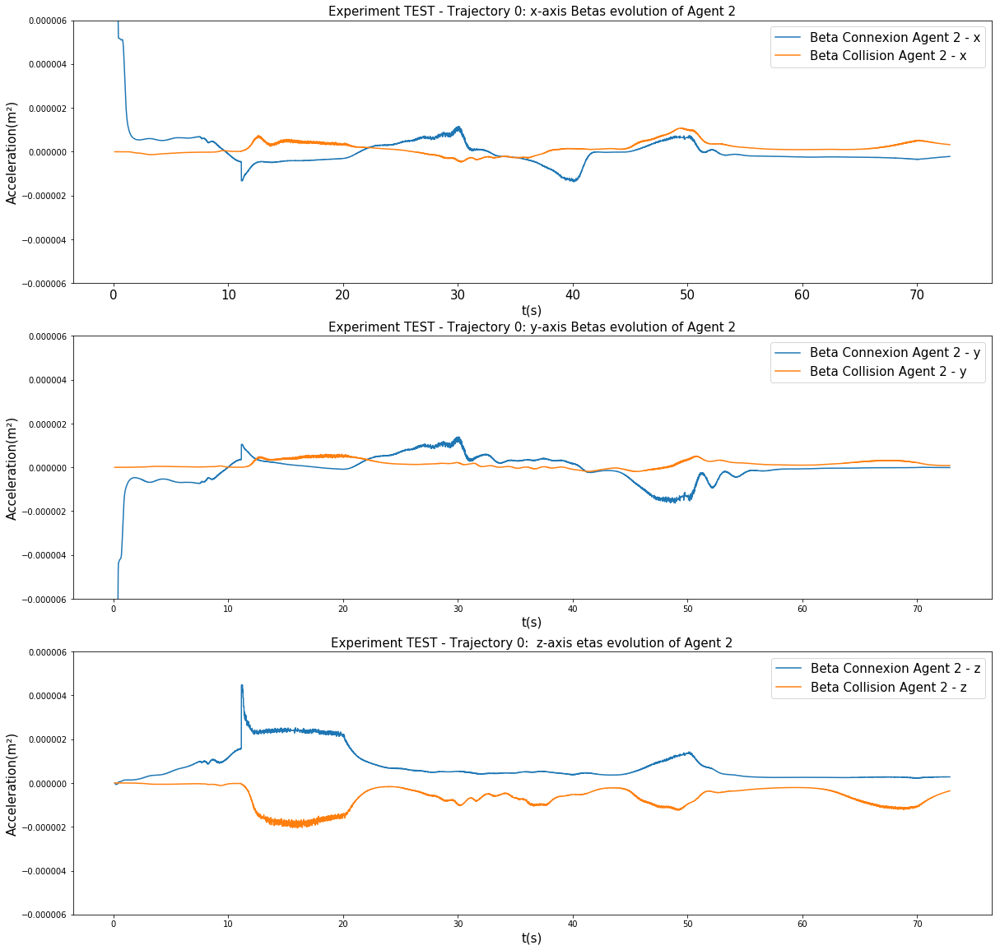

In [71]:
import matplotlib.pyplot as plt

for experiment in data.keys():
    for drone in forcesBetas[experiment].keys():
        fig = plt.figure(figsize=(20, 20))

        ax1 = plt.subplot(311)

        plt.plot( data[experiment]["betas_" + drone]["time"], forcesBetas[experiment][drone]["beta_con"][:, 0], label = "Beta Connexion Agent " + drone.split("_")[1] + " - x")
        plt.plot( data[experiment]["betas_" + drone]["time"], forcesBetas[experiment][drone]["beta_col"][:, 0], label = "Beta Collision Agent " + drone.split("_")[1] + " - x")
        
        plt.ylim([-0.000006, 0.000006])
        plt.title("Experiment " + experiment.split("_")[0] + " - Trajectory " + experiment.split("_")[1] + ": x-axis Betas evolution of Agent " + drone.split("_")[1], fontsize=15)
        plt.ylabel(u"Acceleration(m²)", fontsize=15)   
        plt.xlabel("t(s)", fontsize=15)   
        plt.setp(ax1.get_xticklabels(), fontsize=15)
        plt.legend(fontsize=15, loc='best')
    
        ax2 = plt.subplot(312)

        plt.plot( data[experiment]["betas_" + drone]["time"], forcesBetas[experiment][drone]["beta_con"][:, 1], label = "Beta Connexion Agent " + drone.split("_")[1] + " - y")
        plt.plot( data[experiment]["betas_" + drone]["time"], forcesBetas[experiment][drone]["beta_col"][:, 1], label = "Beta Collision Agent " + drone.split("_")[1] + " - y")
       
        plt.ylim([-0.000006, 0.000006])
        plt.title("Experiment " + experiment.split("_")[0] + " - Trajectory " + experiment.split("_")[1] + ": y-axis Betas evolution of Agent " + drone.split("_")[1], fontsize=15)
        plt.ylabel(u"Acceleration(m²)", fontsize=15)   
        plt.xlabel("t(s)", fontsize=15)   
        plt.setp(ax1.get_xticklabels(), fontsize=15)
        plt.legend(fontsize=15, loc='best')
        
        ax3 = plt.subplot(313)

        plt.plot( data[experiment]["betas_" + drone]["time"], forcesBetas[experiment][drone]["beta_con"][:, 2], label = "Beta Connexion Agent " + drone.split("_")[1] + " - z")
        plt.plot( data[experiment]["betas_" + drone]["time"], forcesBetas[experiment][drone]["beta_col"][:, 2], label = "Beta Collision Agent " + drone.split("_")[1] + " - z")

        plt.ylim([-0.000006, 0.000006])
        plt.title("Experiment " + experiment.split("_")[0] + " - Trajectory " + experiment.split("_")[1] + ":  z-axis etas evolution of Agent " + drone.split("_")[1],fontsize=15)
        plt.ylabel(u"Acceleration(m²)", fontsize=15)   
        plt.xlabel("t(s)", fontsize=15)   
        plt.setp(ax1.get_xticklabels(), fontsize=15)
        plt.legend(fontsize=15, loc='best')
        plt.savefig("./images/subplot_axis_betas_experiment_" + experiment + "_" + drone + ".png", bbox_inches='tight')
        plt.savefig("./images/subplot_axis_betas_experiment_" + experiment + "_" + drone + ".eps", bbox_inches='tight')
        plt.show()

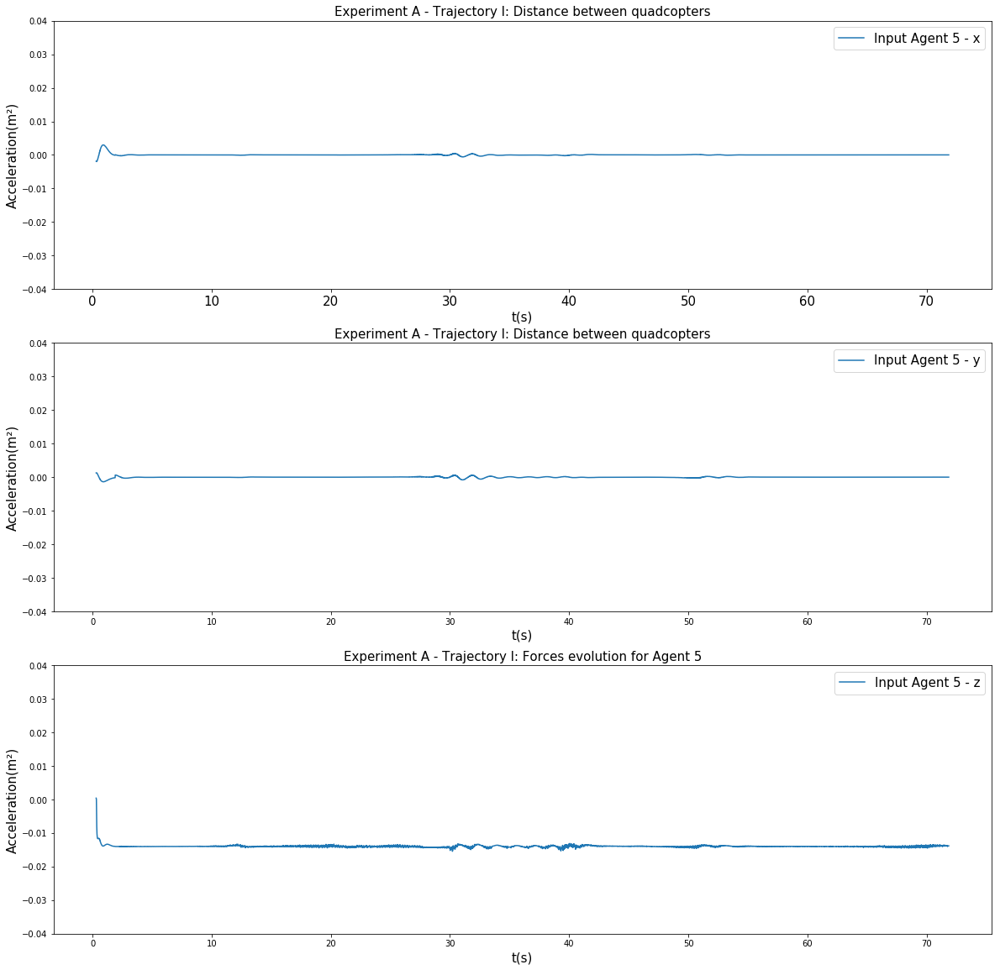

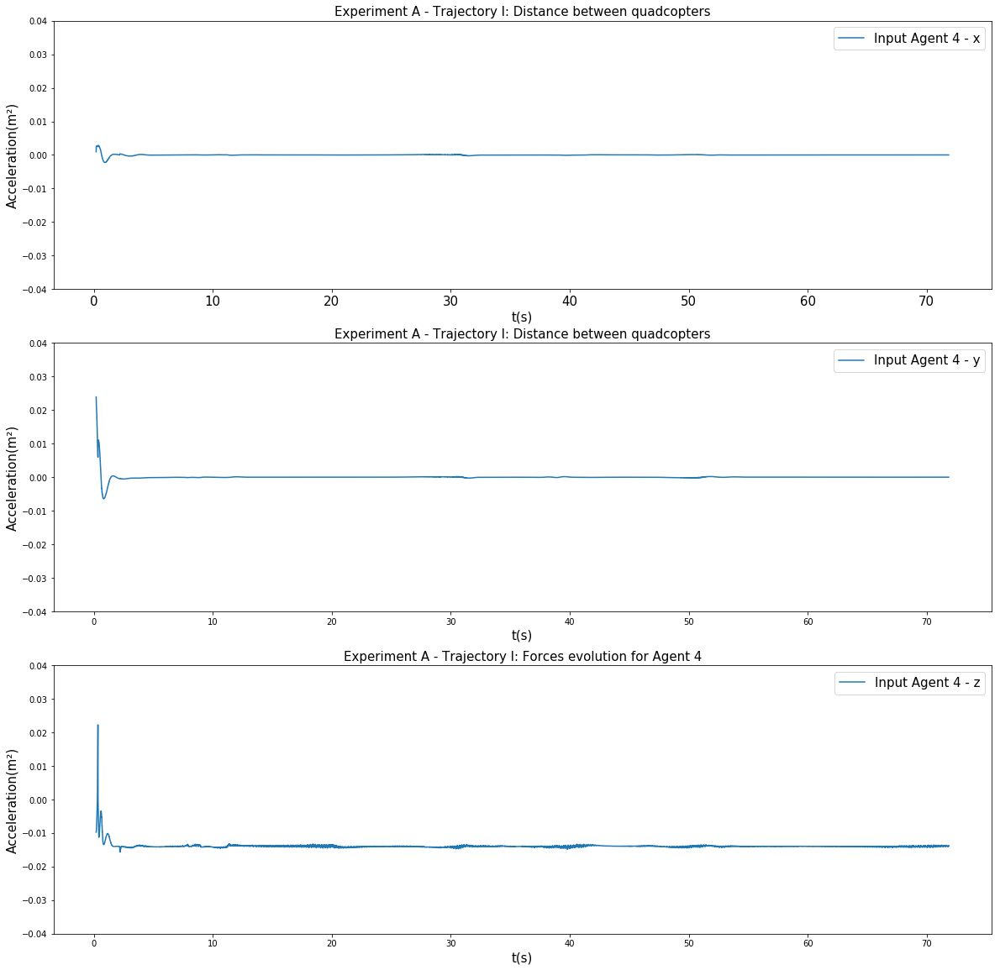

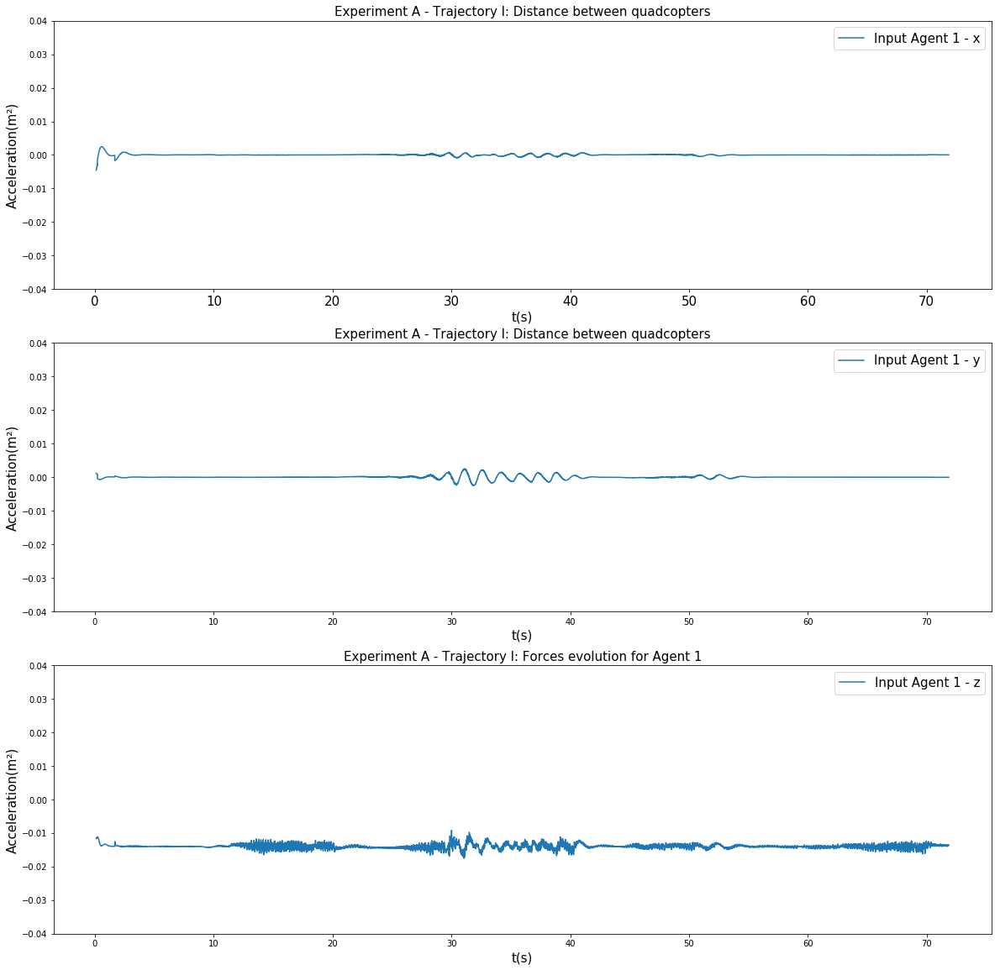

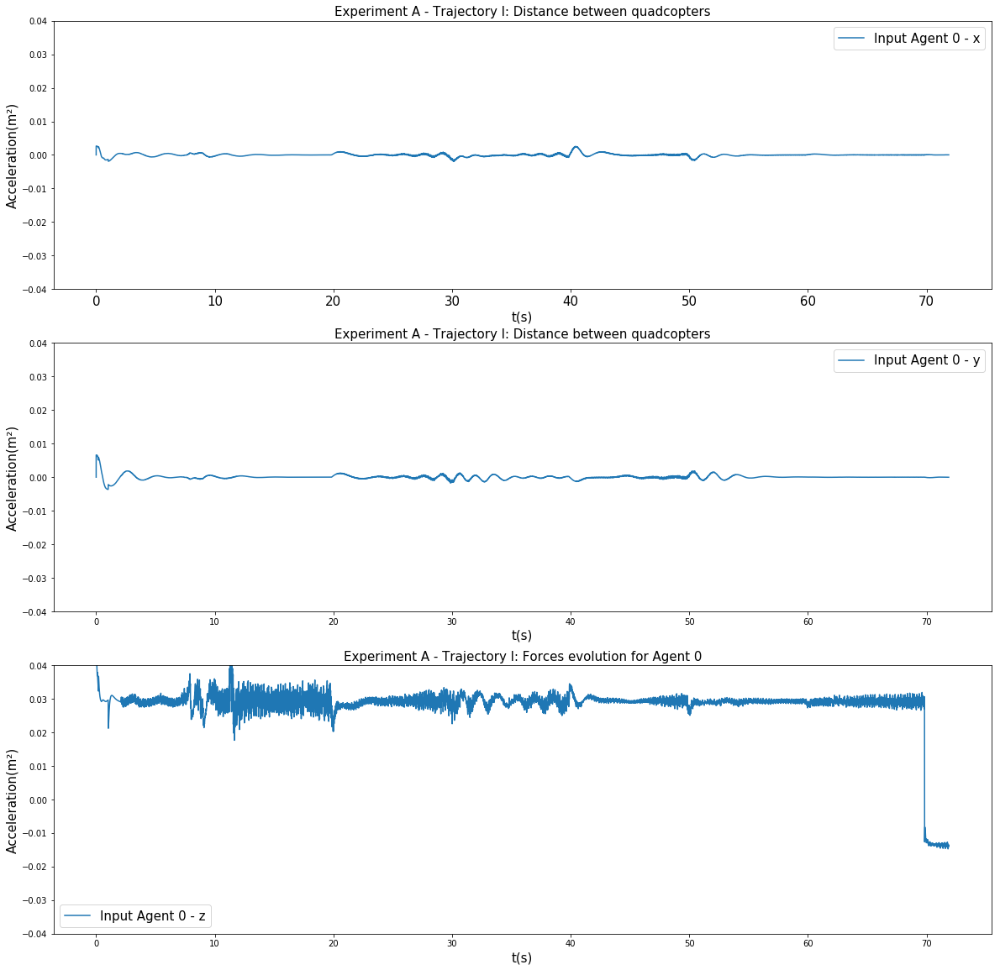

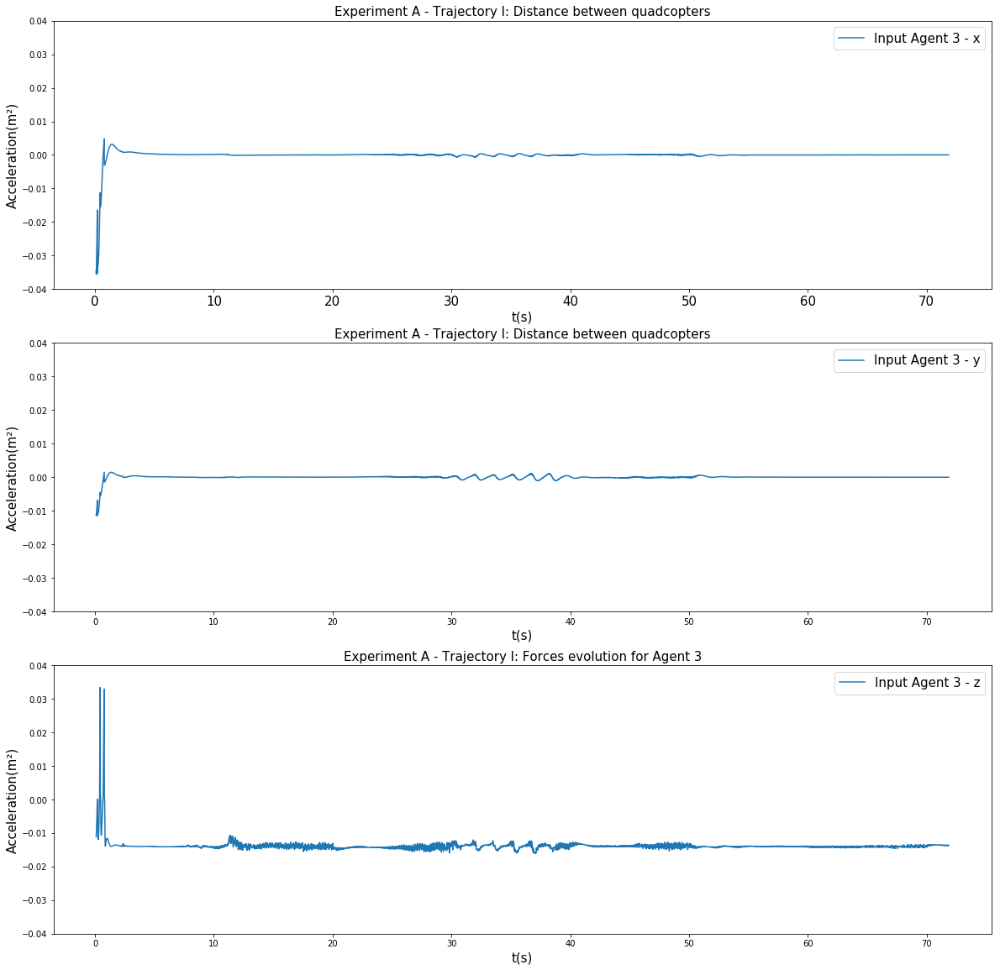

...

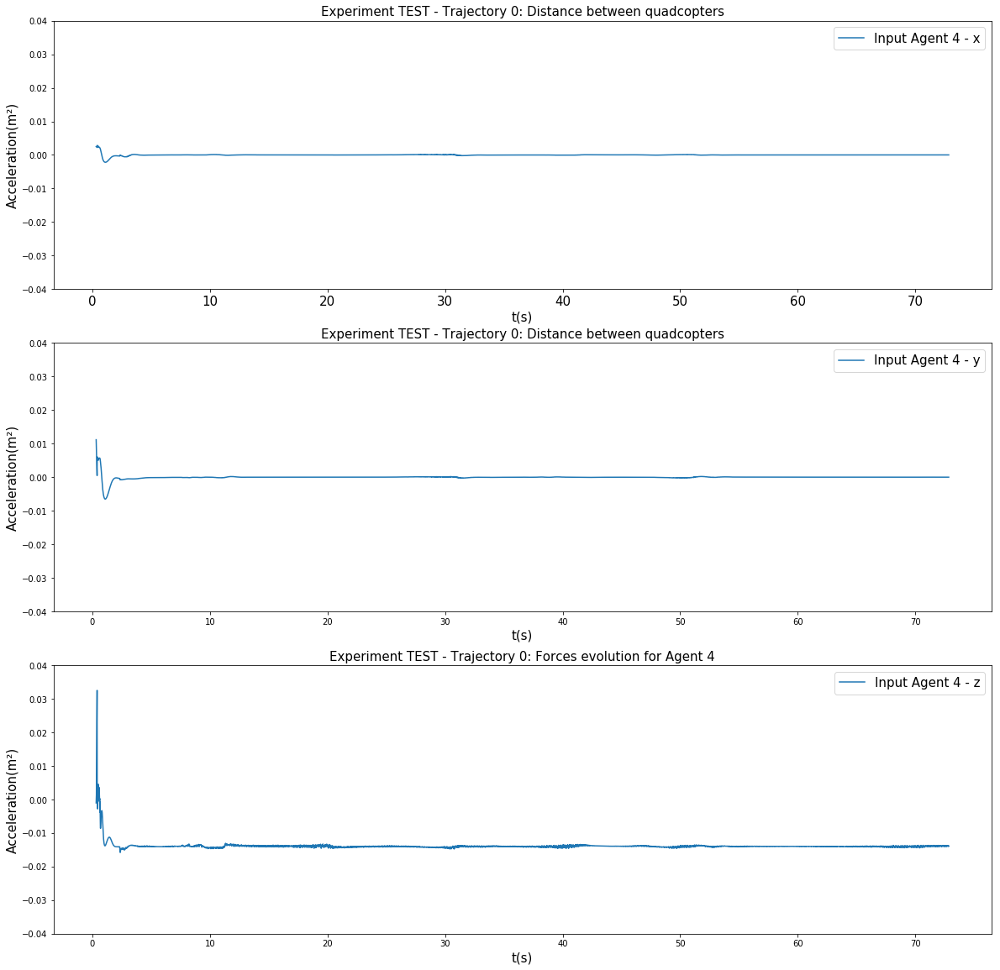

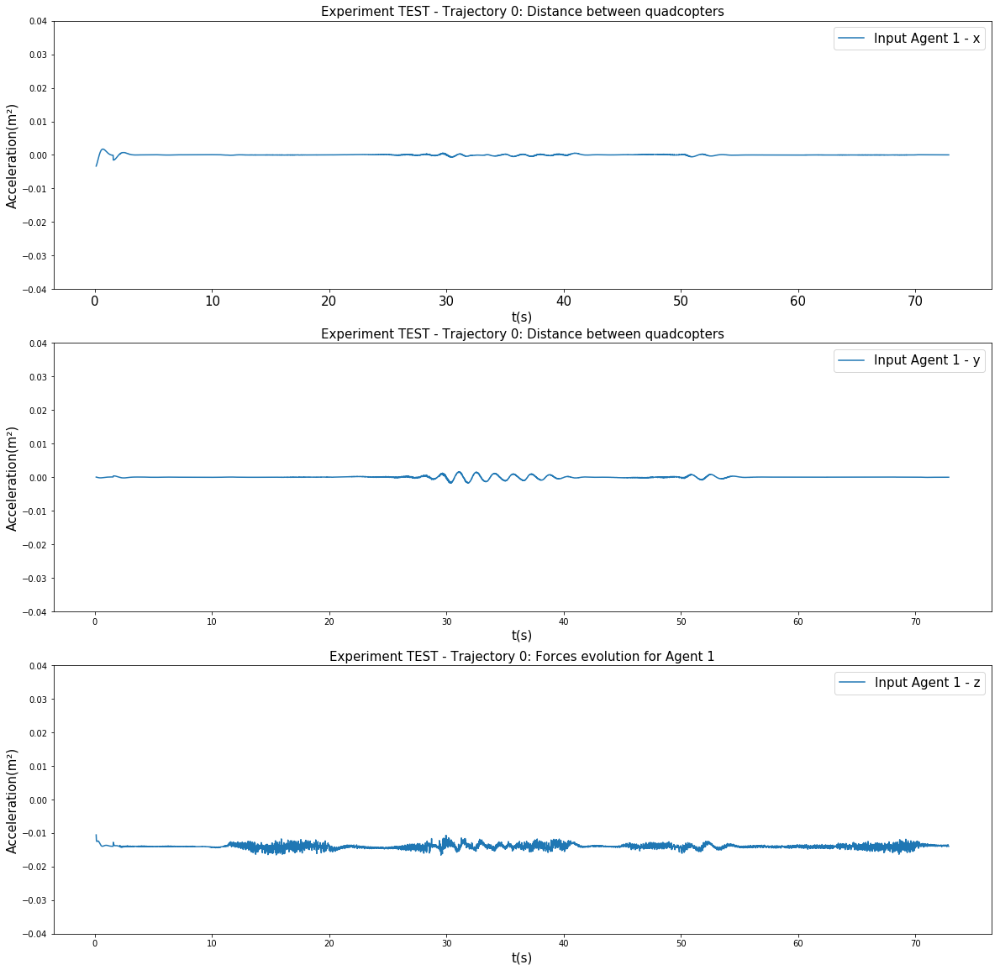

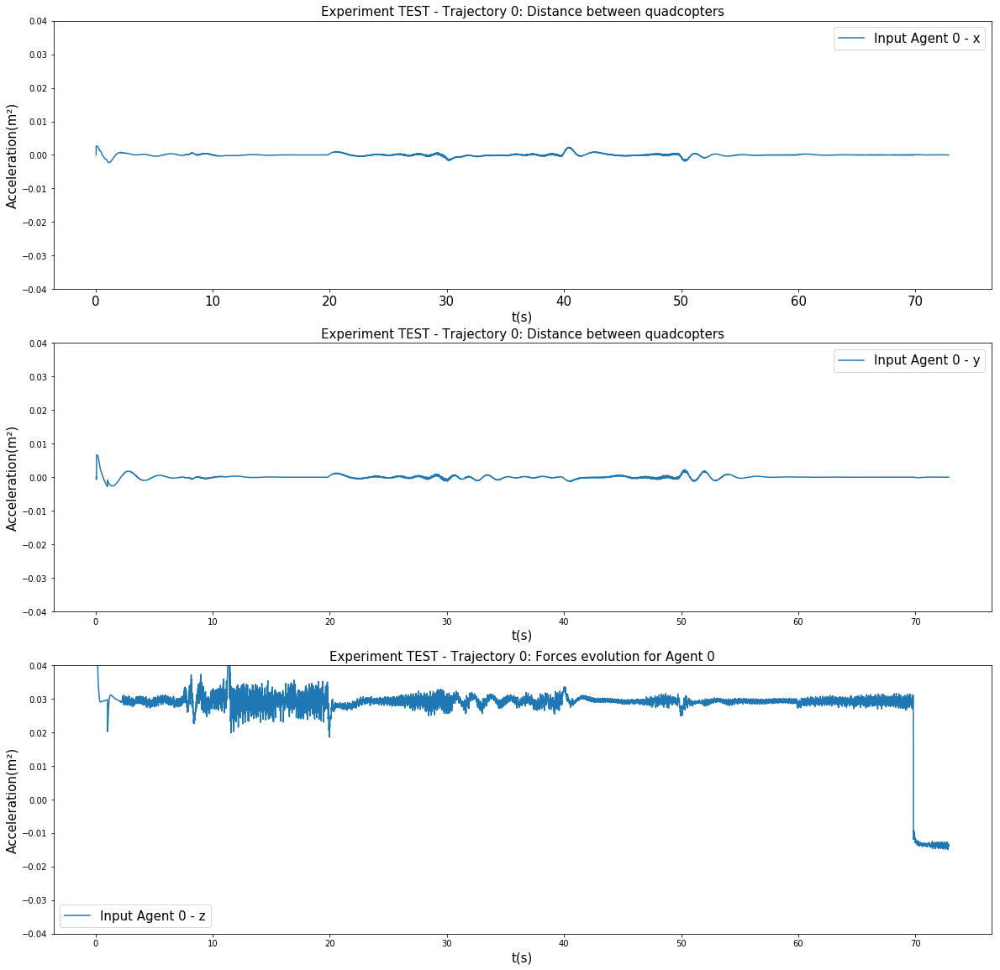

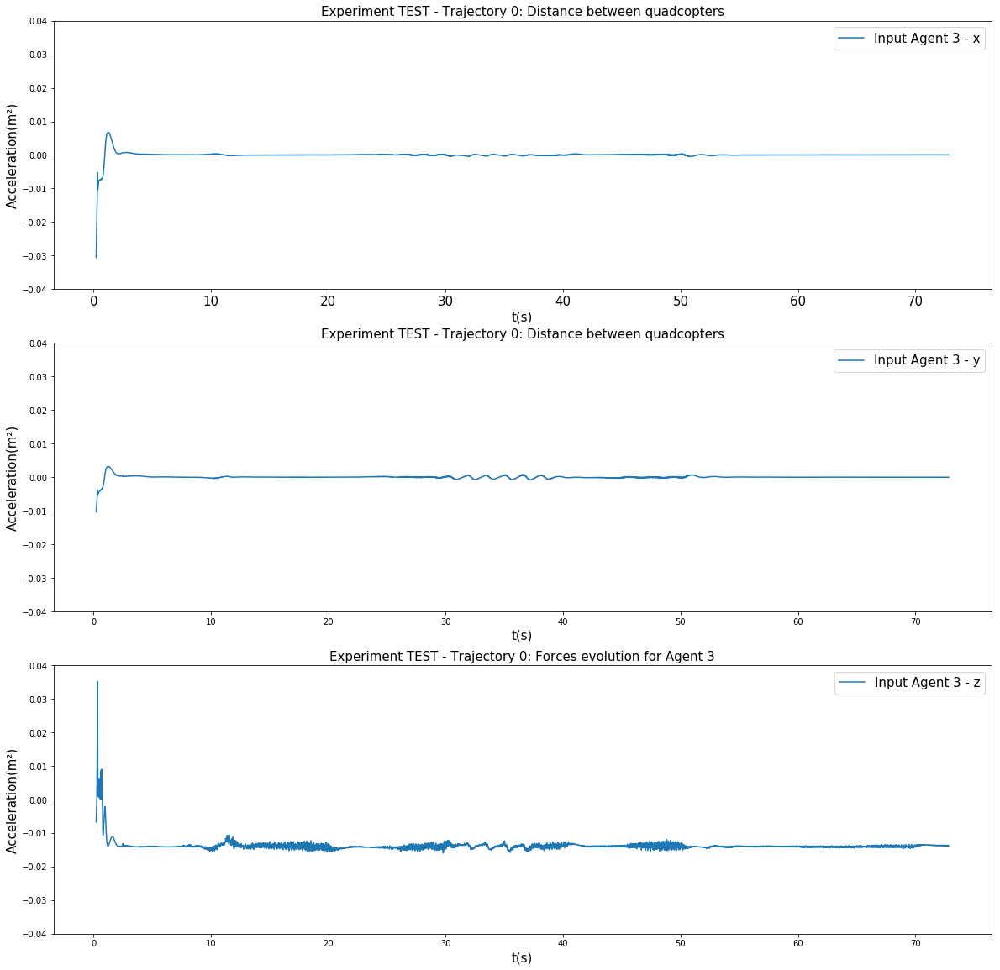

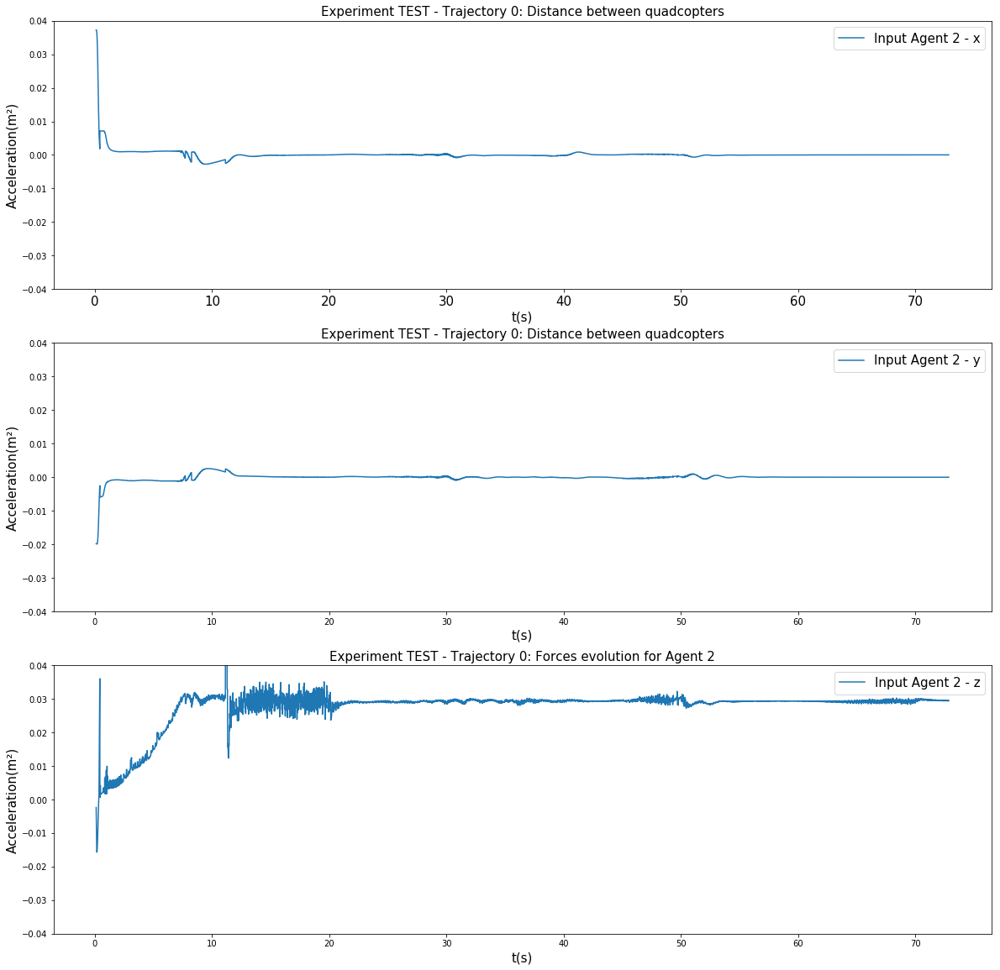

In [73]:
import matplotlib.pyplot as plt

for experiment in data.keys():
    for drone in forcesBetas[experiment].keys():
        fig = plt.figure(figsize=(20, 20))

        ax1 = plt.subplot(311)

        plt.plot( data[experiment]["forces_" + drone]["time"], forcesBetas[experiment][drone]["force"][:, 0], label = "Input Agent " + drone.split("_")[1] + " - x")
        
        plt.ylim([-0.04, 0.04])
        plt.title("Experiment " + experiment.split("_")[0] + " - Trajectory " + experiment.split("_")[1] + ": Distance between quadcopters", fontsize=15)
        plt.ylabel(u"Acceleration(m²)", fontsize=15)   
        plt.xlabel("t(s)", fontsize=15)   
        plt.setp(ax1.get_xticklabels(), fontsize=15)
        plt.legend(fontsize=15, loc='best')
    
        ax2 = plt.subplot(312)

        plt.plot( data[experiment]["forces_" + drone]["time"], forcesBetas[experiment][drone]["force"][:, 1], label = "Input Agent " + drone.split("_")[1] + " - y")
        
        plt.ylim([-0.04, 0.04])
        plt.title("Experiment " + experiment.split("_")[0] + " - Trajectory " + experiment.split("_")[1] + ": Distance between quadcopters", fontsize=15)
        plt.ylabel(u"Acceleration(m²)", fontsize=15)   
        plt.xlabel("t(s)", fontsize=15)   
        plt.setp(ax1.get_xticklabels(), fontsize=15)
        plt.legend(fontsize=15, loc='best')
        
        ax3 = plt.subplot(313)

        plt.plot( data[experiment]["forces_" + drone]["time"], forcesBetas[experiment][drone]["force"][:, 2], label = "Input Agent " + drone.split("_")[1] + " - z")
        
        plt.ylim([-0.04, 0.04])
        plt.title("Experiment " + experiment.split("_")[0] + " - Trajectory " + experiment.split("_")[1] + ": Forces evolution for Agent " + drone.split("_")[1], fontsize=15)
        plt.ylabel(u"Acceleration(m²)", fontsize=15)   
        plt.xlabel("t(s)", fontsize=15)   
        plt.setp(ax1.get_xticklabels(), fontsize=15)
        plt.legend(fontsize=15, loc='best')
        plt.savefig("./images/subplot_axis_forces_experiment_" + experiment + "_" + drone + ".png", bbox_inches='tight')
        plt.savefig("./images/subplot_axis_forces_experiment_" + experiment + "_" + drone + ".eps", bbox_inches='tight')
        plt.show()